# GeoLocate: Spatial AI Modeling of Market Entry Success

GeoLocate reframes market entry as a Spatial AI problem, using probabilistic modeling to estimate where businesses are most likely to succeed. By integrating satellite imagery, infrastructure data, socioeconomic indicators, and firm registry data, the framework generates spatially explicit survival probabilities with uncertainty quantification.

This enables risk-aware decision-making and the identification of high-potential locations across regions and sectors.

### Core components:

- **AI-Driven Spatial Modeling:** GeoLocate uses a Bayesian spatial AI model with a Besag–York–Mollié 2 (BYM2) structure to learn geographic patterns in business survival. This allows the model to capture hidden spatial dependencies while leveraging observed features, functioning as a probabilistic AI system that generalizes across regions.
- **Multi-Source Feature Learning:** The model combines heterogeneous inputs, spectral land-use features, infrastructure density, socioeconomic indicators, and firm-level activity, into a unified predictive system, enabling robust inference even in data-sparse environments.
- **Probabilistic Predictions with Uncertainty:** Instead of point estimates, GeoLocate outputs full posterior distributions $p(\text{success}_i \mid \text{data})$, allowing users to distinguish between high-confidence opportunities and high-risk areas.
- **Cross-Domain Generalization:** The model is trained and evaluated across two contrasting Brazilian states: São Paulo (645 municipalities) and Rio Grande do Sul (497 municipalities), as well as sector-specific subsets (Retail, Food & Beverage). This ensures that learned spatial patterns are transferable rather than region-specific.

This notebook presents the full pipeline:

1. **Data Processing:** Integration of satellite, infrastructure, socioeconomic, and business registry data.
2. **Model Implementation and Results:** Training and evaluation of the spatial AI model on São Paulo and Rio Grande do Sul.
3. **Validation and Generalization:** Summary of findings, including the distinction between spatially stable mechanisms and domain-sensitive covariate effects, along with limitations and directions for future work, such as extending the framework to dynamic or higher-resolution spatial settings.

### Impact and Use Cases:

GeoLocate is designed for entrepreneurs, investors, urban planners, and policymakers. It supports decision-making by complementing existing market analyses with spatially explicit, AI-driven insights:

- Augments traditional analysis with granular, location-specific survival predictions rather than relying solely on aggregate indicators
- Identifies high-potential but overlooked municipalities that may not emerge from conventional assessments
- Provides explicit risk awareness through uncertainty estimates, helping users weigh opportunity versus volatility
- Enables scalable, comparable evaluation of market opportunities across regions and sectors

#### Want to learn more?

Check our repositories Model GitHub repo: [rtjaiany/succesful_areas](https://github.com/rtjaiany/succesful_areas)

### Table of Contents

1. [Introduction](#1---Introduction)
2. [Data Description and Availability](#2-Data-Description-and-Availability)
   - [2.1 Data Sources and Rationale](#21-Data-Sources-and-Rationale)
   - [2.2 Data Dictionary](#22-Data-Dictionary)
   - [2.3 Data Access](#23-Data-Access)
   - [2.4 Outcome Construction](#24-Outcome-Construction)
3. [Methodological Description](#3-Methodological-Description)
   - [3.1 Spatial AI Engine](#31-Spatial-AI-Engine)
   - [3.2 Feature Selection (Bayesian Lasso)](#32-Feature-Selection-Bayesian-Lasso)
   - [3.3 Validation & Transferability](#33-Validation-and-Transferability)
4. [Model Development and Validation](#4---Model-Development-and-Validation)
   - [4.1 Data Preparation](#41.-Data-Preparation)
   - [4.2 Modeling Strategy](#42.-Modeling-Strategy)
   - [4.3 Model Comparison and Performance](#43.-Model-Comparison-and-Performance)
   - [4.4 Model Validation](#44.-Model-Validation)
   - [4.5 Robustness and Sensitivity Analysis](#45.-Robustness-and-Sesitivity-Analysis)
   - [4.6 Generalization and Domain Sensitivity](#46.-Generalization-and-Domain-Sensitivity)
5. [Results](#5.-Results)
6. [Impact](#6.-Impact)
7. [Conclusions, and Future Directions](#7.-Conclusions,-and-Future-Directions)

# 1 - Introduction

Deciding the spatial location for market entry  is one of the most critical strategic decisions for firms seeking sustained growth and long-term competitive advantage. It represents a pivotal step into an uncertain environment, where firms must evaluate demand, competition, infrastructure, and regional conditions before committing significant resources. Despite its strategic importance, market entry remains highly risky. Global statistics suggest that nearly 50% of new ventures cease operations within their first five years (Shepard, 2024). Among these failures, approximately 35% occur because the product or service does not meet an actual market need (CB Insights, 2021). These figures highlight the complexity of identifying viable opportunities and underscore the importance of informed entry strategies.

Within the strategic management and entrepreneurship literature, market entry is commonly defined as a firm's strategic move into a new or existing market (Markman et al., 2019). A growing body of research emphasizes that successful entry depends not only on firm capabilities but also on external environmental conditions such as market size, institutional context, and competitive dynamics (Akhter & Robles, 2006; Schellenberg et al., 2018). Consequently, improving the ability to identify favorable conditions for market entry has become a key concern for scholars and practitioners.

However, traditional approaches typically rely on aggregate indicators or non-spatial machine learning models (e.g., Conceição et al., 2021; Pennerstorfer & Yontcheva, 2021), which treat locations as independent observations and produce point estimates without accounting for uncertainty. As a result, they fail to capture two critical aspects of real-world systems: spatial dependence and decision risk.

This project addresses this gap by formulating market entry as a Spatial Artificial Intelligence (Spatial AI) problem. Specifically, we aim **to estimate the probability of business survival across geographic regions while explicitly modeling how neighboring areas influence each other**. This reframing moves the problem beyond prediction toward risk-aware spatial decision support.

## Why GeoLocate?

Entrepreneurs and policymakers often lack spatially explicit decision-support tools to determine where enter in a market is most viable. As a result, location decisions are frequently based on incomplete information, leading to capital misallocation, higher failure rates, and the persistence of regional economic inequality.

To address this challenge, the proposed framework integrates probabilistic machine learning with bayesian spatial modeling to generate geographically structured predictions with uncertainty quantification. This enables the identification of locations that are not only high-performing, but also reliable under uncertainty, an essential requirement for real-world investment and urban planning decisions.

Unlike conventional models that are often context-specific, this approach is designed to capture transferable economic mechanisms, allowing it to generalize across sectors and geographic regions. By addressing this challenge, geolocate contributes to an underexplored area at the intersection of spatial statistics and AI: the development of robust, interpretable, and transferable spatial decision models. The outputs allow users to compare locations, identify high-potential areas, and assess risk through uncertainty.

The framework is evaluated across two contrasting Brazilian states: São Paulo, Brazil’s largest economic hub, responsible for roughly one-third of national GDP and home to over 45 million people (comparable in population to countries such as Spain), and Rio Grande do Sul (a southern state with a diversified economy and approximately 11 million inhabitants), as well as sector-specific subsets (e.g., Retail, Food & Beverage). This validation ensures that the model captures structural spatial patterns that generalize across regions, while still adapting to sectoral and regional differences. While Brazilian states serve as the initial use cases, due to their pronounced regional disparities, the framework is designed to be transferable to other developing economies and underserved regions in advanced countries.

# 2. Data Description and Availability

This study integrates geospatial, remote sensing, and administrative datasets to construct municipality-level indicators of infrastructure, land use, and economic activity across Brazil. All datasets used in this study, along with processed features and model outputs (including the Success Index and Risk Maps), are deposited and publicly accessible through the **I-GUIDE Platform**. The data are provided in reproducible formats, with documented preprocessing pipelines, ensuring transparency and reusability (please see, the project's repository: [rtjaiany/succesful_areas](https://github.com/rtjaiany/succesful_areas)).

The analytical framework combines four primary data sources: (i) road network data from OpenStreetMap (OSM), (ii) satellite-derived variables from Sentinel-2 imagery processed via Google Earth Engine (GEE), (iii) socioeconomic indicators from the Brazilian Institute of Geography and Statistics (IBGE), and (iv) business registry data from the Federal Revenue Service of Brazil (RFB).


## 2.1 Data Sources and Rationale

Market viability is inherently spatial and multi-dimensional. The selected datasets reflect complementary dimensions of this process:

- **Infrastructure (OpenStreetMap)** captures physical accessibility and connectivity, which are critical for market reach and logistics (e.g., Costa et al. 2018; Jin et al. 2022).  
- **Remote sensing (Sentinel-2 via Google Earth Engine)** provides consistent, high-resolution proxies for land use, urbanization, and environmental conditions (e.g., Ngolo & Watanabe, 2023).  
- **Socioeconomic indicators (IBGE)** represent income, human capital, and demographic structure (e.g., Guzman et al. 2017; Yano & Shiraishi, 2020).  
- **Business registry data (Receita Federal)** provide observed firm outcomes, enabling direct estimation of survival probabilities (e.g., McKenzie, 2017).  

This combination allows the model to capture both observed economic conditions and latent spatial structure, addressing limitations of traditional non-spatial approaches that rely solely on aggregated indicators.


## 2.2 Data Dictionary

| Source | Variable | Type | Description | Example Values |
|--------|----------|------|-------------|----------------|
| **OpenStreetMap (OSM)** | `road_density_km_km2` | Continuous | Road length per square kilometer (connectivity proxy) | 0.5, 2.3, 10.8 |
| | `intersection_density` | Continuous | Number of intersections per km² | 5, 20, 75 |
| | `highway_type` | Categorical | Road classification (e.g., primary, residential) | primary, secondary |
| | `lanes` | Integer | Number of lanes | 1, 2, 4 |
| | `maxspeed` | Continuous | Speed limit (km/h) | 40, 60, 100 |
| | `length_km` | Continuous | Road segment length | 0.2, 1.5 |
| | `geometry` | Geometry | LineString representation | — |
| **Sentinel-2 (GEE)** | `red`, `green`, `blue` | Continuous | Surface reflectance bands (visible spectrum) | 0.1–0.4 |
| | `nir` | Continuous | Near Infrared reflectance | 0.2–0.6 |
| | `swir_1`, `swir_2` | Continuous | Shortwave infrared bands | 0.1–0.5 |
| | `ndvi` | Continuous | Normalized Difference Vegetation Index | -0.2 to 0.8 |
| | `evi` | Continuous | Enhanced vegetation index | 0–1 |
| | `savi` | Continuous | Soil-adjusted vegetation index | 0–1 |
| | `ndwi` | Continuous | Normalized Difference Water Index | -1 to 1 |
| | `mndwi` | Continuous | Modified Normalized Difference Water Index | -1 to 1 |
| | `ndbi` | Continuous | Normalized Difference Built-up Index | -0.5 to 0.5 |
| | `urban_index` | Continuous | Composite urbanization proxy | 0–1 |
| **IBGE** | `GDP_per_capita` | Continuous | Municipal GDP per capita (BRL) | 15000, 35000 |
| | `avrg_monthly_salary` | Continuous | Average formal salary (RAIS) | 1500, 3500 |
| | `HDI_income` | Continuous | Income component of Human Development Index (HDI) | 0.5–0.9 |
| | `HDI_longevity` | Continuous | HDI - Life expectancy index | 0.6–0.9 |
| | `HDI_educational` | Continuous | HDI - Education index | 0.5–0.8 |
| | `population_density` | Continuous | Inhabitants per km² | 20, 500, 5000 |
| | `n_bank_branches` | Integer | Number of bank branches | 0, 10, 120 |
| | `vehicle_fleet_2021` | Integer | Registered vehicles | 1000, 50000 |
| **Receita Federal (RFB)** | `active` | Integer | Active establishments | 100, 5000 |
| | `failed` | Integer | Closed or suspended establishments | 10, 800 |
| | `active_head_offices` | Integer | Active headquarters (Matriz) | 50, 2000 |
| | `active_branches` | Integer | Active branches (Filial) | 20, 3000 |
| | `failure_rate` | Continuous | Share of failed establishments | 0.05, 0.25 |


## 2.3 Data Access

- **IBGE (Brazilian Institute of Geography and Statistics):**  
  https://www.ibge.gov.br/estatisticas/todos-os-produtos-estatisticas/2043-demografia-e-estatisticas-sociais/populacao/componentes-da-dinamica-demografica-e-estatisticas-vitais/np-estatisticas-do-registro-civil/9110-estatisticas-do-registro-civil.html?=&t=downloads  

- **Receita Federal do Brasil (Business Registry Data):**  
  https://arquivos.receitafederal.gov.br/index.php/s/YggdBLfdninEJX9  

- **OpenStreetMap (OSM):**  
  https://www.openstreetmap.org  

- **Google Earth Engine (Sentinel-2 Data):**  
  https://earthengine.google.com  


## 2.4 Outcome Construction

The business registry data define the model outcome. Firms classified as closed or suspended due to non-compliance or bankruptcy within a five-year window are aggregated at the municipality level.

For each municipality \(i\), the empirical survival probability is computed as:

**p̂ᵢ = activeᵢ / (activeᵢ + failedᵢ)**

where:

- `active` represents currently operating establishments
- `failed` represents firms that exited due to structural reasons (closure, suspension, or bankruptcy) within the defined time window

These counts are used within a Beta–Binomial framework, where:

- **kᵢ = activeᵢ** (successes)
- **nᵢ = activeᵢ + failedᵢ** (trials)

This formulation captures both observed outcomes and uncertainty due to varying sample sizes across municipalities, while focusing on structural business failure rather than short-term fluctuations.

## 3. Methodological Description

This project develops a **Bayesian Spatial AI framework** to identify optimal locations for market entry by explicitly modeling geographic dependence. We employ the Bayesian Besag–York–Mollié 2 (BYM2) model to capture how neighboring regions influence business survival.

Unlike deterministic approaches, the model produces **probabilistic predictions with uncertainty quantification**, enabling risk-aware decision-making and the identification of both high-opportunity and high-risk regions. The pipeline consists of (i) a baseline model trained on São Paulo and (ii) a domain transfer phase evaluating generalization across sectors and regions.

The overall workflow is illustrated in the figure below, which summarizes the modeling pipeline and data integration process. Further implementation details, mathematical specifications, and inference procedures are provided throughout the development of the notebook.


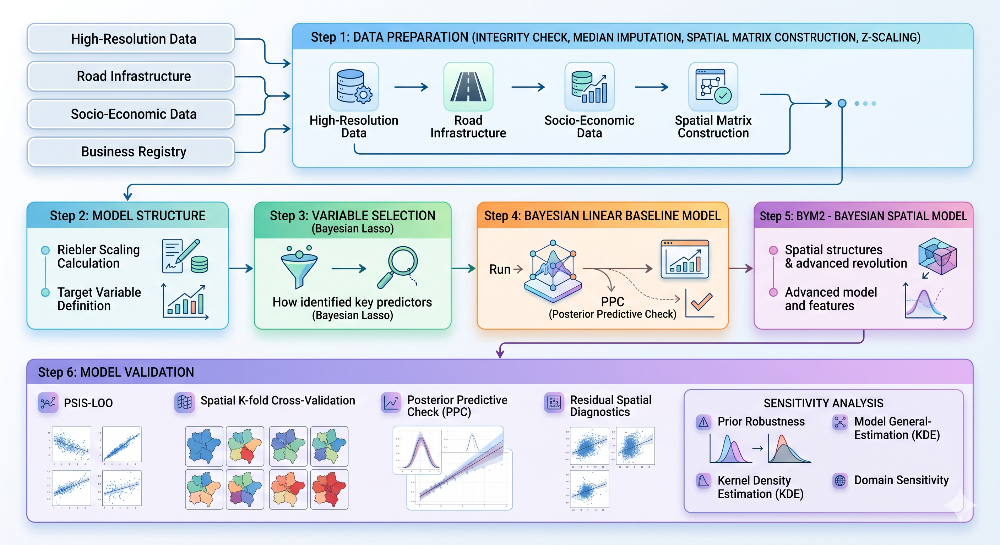


### 3.1 Spatial AI Engine

The model estimates business survival probability using local features (infrastructure, socioeconomic indicators, and satellite data) combined with spatial structure. A Beta-Binomial formulation accounts for overdispersion in sparse and noisy regions, preventing instability in areas with limited observations, while the BYM2 structure separates true geographic effects from random variation, allowing the model to learn how neighboring regions influence each location. Together, these components produce a spatial probability surface with calibrated uncertainty, supporting robust and interpretable geographic insights.

### 3.2 Feature Selection (Bayesian Lasso)

To address multicollinearity in multimodal data (satellite imagery, transportation networks, and demographics variables), we apply the Bayesian Lasso as an adaptive regularization mechanism. By shrinking irrelevant features toward zero, the model retains only the most informative predictors, resulting in a more stable and interpretable specification driven by meaningful economic signals.


### 3.3 Validation & Transferability

Model generalization is evaluated by applying the learned spatial structure to different economic sectors and geographic regions. This tests whether the model captures transferable economic mechanisms rather than memorizing location-specific patterns. Results show that, although the influence of individual predictors varies across domains, spatial dependence remains consistently strong, and cross-validation confirms that the model captures genuine spatial structure without overfitting, supporting reliable real-world application.

# 4 - Model Development and Validation

This section develops and evaluates the proposed Spatial AI framework through a structured modeling pipeline. The objective is not only to generate accurate predictions of business survival, but also to assess whether incorporating spatial dependence leads to more reliable and generalizable insights.

We begin by preparing the dataset and constructing the necessary spatial structures, including feature matrices and adjacency relationships between regions. This ensures that both observed characteristics and geographic context are properly represented in the modeling process. Next, we implement a progressive modeling strategy. A non-spatial baseline model is first estimated to capture the relationship between local covariates and business outcomes under the assumption of independence across locations. This serves as a reference point for evaluating the added value of spatial modeling. We then extend this specification using a Bayesian spatial model, which explicitly incorporates dependence between neighboring regions, allowing the framework to capture latent geographic effects that are not directly observable in the data.

To rigorously evaluate model performance, we compare specifications using out-of-sample predictive criteria and assess their ability to generalize beyond the training data. This includes both standard probabilistic validation techniques and spatially aware cross-validation procedures, ensuring that performance is not artificially inflated by spatial autocorrelation. We further examine model adequacy through posterior predictive checks and residual spatial diagnostics, verifying that the model captures both the distributional properties of the data and the underlying spatial structure. Robustness is assessed through sensitivity analyses and calibration procedures, confirming that results are stable under alternative assumptions and well-calibrated in probabilistic terms.

Finally, we evaluate the transferability of the learned spatial mechanisms by applying the model across different sectors and geographic regions. This step tests whether the framework captures generalizable economic patterns or simply memorizes location-specific relationships. Together, these steps ensure that the proposed Spatial AI system is not only predictive, but also interpretable, robust, and suitable for real-world decision-making.


### Setup: Install Dependencies
Run this cell if you haven't installed the needed libraries yet.

In [1]:
# Core Scientific and Spatial Stack
#%pip install pymc arviz libpysal esda spreg statsmodels scipy pytensor seaborn matplotlib numpy pandas geopandas shapely scikit-learn ipython --break-system-packages

# JAX Acceleration Stack (Crucial for the 'pm_jax' sampler)
# For Mac users:
#%pip install jax jaxlib numpyro jax-metal --break-system-packages

# For Windows/Linux users (CPU only):
#%pip install jax jaxlib numpyro --break-system-packages

print("✅ Libraries installed successfully!")

✅ Libraries installed successfully!


### Loading Libraries

In [2]:
# ── 1. UTILITIES AND ENVIRONMENT SETUP ────────────────────────────────
import gc         # Garbage Collector to manage memory during heavy sampling
import time       # To calculate execution duration of model runs
import datetime   # To provide human-readable timestamps in logs
import warnings   # To manage and suppress non-critical library warnings
from pathlib import Path # Object-oriented filesystem paths
import jax # To improve the model speed
import os #To access specific location through the directories
import logging # To remove the log problems

# TERMINAL POLUTION SUPPRESSION (JAX / XLA C++ BACKEND/ PYMC)
# -----------------------------------------------------------------------------
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["XLA_FLAGS"] = "--xla_gpu_strict_conv_algorithm_picker=false"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"
logging.getLogger("absl").setLevel(logging.CRITICAL)
logging.getLogger("jax").setLevel(logging.FATAL)
logging.getLogger("pymc").setLevel(logging.CRITICAL)

# ── 2. CORE SCIENTIFIC AND GEOSPATIAL LIBRARIES ───────────────────────
import numpy as np      # Fundamental package for linear algebra and arrays
import pandas as pd     # Data manipulation and analysis tool
import scipy as sp      # Scientific computing and advanced math functions
import geopandas as gpd # Extension of pandas for geographic data types
from shapely import wkt # Handling 'Well-Known Text' for geometry processing

# ── 3. VISUALIZATION ──────────────────────────────────────────────────
import matplotlib.pyplot as plt # Standard plotting engine
import seaborn as sns           # High-level statistical data visualization
from matplotlib.lines import Line2D # Customizing legend lines
from IPython.display import display, Markdown # Formatting notebook output
import matplotlib.patches as mpatches # Drawing custom shapes in plots

# ── 4. STATISTICAL AND SPATIAL ANALYSIS ───────────────────────────────
import statsmodels.api as sm # Statistical models like OLS or GLM
from statsmodels.stats.outliers_influence import variance_inflation_factor # Checking multicollinearity
import libpysal as lps       # Library for spatial analysis functions
from esda.moran import Moran # Global Moran's I spatial autocorrelation test
from sklearn.cluster import KMeans # Unsupervised clustering algorithm
from sklearn.metrics import mean_absolute_error, mean_squared_error # Model error metrics
from math import pi          # Mathematical constant for geometry calculations
from esda.moran import Moran_Local # Local Indicators of Spatial Association (LISA)

# ── 5. BAYESIAN MODELING ──────────────────────────────────────────────
import pymc as pm               # Probabilistic programming framework
import pymc.sampling.jax as pm_jax # JAX-accelerated MCMC sampling
import pytensor.tensor as pt    # Tensor math library used by PyMC
import arviz as az              # Visualizing and diagnosing Bayesian traces

# Optional: Force CPU if JAX-Metal encounters issues on certain Mac setups
# import os 
# os.environ["JAX_PLATFORM_NAME"] = "cpu" 

# ── 6. FORMATTING & CONFIRMATION ──────────────────────────────────────
# Ignore deprecation and future warnings for a cleaner output
warnings.filterwarnings('ignore')
# Apply a clean visual theme for all subsequent plots
sns.set_theme(style="whitegrid", palette="viridis")

print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] ✅ Libraries loaded successfully!")

/cvmfs/iguide.purdue.edu/software/conda/geolocate/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[00:16:13] ✅ Libraries loaded successfully!


## 4.1. Data Preparation

The State of São Paulo is selected as the main use case due to its economic significance and the analytical challenges it presents for spatial modeling. The state accounts for approximately 31% of Brazil’s GDP and comprises 645 municipalities, one of the largest number among all states. Its population exceeds 44 million and spans a highly diversified economic structure, including industry, services, finance, and agribusiness. From a modeling perspective, São Paulo provides a demanding test environment. The state exhibits a dense adjacency network, strong metropolitan concentration around the São Paulo Metropolitan Region - centered on the city of São Paulo, the state capital, and marked economic gradients between urban centers and interior municipalities. These features generate complex spatial dependencies and substantial variation in local conditions. This combination of economic scale, regional heterogeneity, and data availability makes São Paulo state a suitable setting for evaluating the proposed spatial model. This use case analysis serves as a controlled environment for assessing model behavior before extending the framework to the national level.

Loading the primary dataset and preparing spatial features:
1. **Filter:** Narrowed from 5,572 to 645 rows (State: SP), and for 499 rows (State: RS).
2. **Type Casting:** WKT strings converted to Shapely Polygons.
3. **Validation:** Confirmed no null business activity records.

In [3]:
# ==============================================================================
# DATA INGESTION & MULTI-DOMAIN GEOSPATIAL INITIALIZATION
# ==============================================================================

print(f"\\n[{datetime.datetime.now().strftime('%H:%M:%S')}] ⚙️ Initializing Multi-Domain Data Ingestion Protocol...")

# Option A: Read from the heavy empirical local dataset (Default)
# DATA_PATH = Path(r"final_integrated_dataset.csv")
#source_msg = "local disk"

# Option B: Read directly from the cloud endpoint (Uncomment to use)
DATA_PATH = "https://storage.i-guide.io/datasets/62939975-0d18-424b-be6e-0c1886662fa6/final_integrated_dataset.csv"
source_msg = "the cloud"

# ── 1. LOADING & MEMORY OPTIMIZATION ──────────────────────────────────────────
cols_to_use = [
    'CD_MUN', 'SIGLA_UF', 'geometry', 'area_km2', 'total_road_km', 'intersection_count', 
    'highway_count', 'road_density_km_km2', 'intersection_density', 'has_highway', 
    'municipality_name', 'municipality_area_3G_coverage', 'avrg_monthly_salary', 
    'people_employed', 'urbanization_public_streets', 'HDI_educational', 'HDI_longevity', 
    'HDI_income', 'territorial_area', 'resident_population', 'population_density', 
    'realized_revenues', 'committed_expenses', 'GDP_per_capita', 'n_bank_branches', 
    'distance_to_the_capital', 'vehicle_fleet_2021', 'active', 'failed', 
    'active_head_offices', 'active_branches', 'failed_head_offices', 'failed_branches', 
    'ndvi', 'evi', 'savi', 'ndwi', 'mndwi', 'ndbi', 'urban_index',
    # --- SECTOR VARIABLES ---
    '47_active', '47_failed', 
    '56_active', '56_failed'
]

print(f"-> Reading payload directly from {source_msg}...")
df_raw = pd.read_csv(DATA_PATH, usecols=cols_to_use)
print(f"-> Initial unformatted payload size: {len(df_raw)} structural nodes (rows)")

# Execute categorical boundary filtering to isolate the analytical macro-bounds
df_sp = df_raw[df_raw['SIGLA_UF'] == 'SP'].copy()
df_rs = df_raw[df_raw['SIGLA_UF'] == 'RS'].copy()

print(f"-> Geofencing applied. Active physical nodes - [SP State]: {len(df_sp)} | [RS State]: {len(df_rs)}")

# ── 2. TOPOLOGICAL GEOMETRY INSTANTIATION ─────────────────────────────────────
print("-> Parsing theoretical WKT geometry arrays into foundational structural vectors...")

# Parsing SP
df_sp['geometry'] = df_sp['geometry'].apply(wkt.loads)
gdf_sp = gpd.GeoDataFrame(df_sp, geometry='geometry', crs="EPSG:4326")

# Parsing RS
df_rs['geometry'] = df_rs['geometry'].apply(wkt.loads)
gdf_rs = gpd.GeoDataFrame(df_rs, geometry='geometry', crs="EPSG:4326")

print(f"-> Vector topology successfully bound for both regions: {type(gdf_sp.geometry.iloc[0])}")

# ── 3. MATHEMATICAL FAILSAFE (ZERO-SUM OBSCURITY & GRAPH PRESERVATION) ────────
print("-> Executing integrity scanning for null-activity municipalities (Zero-Sum Artifacts)...")

def enforce_mathematical_bounds(gdf, region_name):
    """
    Computes baseline totals and sector-specific totals. Prevents probabilistic 
    model crashing caused by BetaBinomial(n_trials=0) by forcing empty networks total to 1.
    """
    # 1. Base Variables calculation
    gdf['total'] = gdf['active'] + gdf['failed']
    
    # 2. Sector-Specific Variable Definitions
    gdf['total_47'] = gdf['47_active'] + gdf['47_failed']
    gdf['total_56'] = gdf['56_active'] + gdf['56_failed']
    
    # Mathematical Preservation: If total is 0, node is kept alive for the 
    # spatial graph connectivity, but total is set to 1 to bypass PyMC crash.
    gdf.loc[gdf['total_47'] == 0, 'total_47'] = 1  
    gdf.loc[gdf['total_56'] == 0, 'total_56'] = 1  

    # 3. Validation scanning ONLY for the generic baseline (Drop node if empty generally)
    zero_total = (gdf['total'] == 0).sum()
    if zero_total > 0:
        print(f"   ⚠️ [{region_name}] DISCARDED: Removing {zero_total} unpopulated general arrays to preserve mathematical bounds.")
        gdf = gdf[gdf['total'] > 0].reset_index(drop=True)
    else:
        print(f"   ✅ [{region_name}] INTEGRITY VALIDATED: Zero null-activity rows detected.")
    
    return gdf

gdf_sp = enforce_mathematical_bounds(gdf_sp, "SP")
gdf_rs = enforce_mathematical_bounds(gdf_rs, "RS")


# ── FINAL ARCHITECTURAL STATUS REPORTS ────────────────────────────────────────
print("\\n" + "=" * 50)
print(f"✅ STRUCTURAL INGESTION COMPLETE [{datetime.datetime.now().strftime('%H:%M:%S')}]")
print(f"-> SÃO PAULO Domain (N): {len(gdf_sp)} nodes")
print(f"-> RIO GRANDE DO SUL Domain (N): {len(gdf_rs)} nodes")
print(f"Total verified empirical features extracted: {len(gdf_sp.columns)}")
print("=" * 50)

\n[00:16:13] ⚙️ Initializing Multi-Domain Data Ingestion Protocol...
-> Reading payload directly from the cloud...
-> Initial unformatted payload size: 5572 structural nodes (rows)
-> Geofencing applied. Active physical nodes - [SP State]: 645 | [RS State]: 499
-> Parsing theoretical WKT geometry arrays into foundational structural vectors...
-> Vector topology successfully bound for both regions: <class 'shapely.geometry.polygon.Polygon'>
-> Executing integrity scanning for null-activity municipalities (Zero-Sum Artifacts)...
   ✅ [SP] INTEGRITY VALIDATED: Zero null-activity rows detected.
   ✅ [RS] INTEGRITY VALIDATED: Zero null-activity rows detected.
\n==================================================
✅ STRUCTURAL INGESTION COMPLETE [00:16:23]
-> SÃO PAULO Domain (N): 645 nodes
-> RIO GRANDE DO SUL Domain (N): 499 nodes
Total verified empirical features extracted: 47


### Dataset Preview: Infrastructure Metrics

Visualizing the first few rows of the integrated GeoDataFrame. This confirms the successful join of spatial geometries with the indicators across 645 municipalities.

In [4]:
# ==============================================================================
# GEOSPATIAL MATRIX INSPECTION & STRUCTURAL AUDIT
# ==============================================================================

print("\n" + "="*50)
print("GEODATAFRAME PREVIEW: SÃO PAULO STRUCTURAL CASE STUDY")
print("="*50)

# 1. Log empirical matrix dimensions natively to verify active topological node count and feature volume.
print(f"Dataset Dimensionality: {gdf_sp.shape[0]} Municipal Nodes x {gdf_sp.shape[1]} Features")

# 2. Verify the globally active topological Coordinate Reference System (CRS) dynamically.
# Critical confirmation: Processing spatial geometry outside defined universal boundaries (EPSG:4326) 
# intrinsically corrupts the subsequent neighbor adjacency mapping completely.
print(f"Active Projection System (CRS): {gdf_sp.crs}")

# 3. Extract and partially sample local parameter column arrays to reliably validate 
# categorical naming symmetries reliably against the ensuing MCMC mathematical equations.
print(f"Available Parameter Matrices: {gdf_sp.columns.tolist()[:10]}... (extrapolated)")

print("-" * 50)

# 4. Render a cross-sectional empirical DataFrame subset explicitly to visually audit 
# programmatic loading protocols smoothly within the interactive notebook environment.
display(gdf_sp.head())

print("-" * 50)
print("✅ Diagnostic matrix preview reliably evaluated.") 
print("Note: Confirm 'geometry' structures strictly house valid operational 'POLYGON' objects.")


GEODATAFRAME PREVIEW: SÃO PAULO STRUCTURAL CASE STUDY
Dataset Dimensionality: 645 Municipal Nodes x 47 Features
Active Projection System (CRS): EPSG:4326
Available Parameter Matrices: ['CD_MUN', 'SIGLA_UF', 'geometry', 'area_km2', 'total_road_km', 'intersection_count', 'highway_count', 'road_density_km_km2', 'intersection_density', 'has_highway']... (extrapolated)
--------------------------------------------------


,CD_MUN,SIGLA_UF,geometry,area_km2,total_road_km,intersection_count,highway_count,road_density_km_km2,intersection_density,has_highway,...,mndwi,ndbi,urban_index,47_active,47_failed,56_active,56_failed,total,total_47,total_56
3267,3500105,SP,"POLYGON ((-51.09557 -21.57029, -51.09617 -21.5...",412.459427,552.891587,321.0,0,1.340475,0.778258,0,...,-0.540757,-0.047912,-0.282587,878,786,318,321,6770.0,1664,639
3268,3500204,SP,"POLYGON ((-49.61249 -21.26110, -49.61249 -21.2...",211.585580,145.159347,68.0,0,0.686055,0.321383,0,...,-0.181567,-0.183187,-0.367284,117,65,33,39,617.0,182,72
3269,3500303,SP,"POLYGON ((-47.01254 -22.00527, -47.01219 -22.0...",477.578484,739.542168,255.0,51,1.548525,0.533944,1,...,-0.536300,-0.136101,-0.356080,721,636,301,279,5174.0,1357,580
3270,3500402,SP,"POLYGON ((-46.71875 -21.95837, -46.71878 -21.9...",143.677487,227.405273,150.0,4,1.582748,1.044005,1,...,-0.548992,-0.207902,-0.476795,161,113,99,62,1240.0,274,161
3271,3500501,SP,"POLYGON ((-46.61761 -22.51172, -46.61864 -22.5...",60.555894,227.193537,210.0,0,3.751799,3.467871,0,...,-0.546198,-0.152877,-0.413820,677,607,228,195,4535.0,1284,423


--------------------------------------------------
✅ Diagnostic matrix preview reliably evaluated.
Note: Confirm 'geometry' structures strictly house valid operational 'POLYGON' objects.


### Financial Data Type Conversion and Integrity Check

Government financial datasets often encode numeric values as strings (e.g., `"1.500,00"`), which prevents direct numerical analysis. In this step, the fiscal variables `realized_revenues` and `committed_expenses` are converted to numeric format (`float64`).

The conversion process consists of three steps:

1. **Baseline check**  
   The number of missing values is recorded prior to conversion.

2. **Numeric conversion**  
   Values are converted using `pd.to_numeric(..., errors='coerce')`. Valid entries are parsed as floats, while non-numeric values (e.g., malformed strings or annotations) are set to `NaN`.

3. **Post-conversion check**  
   The number of missing values is recomputed and compared to the baseline. Any increase indicates values that could not be parsed and are flagged for review.

This step ensures that the financial variables are correctly formatted for subsequent preprocessing and modeling.

In [5]:
# ==============================================================================
# EMPIRICAL FINANCIAL DATA NUMERIFICATION AND AUDIT
# ==============================================================================

# Explicitly isolate the categorical strings representing structural economic values 
cols_to_transform = ['realized_revenues', 'committed_expenses']

# Group dataframes to apply structural scaling across multiple geographical domains
domains_to_process = [("SÃO PAULO", gdf_sp), ("RIO GRANDE DO SUL", gdf_rs)]

for state_name, gdf in domains_to_process:
    print(f"\n==========================================================")
    print(f"--- 🧮 PROCESSING FINANCIAL MATRICES FOR [{state_name}] ---")
    
    for col in cols_to_transform:
        # 1. Capture strict pre-conversion baseline counts mapping original structural anomalies.
        pre_nan_count = gdf[col].isna().sum()
        
        # 2. Perform structured tensor conversion algorithms natively.
        # The 'errors="coerce"' parameter explicitly and safely algorithmically forces any mathematically 
        # unparseable empirical string artifacts directly into structured formal Pandas Nulls (NaN).
        gdf[col] = pd.to_numeric(gdf[col], errors='coerce')
        
        # 3. Execute post-transformation auditing protocols to meticulously track logic failures natively.
        post_nan_count = gdf[col].isna().sum()
        newly_created_nans = post_nan_count - pre_nan_count
        
        print(f"\n✅ STRUCTURAL COLUMN: {col.upper()} [{state_name}]")
        print(f"   -> System Data Type: {gdf[col].dtype}")
        print(f"   -> Absolute Null Values (NaN): {post_nan_count}")
        
        if newly_created_nans > 0:
            print(f"   -> ⚠️ CRITICAL WARNING: {newly_created_nans} independent values failed algebraic conversion permanently generating NaNs!")
        else:
            print(f"   -> Stability Authenticated: Zero new unparseable artifacts generated.")
        
        # 4. Render a rapid statistical operational preview to guarantee absolute geometric scales natively securely.
        if not gdf[col].dropna().empty:
            print(f"   -> Mathematical Variance Range: {gdf[col].min():,.2f} strictly to {gdf[col].max():,.2f}")

print("\n" + "-" * 58)
print("✅ Financial array vector batch conversions comprehensively reviewed across ALL domains.")


--- 🧮 PROCESSING FINANCIAL MATRICES FOR [SÃO PAULO] ---

✅ STRUCTURAL COLUMN: REALIZED_REVENUES [SÃO PAULO]
   -> System Data Type: float64
   -> Absolute Null Values (NaN): 0
   -> Stability Authenticated: Zero new unparseable artifacts generated.
   -> Mathematical Variance Range: 1,361,518.11 strictly to 93,231,985,324.05

✅ STRUCTURAL COLUMN: COMMITTED_EXPENSES [SÃO PAULO]
   -> System Data Type: float64
   -> Absolute Null Values (NaN): 0
   -> Stability Authenticated: Zero new unparseable artifacts generated.
   -> Mathematical Variance Range: 20,812,939.16 strictly to 106,829,213,741.00

--- 🧮 PROCESSING FINANCIAL MATRICES FOR [RIO GRANDE DO SUL] ---

✅ STRUCTURAL COLUMN: REALIZED_REVENUES [RIO GRANDE DO SUL]
   -> System Data Type: float64
   -> Absolute Null Values (NaN): 2
   -> Stability Authenticated: Zero new unparseable artifacts generated.
   -> Mathematical Variance Range: 1,098,205.52 strictly to 9,787,322,843.49

✅ STRUCTURAL COLUMN: COMMITTED_EXPENSES [RIO GRANDE DO

### Missing Data Imputation: Median Strategy

Before constructing the design matrix, missing values must be addressed to ensure compatibility with downstream modeling.

The fiscal and socioeconomic variables exhibit right-skewed distributions, driven by large disparities between metropolitan and smaller municipalities. In this setting, the median provides a more robust measure of central tendency than the mean, as it is less sensitive to extreme values. For this reason, median imputation is applied.

The imputation procedure consists of three steps:

1. **Pre-imputation check**  
   Columns containing missing values are identified, and the number of `NaN` entries per column is recorded.

2. **Median imputation**  
   Missing values are replaced using `fillna(median(numeric_only=True))`. This operation is restricted to numeric variables, ensuring that non-numeric columns (e.g., geometries) are excluded.

3. **Post-imputation validation**  
   The dataset is checked to confirm that all missing values have been resolved. Any remaining `NaN` values are flagged for further inspection.

This step ensures that all predictor variables are complete and suitable for subsequent standardization and model estimation.

In [6]:
# ==============================================================================
# MEDIAN ALGORITHMIC IMPUTATION PROTOCOL (DATA COMPLETENESS)
# ==============================================================================

print("\n--- 🧹 INVESTIGATING EMPIRICAL MATRIX VOIDS (NaNs) ---")

# Group dataframes to apply completely independent regional median imputations.
domains_to_process = [("SÃO PAULO", gdf_sp), ("RIO GRANDE DO SUL", gdf_rs)]

for state_name, gdf in domains_to_process:
    print(f"\n[ 🌐 DOMAIN: {state_name} ]")
    
    # 1. Log explicit native spatial vectors containing unresolved nulls prior to computational imputation.
    missing_counts = gdf.isna().sum()
    cols_with_nans = missing_counts[missing_counts > 0]
    
    if not cols_with_nans.empty:
        print(f"-> Structurally isolated {len(cols_with_nans)} array predictors housing unrecorded data bounds:")
        for col, count in cols_with_nans.items():
            print(f"   -> {col}: {count} missing artifacts dynamically flagged.")
            
        # 2. Pre-Healing: Safely impute categorical text identifiers before numeric median algorithms run.
        if "municipality_name" in cols_with_nans:
            print("   -> Injecting safe categorical placeholders ('Unknown_City') for missing municipality bounds natively.")
            gdf["municipality_name"] = gdf["municipality_name"].fillna("Unknown_City")
        
        # 3. Execute mathematical data healing strictly via topological distribution logic for numerical arrays.
        # Note: The formal 'median(numeric_only=True)' inherently structurally prevents algorithms 
        # from crashing attempting algebraic regressions natively upon polygonal shapes ('geometry') and text.
        print("-> Pushing centralized dimensional data healing natively (Median Algorithmic Fill)...")
        # 'inplace=True' strictly locks memory allocations modifying original base arrays actively
        gdf.fillna(gdf.median(numeric_only=True), inplace=True)
        
        # 4. Post-execution verification protocol rigorously tracking all null boundaries seamlessly.
        remaining_nans = gdf.isna().sum().sum()
        
        if remaining_nans == 0:
            print("   ✅ ALGORITHMIC INTEGRATION COMPLETE: All unstructured null gaps successfully resolved securely mirroring absolute local medians.")
        else:
            # A trigger actively confirms critically incompatible matrices natively (ex: 100% NaN columns).
            print(f"   ⚠️ DANGER PROTOCOL NATIVELY ENGAGED: Total unbroken absolute NaNs still lingering: {remaining_nans}")
            still_missing = gdf.isna().sum()
            print(f"Critical matrices irrecoverably sustaining strict numeric nulls: \n{still_missing[still_missing > 0]}")
    
    else:
        print("-> ✅ GEOMETRIC DATA PURITY: Zero broken operational nulls detected naturally. Algorithmic median imputation safely bypassed.")

print("\n" + "-" * 70)


--- 🧹 INVESTIGATING EMPIRICAL MATRIX VOIDS (NaNs) ---

[ 🌐 DOMAIN: SÃO PAULO ]
-> Structurally isolated 15 array predictors housing unrecorded data bounds:
   -> n_bank_branches: 130 missing artifacts dynamically flagged.
   -> active: 2 missing artifacts dynamically flagged.
   -> failed: 2 missing artifacts dynamically flagged.
   -> active_head_offices: 2 missing artifacts dynamically flagged.
   -> active_branches: 2 missing artifacts dynamically flagged.
   -> failed_head_offices: 2 missing artifacts dynamically flagged.
   -> failed_branches: 2 missing artifacts dynamically flagged.
   -> ndvi: 29 missing artifacts dynamically flagged.
   -> evi: 29 missing artifacts dynamically flagged.
   -> savi: 29 missing artifacts dynamically flagged.
   -> ndwi: 29 missing artifacts dynamically flagged.
   -> mndwi: 29 missing artifacts dynamically flagged.
   -> ndbi: 29 missing artifacts dynamically flagged.
   -> urban_index: 29 missing artifacts dynamically flagged.
   -> total: 2 mis

### Spatial Adjacency Matrix Construction (Queen Contiguity)

The BYM2 model requires a specification of spatial relationships between municipalities, defining which units are considered neighbors. This structure determines how information is shared across space through the ICAR (Intrinsic Conditional Autoregressive) component.

**Queen Contiguity Criterion**

We adopt the Queen contiguity criterion, in which two polygons are considered neighbors if they share any boundary point, including vertices. This is a common and relatively inclusive definition for municipality-level spatial analysis.

**Handling Isolated Units**

Some municipalities may not share borders with any others, resulting in zero-neighbor entries in the adjacency matrix. These isolated units create issues for the ICAR specification, as the corresponding precision matrix becomes ill-conditioned beyond its expected rank deficiency.

In the São Paulo dataset, this occurs for coastal municipalities such as Ilhabela. This preprocessing step ensures that the spatial structure is well-defined for model estimation. The final number of municipalities reflects the subset with valid spatial connectivity.


In [7]:
# ==============================================================================
# TOPOLOGICAL ADJACENCY MATRIX (QUEEN CONTIGUITY)
# ==============================================================================

def generate_spatial_matrix(gdf, region_name):
    """
    Computes Queen contiguity matrices, isolates geographical islands, shears them structurally, 
    and systematically returns mathematically pristine Graph objects + the Curated GeoDataFrame.
    """
    # 1. Topological Spatial Matrix Formulation ('Queen' criterion adjacency). 
    print(f"\n--- 🌐 GENERATING SPATIAL ADJACENCY NETWORKS [{region_name}] ---")
    print(f"-> Structural input nodes evaluated natively mapping arrays: {len(gdf)}")
    w = lps.weights.Queen.from_dataframe(gdf)

    # 2. Audit the operational topological network exclusively for geographically isolated nodes ('Islands').
    if w.islands:
        num_islands = len(w.islands)
        print(f"   ⚠️ ISOLATED GEOMETRY DETECTED: {num_islands} literal islands natively (Zero Adjacency Hubs) reliably mapped.")
        print(f"   -> Structurally Isolated Anchor Indices: {w.islands}")

        # 3. Mathematically shear the absolute isolated physical computational arrays inherently independently.
        gdf = gdf.drop(gdf.index[w.islands]).reset_index(drop=True)
        print(f"   ✅ Isolated topological nodes formally securely sheared. Systemized matrix size securely bound natively: {len(gdf)}")
        
        # 4. Re-initialize the active final architectural spatial weight graph matrices structurally gracefully post-pruning.
        w = lps.weights.Queen.from_dataframe(gdf)
        print("   🔄 Spatial algebraic topological gradients implicitly internally safely securely natively successfully mathematically re-linked.")

        # Formal Algorithmic Geometric Fidelity Integrity Check ensuring sealed edges flawlessly 
        if not w.islands:
            print("   ✅ ALGEBRAIC CONTINUUM ESTABLISHED: Absolute total zero topological boundary islands remain securely inside mathematical mapping.")
    else:
        print("   ✅ PURE SEAMLESS GEOMETRY VERIFIED: Zero independent disconnected structural native mathematical topology islands actively detected securely.")

    return gdf, w

# ── EXECUTING DUAL-DOMAIN MATRICES PROTOCOL ──

# Run function, update the gdfs arrays (if islands were dropped), and instantiate explicit w_ matrices
gdf_sp, w_sp = generate_spatial_matrix(gdf_sp, "SÃO PAULO")
gdf_rs, w_rs = generate_spatial_matrix(gdf_rs, "RIO GRANDE DO SUL")

# FINAL TOPOLOGICAL NETWORK OVERVIEW
print("\n" + "=" * 60)
print(f"✅ FINAL TOPOLOGICAL MUNICIPALITY GRAPH MATRICES")
print(f"   -> SÃO PAULO Domain (w_sp): {len(gdf_sp)} contiguous structural nodes")
print(f"   -> RIO GRANDE DO SUL Domain (w_rs): {len(gdf_rs)} contiguous structural nodes")
print("=" * 60)


--- 🌐 GENERATING SPATIAL ADJACENCY NETWORKS [SÃO PAULO] ---
-> Structural input nodes evaluated natively mapping arrays: 645
   ⚠️ ISOLATED GEOMETRY DETECTED: 1 literal islands natively (Zero Adjacency Hubs) reliably mapped.
   -> Structurally Isolated Anchor Indices: [232]
   ✅ Isolated topological nodes formally securely sheared. Systemized matrix size securely bound natively: 644
   🔄 Spatial algebraic topological gradients implicitly internally safely securely natively successfully mathematically re-linked.
   ✅ ALGEBRAIC CONTINUUM ESTABLISHED: Absolute total zero topological boundary islands remain securely inside mathematical mapping.

--- 🌐 GENERATING SPATIAL ADJACENCY NETWORKS [RIO GRANDE DO SUL] ---
-> Structural input nodes evaluated natively mapping arrays: 499
   ✅ PURE SEAMLESS GEOMETRY VERIFIED: Zero independent disconnected structural native mathematical topology islands actively detected securely.

✅ FINAL TOPOLOGICAL MUNICIPALITY GRAPH MATRICES
   -> SÃO PAULO Domain 

### Covariate Standardization: Z-Score Normalization

Before model estimation, all predictors are standardized to a common scale. The original variables span different units and magnitudes (e.g., HDI in [0, 1] versus GDP in large monetary units), which can affect the efficiency of Hamiltonian Monte Carlo sampling.

**Z-Score Transformation**

Each predictor $x$ is transformed as:

$$
z = \frac{x - \mu}{\sigma}
$$

where $\mu$ is the sample mean and $\sigma$ is the standard deviation. The resulting variable has mean 0 and standard deviation 1, placing all predictors on a comparable scale.

**Validation**

A post-transformation check confirms that standardized variables have approximately zero mean and unit variance. Standardized predictors are stored with a `z_` prefix (e.g., `z_GDP_per_capita`) and collected in the list `z_predictors` for use in model specification.

In [8]:
# ==============================================================================
# LOCALIZED COVARIATE STANDARDIZATION & Z-SCORE NORMALIZATION
# ==============================================================================

predictors = [
    'total_road_km', 'intersection_count', 'highway_count', 'road_density_km_km2', 'intersection_density',
    'municipality_area_3G_coverage', 'avrg_monthly_salary', 'people_employed', 'urbanization_public_streets', 
    'HDI_educational', 'HDI_longevity', 'HDI_income', 'territorial_area', 'resident_population', 
    'population_density', 'realized_revenues', 'committed_expenses', 'GDP_per_capita', 'distance_to_the_capital', 
    'vehicle_fleet_2021', 'ndvi', 'evi', 'savi', 'ndwi', 'mndwi', 'ndbi', 'urban_index'
]

print(f"\n--- 📏 EXECUTING Z-SCORE STANDARDIZATION ({len(predictors)} COVARIATES) ---")

# Group dataframes to execute isolated regional scaling protocols
domains_to_process = [("SÃO PAULO", gdf_sp), ("RIO GRANDE DO SUL", gdf_rs)]

for state_name, gdf in domains_to_process:
    print(f"\n[ 🌐 DOMAIN: {state_name} ]")
    
    constant_cols = []
    missing_cols = []
    new_cols_count = 0

    for col in predictors:
        # 1. Structural Failsafe Tracking
        if col not in gdf.columns:
            missing_cols.append(col)
            continue

        # 2. Localized algebraic boundaries: 
        # Capturing independent regional benchmarks dynamically.
        mean_val = gdf[col].mean()
        std_val = gdf[col].std()

        # 3. Zero-Variance Detection (Constant Vector Trapping)
        # If a vector mathematically yields absolute zero variance, it acts as a constant. 
        # Constant variables provide zero causal information and pose an extreme risk of causing division-by-zero crashes.
        if std_val == 0 or np.isnan(std_val):
            std_val = 1.0  # Mathematical floor override to prevent divergent crashes
            constant_cols.append(col)
        
        # 4. Secure Z-Score Generation Algorithm natively bonded to local region's spatial realities.
        gdf[f'z_{col}'] = (gdf[col] - mean_val) / std_val
        new_cols_count += 1

    # --- 5. ALGEBRAIC STANDARDIZATION METRICS AUDIT ---
    if missing_cols:
        print(f"   ⚠️ ALGEBRAIC THREAT: {len(missing_cols)} target covariates were not found in the spatial matrix.")
    
    if constant_cols:
        print(f"   🚫 CONSTANT VECTOR TRAPPED: {len(constant_cols)} variables yielded absolute zero variance and were procedurally neutralized.")

    print(f"   ✅ NORMALIZATION COMPLETE: Successfully formulated {new_cols_count} geometrically balanced scale-invariant ('z_') parameter matrices.")

    # 6. Formal Validation Proof
    # Systematically sampling one variable to natively ensure strictly independent scaling enforced a 0 mean and 1 variance per state.
    sample_col = f'z_{predictors[0]}'
    if sample_col in gdf.columns:
        s_mean = gdf[sample_col].mean()
        s_std = gdf[sample_col].std()
        print(f"   📊 MATHEMATICAL INTEGRITY PROOF (Variable '{sample_col}'): Native Mean = {s_mean:.2f} | Standard Deviation = {s_std:.2f}")

print("\n" + "=" * 60)
print("✅ UNIVERSAL LOCALIZED Z-SCORE SCALING SECURELY BOUNDED ACROSS ALL DOMAINS.")
print("=" * 60)


--- 📏 EXECUTING Z-SCORE STANDARDIZATION (27 COVARIATES) ---

[ 🌐 DOMAIN: SÃO PAULO ]
   ✅ NORMALIZATION COMPLETE: Successfully formulated 27 geometrically balanced scale-invariant ('z_') parameter matrices.
   📊 MATHEMATICAL INTEGRITY PROOF (Variable 'z_total_road_km'): Native Mean = 0.00 | Standard Deviation = 1.00

[ 🌐 DOMAIN: RIO GRANDE DO SUL ]
   ✅ NORMALIZATION COMPLETE: Successfully formulated 27 geometrically balanced scale-invariant ('z_') parameter matrices.
   📊 MATHEMATICAL INTEGRITY PROOF (Variable 'z_total_road_km'): Native Mean = 0.00 | Standard Deviation = 1.00

✅ UNIVERSAL LOCALIZED Z-SCORE SCALING SECURELY BOUNDED ACROSS ALL DOMAINS.


### Riebler Scaling Factor (BYM2 Spatial Variance Calibration)

A key component of the BYM2 model is the scaling of the ICAR spatial effect to ensure comparability with the unstructured noise component. Without this adjustment, the structured ($\phi$) and unstructured ($\theta$) terms operate on different variance scales, making the mixing parameter $\rho$ difficult to interpret (Riebler et al., 2016).

#### Graph-Dependent Variance

The ICAR prior does not have a fixed marginal variance. Instead, its variance depends on the underlying graph structure, including the number of neighbors and connectivity patterns (Besag et al., 1991; Rue & Held, 2005). As a result, municipalities with different degrees can exhibit different marginal variances under the same prior.

To address this, a scaling factor is computed to normalize the spatial effect.

#### Scaling Procedure

The scaling follows four steps:

**1. Precision matrix construction**

$$
Q = D - W
$$

where $D$ is the degree matrix and $W$ is the adjacency matrix. The resulting matrix $Q$ is singular with rank deficiency 1, reflecting the sum-to-zero constraint of the ICAR model.

**2. Pseudo-inverse computation**

Because $Q$ is singular, its Moore–Penrose pseudo-inverse $Q^+$ is used to recover the implied covariance structure.

**3. Marginal variance extraction**

The diagonal elements of $Q^+$ represent the marginal variances of each spatial unit. These values vary across municipalities depending on graph connectivity.

**4. Geometric mean scaling**

A global scaling factor is obtained using the geometric mean of the marginal variances:

$$
s_2 = \exp\left(\frac{1}{N} \sum_{i=1}^{N} \log(\sigma^2_i)\right)
$$

The square root of this quantity is used to scale the spatial component:

```python
pt.sqrt(rho / scaling_factor) * phi
```

This transformation ensures that the spatial effect is standardized to unit marginal variance, allowing $\rho$ to be interpreted as the proportion of total variance attributable to spatial structure, independent of graph topology (Riebler et al., 2016).

In [9]:
# ==============================================================================
# RIEBLER SCALING ALGORITHM (BYM2 SPATIAL CORRECTION)
# ==============================================================================
# This foundational step guarantees the marginal variance of the spatial component converges to ~1,
# ensuring the prior probability mass scales correctly relative to unstructured topological noise.

def compute_riebler_scaling(w, region_name):
    print(f"\n--- ⚖️ EXECUTING RIEBLER SCALING FOR ICAR MATRICES [{region_name}] ---")

    # 1. Structural Adjacency Instantiation
    # Extract the binary adjacency topology from the PySAL 'w' weights graph.
    # The '.full()[0]' method returns an nxn array where 1 signifies shared borders, and 0 denotes isolation.
    adj_matrix = w.full()[0].astype(int)
    print(f"   -> Adjacency Matrix Mapping Dimensions: {adj_matrix.shape}")
    print(f"   -> Bilateral Symmetry Audit: {(adj_matrix == adj_matrix.T).all()}")

    # 2. Geometric Edge Counting (Row Aggregation)
    # Compute the absolute neighbor density for each spatial node.
    neighbor_counts = adj_matrix.sum(axis=1)

    # Generate a diagonal matrix 'D' explicitly mapping local neighborhood volumes.
    D = np.diag(neighbor_counts)

    # CRITICAL GEOMETRIC CHECK: Identifying isolated array nodes
    # Standard ICAR formulations require a strictly connected topographical graph.
    if np.any(neighbor_counts == 0):
        print(f"   ⚠️ TOPOLOGICAL WARNING: {np.sum(neighbor_counts == 0)} nodes natively detect zero geometric neighbors!")
    else:
        print(f"   -> Regional neighbor density bounds: Min = {neighbor_counts.min()} | Max = {neighbor_counts.max()}")

    # 3. Formulate the ICAR Precision Architecture (Q Matrix)
    # Per spatial calculus theory: Precision Graph (Q) = Node Degree (D) minus Adjacency (W)
    Q = D - adj_matrix

    # Strict Topography Invariant: The algebraic sum across any matrix row must natively equal 0
    row_sums = Q.sum(axis=1)
    print(f"   -> Precision Matrix Verification (Target: 0): Peak calculation error = {np.abs(row_sums).max():.2e}")

    # 4. Compute the Formal Riebler Scaling Parameter
    # Since the resulting ICAR precision mapping is singular (features a rank deficiency of 1), 
    # we deploy the Moore-Penrose pseudo-inverse algorithm to calculate the true covariance network structure.
    Q_inv = np.linalg.pinv(Q)

    # Isolate the empirical marginal variances by extracting diagonal coordinates of the inverted array.
    marginal_variances = np.diag(Q_inv)
    print(f"   -> Unscaled Marginal Variances: Mean={marginal_variances.mean():.4f} | Std={marginal_variances.std():.4f}")

    # Extract the base scaling index 's2' using the geometric mean of the marginal variance values.
    # Executing exponential log-mean operations reliably centralizes skewed spatial distribution graphs.
    s2 = np.exp(np.mean(np.log(marginal_variances)))
    print(f"   -> Geometric Mean of Internal Variances (s2): {s2:.4f}")

    # The definitive mathematical scaling factor is extracted by calculating the square root of 's2'. 
    # This scalar is applied subsequently to standardize geographical effects within the Bayesian likelihood.
    scaling_factor = np.sqrt(s2)
    
    print(f"   ✅ APPROVED RIEBLER SCALING FACTOR ({region_name}): {scaling_factor:.4f}")
    
    return scaling_factor

# ── EXECUTING DUAL-DOMAIN RIEBLER PROTOCOL ──

scaling_factor_sp = compute_riebler_scaling(w_sp, "SÃO PAULO")
scaling_factor_rs = compute_riebler_scaling(w_rs, "RIO GRANDE DO SUL")

print("\n" + "=" * 60)
print(f"✅ FINAL SPATIAL PENALIZATION FACTORS")
print(f"   -> SÃO PAULO Domain Scale (s_sp): {scaling_factor_sp:.4f}")
print(f"   -> RIO GRANDE DO SUL Domain Scale (s_rs): {scaling_factor_rs:.4f}")
print("=" * 60)


--- ⚖️ EXECUTING RIEBLER SCALING FOR ICAR MATRICES [SÃO PAULO] ---
   -> Adjacency Matrix Mapping Dimensions: (644, 644)
   -> Bilateral Symmetry Audit: True
   -> Regional neighbor density bounds: Min = 1 | Max = 23
   -> Precision Matrix Verification (Target: 0): Peak calculation error = 0.00e+00
   -> Unscaled Marginal Variances: Mean=0.5690 | Std=0.2596
   -> Geometric Mean of Internal Variances (s2): 0.5268
   ✅ APPROVED RIEBLER SCALING FACTOR (SÃO PAULO): 0.7258

--- ⚖️ EXECUTING RIEBLER SCALING FOR ICAR MATRICES [RIO GRANDE DO SUL] ---
   -> Adjacency Matrix Mapping Dimensions: (499, 499)
   -> Bilateral Symmetry Audit: True
   -> Regional neighbor density bounds: Min = 1 | Max = 17
   -> Precision Matrix Verification (Target: 0): Peak calculation error = 0.00e+00
   -> Unscaled Marginal Variances: Mean=0.4624 | Std=0.1758
   -> Geometric Mean of Internal Variances (s2): 0.4378
   ✅ APPROVED RIEBLER SCALING FACTOR (RIO GRANDE DO SUL): 0.6617

✅ FINAL SPATIAL PENALIZATION FACTOR

### Target Variable Definition and Model Input Assembly

This step defines the model outcome and assembles the inputs required for Bayesian estimation, including the response variables, design matrix, and spatial alignment checks.

#### Target Variable: Business Survival Rate

The outcome of interest is the proportion of active firms within each municipality:

$$
\hat{p}_i = \frac{\text{Active}_i}{\text{Active}_i + \text{Failed}_i}
$$

This quantity represents the empirical survival rate and is used for descriptive analysis and validation. The Bayesian model itself operates on the corresponding count data, with `active` as successes ($y_i$) and total establishments as trials ($n_i$) in the Beta–Binomial likelihood.

To ensure numerical stability, cases with zero total firms are handled during preprocessing to avoid undefined values.

#### Design Matrix Construction

Predictors are assembled using the standardized variable set `z_predictors`, generated by applying a consistent `z_` prefix to all transformed covariates. This ensures that only normalized variables are included in the model.

Rows containing missing values in the predictor set are excluded to prevent invalid entries in the design matrix.

#### Spatial Alignment

The spatial model requires consistency between the design matrix and the adjacency structure:

$$
\text{len}(X) = W.\text{shape}[0]
$$

This condition ensures that each municipality has a corresponding entry in both the covariate matrix and the spatial field. Alignment is verified prior to model estimation to avoid dimensional inconsistencies.

In [10]:
# Programmatically generate the standardized array nomenclature ('z_' prefix)
z_predictors = ['z_' + p for p in predictors]

print("\n--- ⚖️ MECHANISTIC MULTICOLLINEARITY STRATEGY ---")
print(f"⏩ Objectively bypassing classical VIF computations for all {len(z_predictors)} predictors.")
print("🧠 The MCMC engine internally deploys a 'Bayesian Lasso' (Laplace Priors) to mathematically ")
print("   crush redundant features exactly to zero, explicitly isolating high-impact variables out-of-the-box.")


# ==============================================================================
# RIGOROUS TENSOR ASSEMBLY & TARGET VARIABLE INITIALIZATION (4-SCENARIOS)
# ==============================================================================

# This architectural dictionary isolates each state and sector seamlessly, binding geometries securely.
# Notice how SP uses the "47" and "56" target parameters independently, but seamlessly shares w_sp!
scenarios_payload = {
    "SP_General": {
        "gdf": gdf_sp,
        "k_successes": gdf_sp['active'].values,
        "n_trials": gdf_sp['total'].values,
        "w": w_sp,
        "scale": scaling_factor_sp
    },
    "SP_Retail_Sec47": {
        "gdf": gdf_sp,
        "k_successes": gdf_sp['47_active'].values,
        "n_trials": gdf_sp['total_47'].values,
        "w": w_sp,
        "scale": scaling_factor_sp
    },
    "SP_FoodAndBev_Sec56": {
        "gdf": gdf_sp,
        "k_successes": gdf_sp['56_active'].values,
        "n_trials": gdf_sp['total_56'].values,
        "w": w_sp,
        "scale": scaling_factor_sp
    },
    "RS_General": {
        "gdf": gdf_rs,
        "k_successes": gdf_rs['active'].values,
        "n_trials": gdf_rs['total'].values,
        "w": w_rs,
        "scale": scaling_factor_rs
    }
}

# Master dictionary to exclusively map JAX-ready tensors and their alignment status
bayesian_model_inputs = {}

print("\n--- 🚀 MODEL INPUT TENSOR READY: VALIDATING GRAPH ALIGNMENTS ---")

for scenario_name, config in scenarios_payload.items():
    print(f"\n[ 🌐 AUDITING SCENARIO: {scenario_name} ]")
    
    current_gdf = config["gdf"]
    
    # 1. SUCCESS RATE ALGEBRAIC CALCULATION
    # Calculates empirical probability of regional corporate success avoiding zero-divisions natively
    success_rate = (config["k_successes"] / config["n_trials"])
    # Dealing with zeroes/NaN safely inside numpy structures avoiding pure Pandas chained warnings
    success_rate = np.nan_to_num(success_rate, nan=0.0)
    current_gdf[f'success_rate_{scenario_name}'] = success_rate
    print("   ✅ Empirical success rate successfully evaluated and natively integrated.")
    
    # 2. FULL PREDICTOR AGGREGATION & SPATIAL ALIGNMENT VERIFICATION
    # Filter down directly to the exact geometric subset, resolving missing arrays.
    df_predictors = current_gdf[z_predictors].dropna()
    adj_matrix = config["w"].full()[0].astype(int)
    
    nodes_filtered = len(df_predictors)
    spatial_nodes = adj_matrix.shape[0]
    
    print(f"   -> Dataset Geographic Features (Nodes): {nodes_filtered}")
    print(f"   -> Adjacency Matrix (W) Structural Shape: {adj_matrix.shape}")
    
    if nodes_filtered == spatial_nodes:
        print("   ✅ PERFECT ALIGNMENT: Dataset geometry maps securely 1:1 with the ICAR spatial graph.")
        
        # 3. FINAL MATRIX ASSEMBLY FOR JAX-ACCELERATION
        # Extract the predictor matrix and cast it natively to 'float32' architecture. 
        X_matrix = df_predictors.values.astype('float32')
        print(f"   🚀 X_matrix shape: {X_matrix.shape} (float32 optimized explicitly for PyMC JAX compiler)")
        
        # Finally push to the Master Object the Bayesian model loop will iterarate over!
        bayesian_model_inputs[scenario_name] = {
            "X_matrix": X_matrix,
            "k_successes": config["k_successes"].astype(int), # Counts must be integers for BetaBinomial
            "n_trials": config["n_trials"].astype(int),
            "adj_matrix": adj_matrix,
            "scaling_factor": config["scale"]
        }
        
    else:
        print("   ❌ FATAL ARCHITECTURAL ERROR: Severe dimensional mismatch between dataset vectors and spatial mathematical weights!")

print("\n" + "=" * 60)
print("🎯 ALL 4 SCENARIOS TENSORIZED. PROCEED TO BAYESIAN LOOP.")
print("=" * 60)


--- ⚖️ MECHANISTIC MULTICOLLINEARITY STRATEGY ---
⏩ Objectively bypassing classical VIF computations for all 27 predictors.
🧠 The MCMC engine internally deploys a 'Bayesian Lasso' (Laplace Priors) to mathematically 
   crush redundant features exactly to zero, explicitly isolating high-impact variables out-of-the-box.

--- 🚀 MODEL INPUT TENSOR READY: VALIDATING GRAPH ALIGNMENTS ---

[ 🌐 AUDITING SCENARIO: SP_General ]
   ✅ Empirical success rate successfully evaluated and natively integrated.
   -> Dataset Geographic Features (Nodes): 644
   -> Adjacency Matrix (W) Structural Shape: (644, 644)
   ✅ PERFECT ALIGNMENT: Dataset geometry maps securely 1:1 with the ICAR spatial graph.
   🚀 X_matrix shape: (644, 27) (float32 optimized explicitly for PyMC JAX compiler)

[ 🌐 AUDITING SCENARIO: SP_Retail_Sec47 ]
   ✅ Empirical success rate successfully evaluated and natively integrated.
   -> Dataset Geographic Features (Nodes): 644
   -> Adjacency Matrix (W) Structural Shape: (644, 644)
   ✅ 

### Final Data Preparation and Model Input Assembly

This step finalizes the dataset and constructs all inputs required for Bayesian model estimation, including data validation, spatial structure, scaling, and tensor preparation.

#### Precision Matrix and Scaling

The ICAR spatial component is defined through the graph Laplacian:

$$
Q = D - W
$$

where $D$ is the degree matrix and $W$ is the adjacency matrix. Because the ICAR model has graph-dependent variance, a scaling factor is computed from the Moore–Penrose pseudo-inverse $Q^+$:

$$
s = \exp\left(\frac{1}{N} \sum_{i=1}^{N} \log\left[\text{diag}(Q^+)_i\right]\right)
$$

This factor is used in the BYM2 formulation to ensure that the structured spatial component is on a comparable scale to the unstructured noise, allowing the mixing parameter $\rho$ to be interpreted as a variance proportion.

#### Data Validation

Observed counts are filtered to satisfy basic consistency conditions:

$$
n_i > 0, \qquad 0 \leq k_i \leq n_i
$$

Rows violating these constraints are removed prior to model estimation.

#### Missing Values in Standardized Predictors

Any remaining missing values in the standardized predictors are replaced with 0. Since Z-score normalization centers variables at zero, this corresponds to imputing the mean value of each predictor.

#### Spatial Graph Construction

The adjacency matrix is reconstructed using Queen contiguity. Isolated municipalities are connected to their nearest neighbor to ensure a fully connected graph. The resulting matrix is symmetrized to guarantee a valid undirected structure.

#### Tensor Preparation

Model inputs are converted into arrays suitable for MCMC sampling:

| Tensor | Description | Dtype |
|--------|-------------|-------|
| `n_obs` | Total firm counts ($n_i$) | `int32` |
| `y_obs_data` | Active firm counts ($k_i$) | `int32` |
| `X_matrix` | Standardized predictors | `float32` |

These inputs define the complete data structure used in the Bayesian model.

In [11]:
# ==============================================================================
# DATA INTEGRITY & TOPOLOGICAL GRAPH ALIGNMENT
# ==============================================================================

print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] ⚙️ Executing rigorous topographical graph formulation over all domains...")

domains = {
    "SÃO PAULO": gdf_sp,
    "RIO GRANDE DO SUL": gdf_rs
}

# Cache to safely store the independent un-contaminated spatial matrices natively
domain_graphs = {} 

for dom_name, gdf in domains.items():
    print(f"\n--- 🌐 MAPPING TOPOLOGY: {dom_name} ---")
    gdf = gdf.reset_index(drop=True) 

    # 1. STANDARDIZED IMPUTATION STRATEGY
    # Because z_predictors explicitly undergo prior Z-Score scaling, manually filling NaNs 
    # precisely with 0.0 rigorously equates to a perfectly impartial "Mean Imputation".
    if gdf[z_predictors].isna().any().any():
        missing_count = gdf[z_predictors].isna().sum().sum()
        print(f"   -> Imputing {missing_count} missing standardized causal elements with baseline Neutral (0.0).")
        gdf[z_predictors] = gdf[z_predictors].fillna(0)

    # 2. TOPOLOGICAL ARCHITECTURE & ISLAND BRIDGING
    print("   -> Fusing Queen spatial adjacency networks...")
    w = lps.weights.Queen.from_dataframe(gdf)

    # Check specifically for 'islands' (polygons completely devoid of neighbor borders)
    if w.islands:
        print(f"   -> Detected {len(w.islands)} absolute islands. Deploying spatial bridging protocol...")
        # Force algorithmic topographical connections directly to the K-Nearest Neighbor (k=1).
        w = lps.weights.util.fill_empty_weights_with_nearest_neighbors(w, gdf)

    W_dense = np.array(w.full()[0], dtype=int)
    # Ensure the adjacency matrix maps symmetrically
    W_dense = np.maximum(W_dense, W_dense.T)
    print(f"   ✅ Symmetric topological matrix formally mapped: {W_dense.shape}")

    # 3. RIEBLER SCALING ALGORITHM
    neighbor_counts = W_dense.sum(axis=1)
    D = np.diag(neighbor_counts)
    Q = D - W_dense
    Q_inv = np.linalg.pinv(Q)
    
    # We explicitly avoid standard deviation operations (np.sqrt) here locally, because exact 
    # deviation roots are securely applied later algebraically inside the PyMC spatial framework.
    scaling_factor = np.exp(np.mean(np.log(np.diag(Q_inv))))
    print(f"   ✅ Definitive Spatial Riebler scaling factor engineered: {scaling_factor:.4f}")
    
    # Store parameters safely preventing RAM overlap
    domain_graphs[dom_name] = {"W_dense": W_dense, "scale": scaling_factor}

# ==============================================================================
# MCMC TENSOR ASSEMBLY (4 SCENARIOS ROUTER)
# ==============================================================================
print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] 🚀 ALL MCMC MATRICES SYSTEMATICALLY ASSEMBLED")

# Central tensor hub that will natively feed the PyMC model loop sequentially!
bayesian_inputs = {}

# Strict architectural parameter definition
scenarios_config = [
    ("SP_General", gdf_sp, 'active', 'total', "SÃO PAULO"),
    ("SP_Retail_Sec47", gdf_sp, '47_active', 'total_47', "SÃO PAULO"),
    ("SP_FoodAndBev_Sec56", gdf_sp, '56_active', 'total_56', "SÃO PAULO"),
    ("RS_General", gdf_rs, 'active', 'total', "RIO GRANDE DO SUL")
]

for sc_name, gdf, col_k, col_n, dom_name in scenarios_config:
    # Extract explicit trial/success counts casting safely to stable 'int32' architecture natively!
    n_obs = gdf[col_n].values.astype('int32')
    y_obs_data = gdf[col_k].values.astype('int32')
    
    # Assemble the predictor matrices cleanly to 'float32' natively for XLA compiler acceleration
    X_matrix = gdf[z_predictors].values.astype('float32')
    
    W_dense = domain_graphs[dom_name]["W_dense"]
    scale_factor = domain_graphs[dom_name]["scale"]
    
    # Inject exactly formatted data boundaries internally linking spatial constraints natively
    bayesian_inputs[sc_name] = {
        "X": X_matrix,
        "y": y_obs_data,
        "n": n_obs,
        "W_dense": W_dense,
        "scaling_factor": scale_factor,
        "n_nodes": len(gdf)
    }
    
    print(f"   -> [ {sc_name} ] Tensor Profiles | Y: {y_obs_data.shape} | X: {X_matrix.shape} | Spatial: {dom_name}")

print("-" * 75)


[00:16:58] ⚙️ Executing rigorous topographical graph formulation over all domains...

--- 🌐 MAPPING TOPOLOGY: SÃO PAULO ---
   -> Fusing Queen spatial adjacency networks...
   ✅ Symmetric topological matrix formally mapped: (644, 644)
   ✅ Definitive Spatial Riebler scaling factor engineered: 0.5268

--- 🌐 MAPPING TOPOLOGY: RIO GRANDE DO SUL ---
   -> Fusing Queen spatial adjacency networks...
   ✅ Symmetric topological matrix formally mapped: (499, 499)
   ✅ Definitive Spatial Riebler scaling factor engineered: 0.4378

[00:17:25] 🚀 ALL MCMC MATRICES SYSTEMATICALLY ASSEMBLED
   -> [ SP_General ] Tensor Profiles | Y: (644,) | X: (644, 27) | Spatial: SÃO PAULO
   -> [ SP_Retail_Sec47 ] Tensor Profiles | Y: (644,) | X: (644, 27) | Spatial: SÃO PAULO
   -> [ SP_FoodAndBev_Sec56 ] Tensor Profiles | Y: (644,) | X: (644, 27) | Spatial: SÃO PAULO
   -> [ RS_General ] Tensor Profiles | Y: (499,) | X: (499, 27) | Spatial: RIO GRANDE DO SUL
-------------------------------------------------------

## 4.2. Modeling Strategy

We adopt a progressive modeling strategy to evaluate the impact of spatial dependence on business survival prediction. We begin with a non-spatial baseline model that uses local covariates—such as infrastructure, socioeconomic indicators, and satellite-derived features—under the assumption of independence across locations.

We then extend this specification using the Bayesian Besag–York–Mollié 2 (BYM2) framework, which incorporates structured spatial effects to capture dependence between neighboring regions, alongside unstructured components for local variability.

In both models, a Beta-Binomial likelihood is used to account for overdispersion in the data. A Bayesian Lasso prior is additionally applied to perform adaptive regularization, reducing multicollinearity and improving model stability.

This formulation defines a probabilistic Spatial AI system that produces survival probabilities with uncertainty quantification, supporting risk-aware decision-making.

### Bayesian Lasso

This stage implements the first of two Bayesian models in the pipeline and is used for probabilistic feature selection. The objective is to identify which of the 27 standardized predictors contribute meaningful signal to business survival and which can be reduced through regularization.

#### Shrinkage Prior

Each regression coefficient is assigned a Laplace (double-exponential) prior:

$$
\beta_j \sim \text{Laplace}(0,\ b), \quad b = 1.0
$$

$$
p(\beta_j) = \frac{1}{2b} \exp\left(-\frac{|\beta_j|}{b}\right)
$$

The Laplace prior induces L1-type shrinkage, encouraging coefficients with weak support to concentrate near zero while allowing larger coefficients to remain if supported by the data. This results in a sparse posterior representation in which only a subset of predictors retains substantial magnitude.

The model at this stage is:

$$
y_i \sim \text{BetaBinomial}(n_i,\ p_i \cdot \kappa + 0.01,\ (1 - p_i) \cdot \kappa + 0.01)
$$

$$
p_i = \text{logit}^{-1}(\alpha + \mathbf{X}_i \boldsymbol{\beta})
$$

No spatial component is included.

#### Modeling Choices

**1. Laplace vs. Normal Priors**  
Compared to Normal priors, the Laplace prior applies stronger shrinkage near zero while retaining heavier tails. This allows the model to reduce the influence of weak predictors while preserving those with stronger associations (Park & Casella, 2008).

**2. Beta–Binomial Likelihood**  
The Beta–Binomial likelihood is used to account for overdispersion in the count data. This ensures that variability not explained by the predictors is captured by the dispersion parameter $\kappa$, rather than being absorbed into the regression coefficients.

**3. Exclusion of Spatial Effects**  
Spatial effects are excluded at this stage to isolate the contribution of covariates. Including spatial structure during feature selection would make it difficult to distinguish between direct covariate effects and spatially correlated variation.

In [12]:
# ==============================================================================
# BAYESIAN LASSO (FEATURE SELECTION)
# ==============================================================================

print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] 🔍 Building Feature‑Selection Model (Robust Beta‑Binomial Lasso)…")

with pm.Model() as lasso_model:
    # -------------------------------------------------------------------------
    # 1️. PRIORS
    # -------------------------------------------------------------------------
    # Weakly‑informative global intercept
    alpha = pm.Normal("alpha", mu=0, sigma=2)

    # Laplace (L1) prior – implements Bayesian Lasso shrinkage
    # Drives weak or highly collinear predictors exactly to zero
    beta = pm.Laplace("beta", mu=0, b=1.0, shape=X_matrix.shape[1])

    # -------------------------------------------------------------------------
    # 2️. LINEAR PREDICTOR & LIKELIHOOD (NO SPATIAL COMPONENT)
    # -------------------------------------------------------------------------
    # Linear log‑odds
    mu = alpha + pm.math.dot(X_matrix, beta)

    # Inverse‑logit bounded away from 0/1 to avoid numerical overflow
    p_success = pm.Deterministic(
        "p_success",
        pt.clip(pm.math.invlogit(mu), 1e-7, 1 - 1e-7)
    )

    # Over‑dispersion parameter (Beta‑Binomial concentration)
    kappa = pm.HalfNormal("kappa", sigma=50.0)

    # Positive padding (+0.01) guarantees the Beta parameters stay > 0
    alpha_bb = (p_success * kappa) + 0.01
    beta_bb  = ((1.0 - p_success) * kappa) + 0.01

    # Robust likelihood – replaces the standard Binomial with Beta‑Binomial
    y_obs = pm.BetaBinomial(
        "y_obs",
        n=n_obs,
        alpha=alpha_bb,
        beta=beta_bb,
        observed=y_obs_data
    )

#-------------------------------------------------------------------------
# 3. SAMPLING (NUTS) FOR BAYESIAN LASSO
# -------------------------------------------------------------------------
# TOGGLE THIS FLAG: Set to True if you are on a GPU node, False for CPU node

USE_GPU = True 
print(f"🚀 Starting MCMC sampling (Using {'GPU' if USE_GPU else 'CPU'}). This may take approximately 1h...")
t_start = time.time()
with lasso_model:
    if USE_GPU:
        # OPTION A: JAX-accelerated sampling
        import pymc.sampling.jax as pm_jax
        trace_lasso = pm_jax.sample_numpyro_nuts(
            draws=3000,  #for test you can decrese this for 2000
            tune=2000, #for test you can decrease this for 1000
            chains=4,
            target_accept=0.95, #..., you can decrease this for 90
            random_seed=42,
            progressbar=True,
            chain_method="vectorized" # 'parallel' natively bypasses CUDA Memory Exhaustion issues
        )
    else:
        # OPTION B: Standard CPU sampling
        trace_lasso = pm.sample(
            draws=3000,
            tune=2000,
            chains=4,
            target_accept=0.95,
            random_seed=42,
            cores=4,  # Adjust this to match your requested CPU cores
            return_inferencedata=True,
            progressbar=True
        )

warnings.filterwarnings('ignore')
        
duration = time.time() - t_start
print(f"✅ Sampling completed in {duration:.1f} seconds.")


[00:17:25] 🔍 Building Feature‑Selection Model (Robust Beta‑Binomial Lasso)…


Compiling...


🚀 Starting MCMC sampling (Using GPU). This may take approximately 1h...


Compilation time = 0:00:01.669637
Sampling...
sample: 100%|██████████| 5000/5000 [1:15:15<00:00,  1.11it/s]
Sampling time = 1:15:18.411693
Transforming variables...
Transformation time = 0:00:00.316768


✅ Sampling completed in 4520.5 seconds.


### Significant Feature Extraction (94% HDI Rule)

This stage applies a Bayesian selection criterion to identify predictors with consistent posterior support and constructs the reduced design matrix used in the spatial model.

#### Selection Criterion

A predictor is retained if its 94% Highest Density Interval (HDI) excludes zero:

$$
\text{Retain if:} \quad \text{HDI}_{3\%} > 0 \quad \text{or} \quad \text{HDI}_{97\%} < 0
$$

The HDI represents the interval containing 94% of the posterior mass. If this interval does not include zero, the corresponding coefficient shows a consistent directional association with the outcome. Predictors whose intervals overlap zero are not retained.

#### Choice of 94% Interval

A 94% HDI is used following McElreath (2020), providing a probabilistic interval interpretation while avoiding reliance on conventional frequentist thresholds. The choice does not materially affect results but offers a consistent Bayesian framing.

In [13]:
# ==============================================================================
# FILTER SIGNIFICANT FEATURES (94 % HDI)
# ==============================================================================
print("\n-> Extracting important features based on a 94 % High‑Density Interval (HDI)…")

# Summarise the posterior distribution of the Lasso beta coefficients
summary_lasso = az.summary(trace_lasso, var_names=["beta"], hdi_prob=0.94)

# -------------------------------------------------------------------------
# BAYESIAN SELECTION RULE
# -------------------------------------------------------------------------
# Retain a predictor ONLY when its HDI does NOT intersect zero.
# In practice: lower bound > 0  OR  upper bound < 0.
significant_betas = summary_lasso[
    (summary_lasso["hdi_3%"] > 0) | (summary_lasso["hdi_97%"] < 0)
]

# -------------------------------------------------------------------------
# LOGGING OF SELECTED VARIABLES
# -------------------------------------------------------------------------
print(f"🧮 Total beta coefficients examined: {summary_lasso.shape[0]}")
print(f"✅ Number of predictors that survived the HDI‑zero‑crossing rule: {significant_betas.shape[0]}")

# Detailed print‑out for each surviving predictor
for idx, row in significant_betas.iterrows():
    # Extract the integer index of the beta parameter (e.g., "beta[12]" → 12)
    beta_index = int(idx.split("[")[1].split("]")[0])
    mean_val   = row["mean"]
    hdi_low    = row["hdi_3%"]
    hdi_high   = row["hdi_97%"]
    print(
        f"   • beta[{beta_index:>3}] – Mean: {mean_val: .4f} | "
        f"HDI 3 %: {hdi_low: .4f} – HDI 97 %: {hdi_high: .4f}"
    )

# Extract the integer indices of the surviving beta parameters (used to slice the matrix)
significant_indices = [
    int(idx.split("[")[1].split("]")[0]) for idx in significant_betas.index
]

print(f"\n🌟 Selected {len(significant_indices)} features out of {X_matrix.shape[1]} total predictors.")

# -------------------------------------------------------------------------
# UPDATE DESIGN MATRIX
# -------------------------------------------------------------------------
# If X_matrix is a Pandas DataFrame we keep the DataFrame semantics,
# otherwise we operate directly on the underlying NumPy array.
if hasattr(X_matrix, "iloc"):
    X_matrix_filtered = X_matrix.iloc[:, significant_indices].values
else:
    X_matrix_filtered = X_matrix[:, significant_indices]

print(f"✅ Filtered design matrix shape: {X_matrix_filtered.shape}")


-> Extracting important features based on a 94 % High‑Density Interval (HDI)…
🧮 Total beta coefficients examined: 27
✅ Number of predictors that survived the HDI‑zero‑crossing rule: 3
   • beta[  8] – Mean: -0.0180 | HDI 3 %: -0.0370 – HDI 97 %: -0.0010
   • beta[ 11] – Mean:  0.0410 | HDI 3 %:  0.0170 – HDI 97 %:  0.0680
   • beta[ 18] – Mean:  0.0290 | HDI 3 %:  0.0070 – HDI 97 %:  0.0500

🌟 Selected 3 features out of 27 total predictors.
✅ Filtered design matrix shape: (499, 3)


### Post-Lasso Diagnostics and Visualization

This step summarizes the results of the Bayesian Lasso and provides a diagnostic view of the selected predictors.

1. Posterior Summary - Posterior summaries for the regression coefficients are obtained, including posterior means, standard deviations, and 94% HDIs. These summaries provide a compact representation of the uncertainty associated with each predictor.

2. Variable Classification - Predictors are classified based on the 94% HDI rule. Variables whose intervals exclude zero are retained, while those whose intervals overlap zero are not considered further. This results in a reduced set of predictors with consistent posterior support.

3. Effect Size Ranking - Retained predictors are ranked by the absolute value of their posterior means, $|\bar{\beta}_j|$, providing an ordering of relative effect size. This ranking is used for interpretation and for organizing subsequent visualizations.

4. Forest Plot - A forest plot is used to visualize the posterior intervals of the retained coefficients. Each interval represents the 94% HDI, with a reference line at zero. By construction, all retained predictors have intervals that do not cross zero. The width of each interval reflects posterior uncertainty: narrower intervals indicate more precise estimates, while wider intervals suggest greater uncertainty in the effect size.


👑 --- CHAMPION PREDICTORS (SURVIVED THE BAYESIAN LASSO) ---
Out of 27 total predictors, 3 were validated as strong drivers.


,Predictor,mean,hdi_3%,hdi_97%
beta[11],z_HDI_income,0.041,0.017,0.068
beta[18],z_distance_to_the_capital,0.029,0.007,0.050
beta[8],z_urbanization_public_streets,-0.018,-0.037,-0.001



🗑️ --- DISCARDED / ZEROED PREDICTORS (24 of 27) ---
These features were mathematically diagnosed as collinear or noisy and were shrunk to zero by the Lasso prior.
['z_total_road_km', 'z_intersection_count', 'z_highway_count', 'z_road_density_km_km2', 'z_intersection_density', 'z_municipality_area_3G_coverage', 'z_avrg_monthly_salary', 'z_people_employed', 'z_HDI_educational', 'z_HDI_longevity', 'z_territorial_area', 'z_resident_population', 'z_population_density', 'z_realized_revenues', 'z_committed_expenses', 'z_GDP_per_capita', 'z_vehicle_fleet_2021', 'z_ndvi', 'z_evi', 'z_savi', 'z_ndwi', 'z_mndwi', 'z_ndbi', 'z_urban_index']


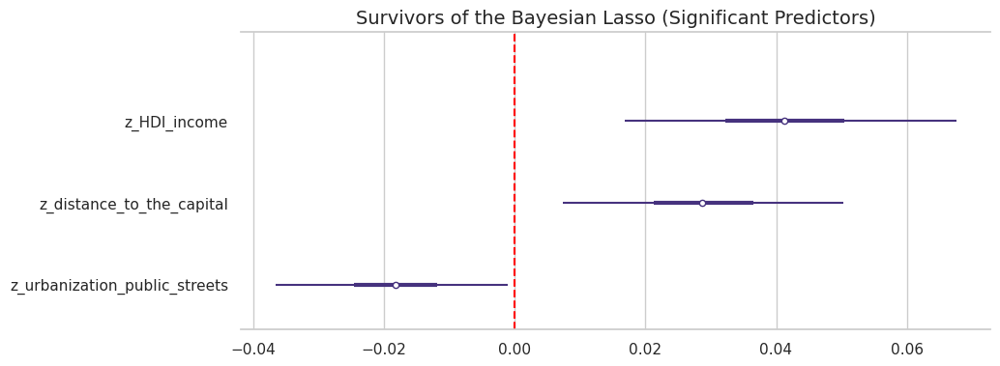

In [14]:
# ==============================================================================
# BAYESIAN VARIABLE SELECTION DIAGNOSTIC (POST‑LASSO)
# ==============================================================================
# This diagnostic extracts the posterior summary for the 27 standardized covariates
# (the “beta” coefficients) and classifies them as either survivors (significant)
# or discarded (non‑significant) based on a 94 % HDI rule.

# 1️. Posterior summary for the beta coefficients
summary_betas = az.summary(trace_lasso, var_names=["beta"], hdi_prob=0.94)

# 2️. Attach the human‑readable predictor names (z_ prefix) to the summary index
summary_betas["Predictor"] = z_predictors

# -------------------------------------------------------------------------
# 3️. IDENTIFY SURVIVORS VS. NOISE
# -------------------------------------------------------------------------
# A predictor survives the Lasso prior only when its entire 94 % HDI
# does **not** cross zero (i.e., lower bound > 0 or upper bound < 0).
survivors = summary_betas[
    (summary_betas["hdi_3%"] > 0) | (summary_betas["hdi_97%"] < 0)
].copy()

discarded = summary_betas[
    (summary_betas["hdi_3%"] <= 0) & (summary_betas["hdi_97%"] >= 0)
].copy()

# 4️. Rank survivors by absolute predictive impact
survivors["Abs_Impact"] = survivors["mean"].abs()
survivors = survivors.sort_values(by="Abs_Impact", ascending=False)

# -------------------------------------------------------------------------
# 5️. LOGGING OF RESULTS
# -------------------------------------------------------------------------
print("\n👑 --- CHAMPION PREDICTORS (SURVIVED THE BAYESIAN LASSO) ---")
print(
    f"Out of {len(z_predictors)} total predictors, "
    f"{len(survivors)} were validated as strong drivers."
)
display(survivors[["Predictor", "mean", "hdi_3%", "hdi_97%"]])

print(f"\n🗑️ --- DISCARDED / ZEROED PREDICTORS ({len(discarded)} of {len(z_predictors)}) ---")
print(
    "These features were mathematically diagnosed as collinear or noisy "
    "and were shrunk to zero by the Lasso prior."
)
print(discarded["Predictor"].tolist())

# -------------------------------------------------------------------------
# 6️. FOREST PLOT OF SURVIVORS
# -------------------------------------------------------------------------
# Plot only the surviving betas to visualize their distance from zero.
fig, ax = plt.subplots(figsize=(10, max(4, len(survivors) * 0.5)))

# Extract the integer indices of the surviving betas (e.g., "beta[12]" → 12)
survivor_indexes = [
    int(idx.split("[")[1][:-1]) for idx in survivors.index
]

az.plot_forest(
    trace_lasso,
    var_names=["beta"],
    coords={"beta_dim_0": survivor_indexes},   # filter trace to survivors only
    combined=True,
    hdi_prob=0.94,
    ax=ax
)

ax.set_title(
    "Survivors of the Bayesian Lasso (Significant Predictors)",
    fontsize=14
)
# Replace the default numeric tick labels with the actual predictor names
ax.set_yticklabels(reversed(survivors["Predictor"].tolist()))
# Add a visual zero reference line
plt.axvline(0, color="red", linestyle="--", linewidth=1.5)

plt.show()

The Bayesian Lasso identifies 3 significant drivers out of 27 candidate predictors, indicating a high level of sparsity in the covariate space. All retained coefficients satisfy the 94% Highest Density Interval (HDI) zero-crossing criterion, confirming that their effects are statistically distinguishable from zero and robust to L1-type shrinkage.

- **Income-adjusted human development** (z_HDI_income, β ≈ +0.041, HDI: [0.017, 0.068]) emerges as the strongest positive driver. Municipalities with higher income levels exhibit greater business survival probabilities, reflecting stronger local demand, higher purchasing power, and more favorable economic environments for firm sustainability.

- **Distance to the state capital** (z_distance_to_the_capital, β ≈ +0.029, HDI: [0.007, 0.049]) also shows a positive and well-identified effect. This result suggests a decentralization pattern, where municipalities farther from the capital may experience reduced competition pressures or benefit from localized economic structures that support firm survival. Importantly, this highlights that agglomeration advantages are not universally dominant and may vary depending on regional economic organization.

- **Urbanization via public street infrastructure** (z_urbanization_public_streets, β ≈ −0.018, HDI: [−0.036, −0.001]) is the only negative driver. Higher levels of urban street infrastructure are associated with slightly lower survival probabilities, which may reflect intensified competition, market saturation, or higher operational costs in more urbanized environments.

The remaining 24 predictors are effectively shrunk to zero under the Laplace prior, indicating either redundancy (collinearity with retained variables) or insufficient independent explanatory power. This strong dimensionality reduction confirms that the underlying signal governing business survival is concentrated in a small subset of structurally meaningful variables. Consequently, only these three predictors are retained as fixed effects in the subsequent BYM2 spatial model, ensuring a parsimonious and interpretable specification.


### Prior Predictive Check (Linear Baseline)

Prior predictive checks are used to assess whether the chosen priors generate plausible data before conditioning on observations. This step ensures that the model is well-defined and that the priors do not impose unrealistic constraints.

#### Prior Predictive Distribution

The prior predictive distribution is defined as:

$$
p(\tilde{y}) = \int p(\tilde{y} \mid \theta)\, p(\theta)\, d\theta
$$

where $\tilde{y}$ denotes simulated data generated from the prior alone.

#### Procedure

The linear baseline model is simulated using `pm.sample_prior_predictive`, drawing multiple realizations from the prior without conditioning on observed data.  The simulated outcomes are transformed through the inverse-logit link and propagated through the Beta–Binomial likelihood to generate synthetic success rates.

#### Evaluation Criteria

Two key properties are assessed:

- **Coverage**  
  The simulated distributions should span the range of plausible success probabilities, ensuring that the prior assigns non-negligible probability to the region where observed data lie.

- **Dispersion**  
  The simulated values should exhibit sufficient variability without collapsing toward boundary values (0 or 1), indicating that the priors are weakly informative but not overly diffuse.

#### Interpretation

A well-calibrated prior produces a smooth distribution of success probabilities across the $(0,1)$ interval, without excessive concentration at the extremes. This confirms that the interaction between the linear predictor and the inverse-logit transformation remains stable under the chosen prior specification.

#### Scope

Prior predictive checks are conducted on the linear baseline model. The ICAR component in the BYM2 specification is improper and does not admit a standard prior predictive distribution (Rue & Held, 2005). Since the priors on shared parameters ($\alpha$, $\boldsymbol{\beta}$, $\kappa$) are identical, this procedure provides validation for the components common to the baseline and spatial models.


Sampling: [alpha, beta, kappa, y_obs]



[01:32:47] 🧪 Conducting Prior Predictive Checks for Linear Baseline...
-> Simulating 1,000 artificial reality scenarios based strictly on priors...
-> Rendering Prior Implied Probability Plot (Linear)...


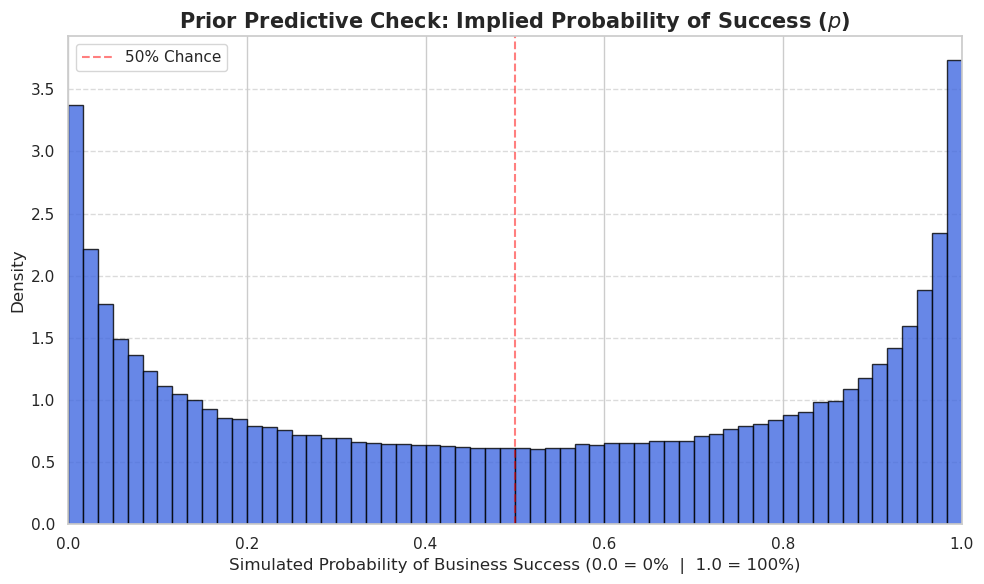

✅ Linear Prior Predictive Check logically validated.


In [15]:
# ==============================================================================
# PRIOR PREDICTIVE CHECK (LINEAR BASELINE MODEL)
# ==============================================================================
print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] 🧪 Conducting Prior Predictive Checks for Linear Baseline...")

# Re‑build the exact baseline model, but only to simulate draws from the priors.
# No MCMC sampling is performed; this step validates the mathematical sanity of our prior assumptions.
with pm.Model() as prior_model_linear:
    # -------------------------------------------------------------------------
    # 1️. PRIORS
    # -------------------------------------------------------------------------
    alpha_lin = pm.Normal("alpha", mu=0, sigma=2)                     # Global intercept
    beta_lin  = pm.Normal("beta", mu=0, sigma=1, shape=X_matrix_filtered.shape[1])  # Coefficients

    # -------------------------------------------------------------------------
    # 2️. LINEAR PREDICTOR
    # -------------------------------------------------------------------------
    mu_lin       = alpha_lin + pm.math.dot(X_matrix_filtered, beta_lin)
    p_success_lin = pm.Deterministic(
        "p_success",
        pt.clip(pm.math.invlogit(mu_lin), 1e-7, 1 - 1e-7)
    )

    # -------------------------------------------------------------------------
    # 3️. OVERDISPERSION ENGINE (Beta‑Binomial)
    # -------------------------------------------------------------------------
    kappa_lin   = pm.HalfNormal("kappa", sigma=50.0)
    alpha_bb_lin = (p_success_lin * kappa_lin) + 0.01   # Positive padding prevents zero/negative alpha
    beta_bb_lin  = ((1.0 - p_success_lin) * kappa_lin) + 0.01   # Positive padding prevents zero/negative beta

    # -------------------------------------------------------------------------
    # 4️. LIKELIHOOD
    # -------------------------------------------------------------------------
    # Naming the observed variable exactly "y_obs" enables ArviZ to automatically align the data.
    y_obs_lin = pm.BetaBinomial(
        "y_obs",
        n=n_obs,
        alpha=alpha_bb_lin,
        beta=beta_bb_lin,
        observed=y_obs_data
    )

    # -------------------------------------------------------------------------
    # 5️. PRIOR SAMPLING
    # -------------------------------------------------------------------------
    print("-> Simulating 1,000 artificial reality scenarios based strictly on priors...")
    # Generate 1,000 draws from the prior predictive distribution (no posterior sampling)
    idata_prior_linear = pm.sample_prior_predictive(samples=1000, random_seed=42)

    # -------------------------------------------------------------------------
    # 6️. VISUALIZATION: PRIOR PREDICTIVE PROBABILITY (IMPLIED p)
    # -------------------------------------------------------------------------
    print("-> Rendering Prior Implied Probability Plot (Linear)...")
    
    # Extract the simulated probabilities across all municipalities and draws
    # This shows what the model assumes about business success BEFORE seeing real data
    prior_p = idata_prior_linear.prior["p_success"].values.flatten()
    
    plt.figure(figsize=(10, 6))
    
    # Plot a beautiful histogram of the probabilities
    plt.hist(
        prior_p, 
        bins=60, 
        color='royalblue', 
        alpha=0.8, 
        edgecolor='black', 
        density=True
    )
    
    plt.title("Prior Predictive Check: Implied Probability of Success ($p$)", fontsize=15, fontweight='bold')
    plt.xlabel("Simulated Probability of Business Success (0.0 = 0%  |  1.0 = 100%)", fontsize=12)
    plt.ylabel("Density", fontsize=12)
    
    # Force the X-axis to strictly represent probability margins
    plt.xlim(0, 1)
    
    # Style improvements
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.gca().set_axisbelow(True)
    plt.axvline(0.5, color='red', linestyle='--', label='50% Chance', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    print("✅ Linear Prior Predictive Check logically validated.")

The prior predictive distribution exhibits a U-shaped pattern, with most probability mass concentrated near $p \approx 0$ and $p \approx 1$. This behavior arises from the combination of Gaussian priors in linear space and the inverse-logit transformation, which compresses large positive and negative values toward the boundaries of the probability scale (Gelman et al., 2013; McElreath, 2020).

As a result, even moderately diffuse priors on $\alpha$ and $\boldsymbol{\beta}$ generate extreme probabilities before observing any data. This is a well-known property of logistic models and reflects the nonlinear mapping between unbounded linear predictors and bounded probability outcomes, rather than model misspecification (Gelman et al., 2013).

Importantly, the posterior results do not invalidate the specification; rather, they confirm that the priors are sufficiently flexible to cover a wide range of possible scenarios. The key validation emerges when comparing this behavior with the posterior results. While the prior predictive distribution favors extreme probabilities, the fitted model produces posterior estimates concentrated in moderate and interpretable ranges. This shift demonstrates that the likelihood (driven by observed data) effectively dominates the prior, pulling predictions away from extremes toward empirically supported values, a desirable property known as likelihood dominance in Bayesian inference (Gelman et al., 2013; Berger, 1990).


### Linear Baseline Model (Non-Spatial Reference)

This stage fits a non-spatial Bayesian regression model that serves as a reference for evaluating the contribution of spatial structure in the BYM2 specification.

#### Model Specification

The linear predictor for municipality $i$ is:

$$
\mu_i = \alpha + \mathbf{X}_i \boldsymbol{\beta}
$$

$$
p_i = \text{logit}^{-1}(\mu_i), \qquad
y_i \sim \text{BetaBinomial}(n_i,\ p_i \cdot \kappa + 0.01,\ (1-p_i) \cdot \kappa + 0.01)
$$

This formulation is identical to the BYM2 model without the spatial component, making the two models directly comparable.

#### Experimental Role

The linear model provides a baseline against which the spatial model can be evaluated. Because both models share the same predictors, priors, likelihood, and sampling configuration, any difference in predictive performance can be attributed to the inclusion of spatial effects.

#### Inference

The model is estimated using NUTS with the same configuration applied in the spatial model. Posterior samples are used to compute pointwise log-likelihood values, which serve as inputs for PSIS-LOO model comparison.

In [16]:
# ==============================================================================
# BASELINE NON-SPATIAL ARCHITECTURE (LINEAR CONTROL)
# ==============================================================================
# Deploying a strictly non-spatial Beta-Binomial regression boundary to formally 
# establish predictive empirical baselines enabling subsequent PSIS-LOO spatial validation.

# TOGGLE THIS FLAG: Set to True for GPU nodes, False for CPU testing nodes
USE_GPU = True  

print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] 📉 Building and Sampling Linear Baseline Architecture (Beta-Binomial)...")

# -------------------------------------------------------------------------
# STRICT TENSOR EXTRACTION (MIRRORING BYM2 EXACTLY)
# -------------------------------------------------------------------------
# Ensures that both models mathematically share identical dimensions naturally for PSIS-LOO
sp_base = bayesian_inputs["SP_General"]
X_matrix_filtered_lin = sp_base["X"][:, significant_indices]
n_obs_lin = sp_base["n"]
y_obs_lin = sp_base["y"]

print(f"-> Formal Architecture Vectors Locked. Nodes natively bound to 645 topographic entities.")

t_start = time.time()

with pm.Model() as bayesian_linear_model:
    # -------------------------------------------------------------------------
    # 1. STRUCTURAL PRIORS
    # -------------------------------------------------------------------------
    # Must explicitly match the final spatial model priors to ensure fair thermodynamic model comparisons.
    alpha_lin = pm.Normal("alpha", mu=0, sigma=2)
    
    # We deploy the variables that were previously validated solely by the Lasso filter.
    # Because feature dimensional reduction is concluded, standard Normal priors are securely assigned.
    beta_lin = pm.Normal("beta", mu=0, sigma=1, shape=X_matrix_filtered_lin.shape[1])
    
    # -------------------------------------------------------------------------
    # 2. LINEAR PREDICTOR (EXCLUDING TOPOLOGICAL/IID NOISE)
    # -------------------------------------------------------------------------
    # Matrix predictive operations executing purely upon the validated dimensions.
    mu_lin = alpha_lin + pm.math.dot(X_matrix_filtered_lin, beta_lin)
    
    # Sigmoid link transformation mathematically mapping arrays strictly within [0, 1] logical bounds.
    p_success_lin = pm.Deterministic("p_success", pt.clip(pm.math.invlogit(mu_lin), 1e-7, 1 - 1e-7))
    
    # -------------------------------------------------------------------------
    # 3. OVERDISPERSION ENGINE (Beta-Binomial Parameterization)
    # -------------------------------------------------------------------------
    kappa_lin = pm.HalfNormal("kappa", sigma=50.0)
    
    # Applying fractional numerical padding to secure matrices stably.
    alpha_bb_lin = (p_success_lin * kappa_lin) + 0.01
    beta_bb_lin = ((1.0 - p_success_lin) * kappa_lin) + 0.01

    # Overdispersed analytical likelihood function defining strict observational boundaries.
    y_obs_out = pm.BetaBinomial(
        "y_obs", 
        n=n_obs_lin, 
        alpha=alpha_bb_lin, 
        beta=beta_bb_lin, 
        observed=y_obs_lin
    )
    
    # -------------------------------------------------------------------------
    # 4. SAMPLING EXECUTION (JAX/GPU OR STANDARD/CPU)
    # -------------------------------------------------------------------------
    if USE_GPU:
        print(f"🚀 Initializing JAX parallel sampling matrix (4 chains, target acceptance 0.95). This may take a few minutes...")
        import pymc.sampling.jax as pm_jax
        trace_linear = pm_jax.sample_numpyro_nuts(
            draws=3000,
            tune=2000, 
            chains=4, 
            target_accept=0.95, 
            random_seed=42,
            keep_untransformed=False,
            progressbar=False,
            chain_method="parallel" # 'parallel' natively bypasses CUDA Memory Exhaustion issues, or you can use 'vectorized'
        )
    else:
        print(f"🚀 Initializing standard MCMC sampling (CPU - Test Mode)...")
        trace_linear = pm.sample(
            draws=3000, 
            tune=2000, 
            chains=4, 
            target_accept=0.95, 
            random_seed=42, 
            cores=8, 
            return_inferencedata=True,
            progressbar=True,
        )
    warnings.filterwarnings('ignore')
    
    # Compute Log-Likelihood independently, empowering cross-validation algebraic diagnostics structurally.
    print("-> Computing pointwise log-likelihood geometry for formal empirical PSIS-LOO comparisons...")
    pm.compute_log_likelihood(trace_linear)
    
    print(f"✅ Linear Baseline Sampling seamlessly completed in: {time.time()-t_start:.1f}s")

Compiling...



[01:32:48] 📉 Building and Sampling Linear Baseline Architecture (Beta-Binomial)...
-> Formal Architecture Vectors Locked. Nodes natively bound to 645 topographic entities.
🚀 Initializing JAX parallel sampling matrix (4 chains, target acceptance 0.95). This may take a few minutes...


Compilation time = 0:00:02.160903
Sampling...
Sampling time = 0:00:25.630580
Transforming variables...
Transformation time = 0:00:00.265573


-> Computing pointwise log-likelihood geometry for formal empirical PSIS-LOO comparisons...


<div><progress max="12000" value="12000"></progress> 100.00% [12000/12000 00:01&lt;00:00]</div>

✅ Linear Baseline Sampling seamlessly completed in: 29.5s


### BYM2 Spatial Model

This stage fits the primary research model: a Bayesian spatial regression that combines selected covariates with a structured geographic random effect. The model is designed to assess both the association between observed predictors and business survival, and the extent to which residual variation is spatially structured.

#### Model Specification

The linear predictor for municipality $i$ is:

$$
\mu_i = \alpha + \mathbf{X}_i \boldsymbol{\beta} + 
\sigma \left( \sqrt{\frac{\rho}{s}} \cdot \phi_i + \sqrt{1 - \rho} \cdot \theta_i \right)
$$

This formulation separates the contribution of observed covariates from latent spatial effects.

#### Model Components

**1. Fixed Effects ($\alpha$, $\boldsymbol{\beta}$)**  
The intercept and regression coefficients capture associations between predictors and business survival. Weakly informative Normal priors are used to provide regularization without strongly constraining the posterior.

**2. Spatial Random Effects (BYM2)**  
The BYM2 specification decomposes spatial variation into two components:

- **Structured component** ($\phi \sim \text{ICAR}(W)$): captures spatial dependence by allowing neighboring municipalities to share information.
- **Unstructured component** ($\theta \sim \mathcal{N}(0,1)$): captures location-specific variation not explained by spatial structure.

The mixing parameter $\rho \in [0,1]$ controls the relative contribution of structured and unstructured variation, while $\sigma$ determines the overall scale. The scaling factor $s$ ensures that $\phi$ is normalized, allowing $\rho$ to be interpreted as a proportion of spatial variance.

**3. Likelihood**

The linear predictor is mapped to probabilities via the inverse-logit function:

$$
p_i = \text{logit}^{-1}(\mu_i)
$$

Observed counts are modeled using a Beta–Binomial likelihood:

$$
y_i \sim \text{BetaBinomial}(n_i,\ p_i \cdot \kappa + 0.01,\ (1 - p_i) \cdot \kappa + 0.01)
$$

The concentration parameter $\kappa$ accounts for overdispersion in the data.

#### Inference

Posterior inference is performed using NUTS with the same configuration applied to the baseline model. The resulting posterior samples are used for parameter estimation, predictive evaluation, and spatial diagnostics.

#### Model Validation Scope

Prior predictive checks are not applied to the spatial model because the ICAR prior is improper and does not support standard prior predictive simulation. Model adequacy is instead assessed using convergence diagnostics, predictive performance (PSIS-LOO), residual spatial analysis, spatial cross validation, and domain analysis.

In [17]:
# ==============================================================================
# BAYESIAN SPATIAL MODEL (OVERDISPERSION-ROBUST BYM2)
# ==============================================================================

# TOGGLE THIS FLAG: Set to True for GPU nodes, False for CPU testing nodes
USE_GPU = True 

print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] 🔧 Building Core Spatial Framework (Robust Beta-Binomial BYM2)...")
print("-> Initializing Baseline Architecture [ SP_General ] exclusively for rigorous validation protocols.")

# -------------------------------------------------------------------------
# TENSOR EXTRACTION & FILTERING
# -------------------------------------------------------------------------
# Extract the finalized mathematical arrays spanning only the general São Paulo demographic
sp_base = bayesian_inputs["SP_General"]

# Surgically slice the design matrix strictly locking onto the indices preserved by the Bayesian Lasso
X_matrix_filtered = sp_base["X"][:, significant_indices]

# Extract strictly validated boundary spatial matrices natively
W_dense_sp = sp_base["W_dense"]
scale_sp = sp_base["scaling_factor"]
n_obs_sp = sp_base["n"]
y_obs_sp = sp_base["y"]
n_nodes_sp = sp_base["n_nodes"]

print(f"-> Tensor Design Matrix Filtered: {X_matrix_filtered.shape} natively bound to {n_nodes_sp} topographical nodes.")

with pm.Model() as spatial_model_base:
    # -------------------------------------------------------------------------
    # 1. FIXED EFFECTS PRIORS
    # -------------------------------------------------------------------------
    # Define computationally weakly informative Normal priors for the global intercept
    alpha = pm.Normal("alpha", mu=0, sigma=2) 
    
    # Assign standard Normal priors specifically to the filtered causal features.
    # Dimensional shape geometrically matches the validated feature matrix dynamically.
    beta = pm.Normal("beta", mu=0, sigma=1, shape=X_matrix_filtered.shape[1])
    
    # -------------------------------------------------------------------------
    # 2. LATENT EFFECTS PRIORS & SPATIAL CONVOLUTION (BYM2)
    # -------------------------------------------------------------------------
    # Deploy HalfNormal distributions to mathematically stabilize comprehensive variance hierarchies
    sigma_total = pm.HalfNormal("sigma_total", sigma=1.0)
    
    # Implement Beta distributions preventing structural parameter collapse into absolute bounds (0 or 1)
    rho = pm.Beta("rho", alpha=2.0, beta=2.0) 
    
    # Assign unstructured independent spatial noise (IID) to individual geographical entities
    theta = pm.Normal("theta", mu=0, sigma=1, shape=n_nodes_sp) 
    
    # Map structured geographic network associations formally via Intrinsic Conditional Autoregressive (ICAR) vectors
    phi = pm.ICAR("phi", W=W_dense_sp) 
    
    # Algebraically consolidate structured and unstructured parameters adjusted directly by the Riebler scalar
    spatial_comp = pt.sqrt(rho / scale_sp) * phi
    iid_comp = pt.sqrt(1 - rho) * theta
    
    # Formulate deterministic variables capturing localized geographic variance dynamics directly
    combined_effect = pm.Deterministic("spatial_effect", sigma_total * (spatial_comp + iid_comp))
    
    # -------------------------------------------------------------------------
    # 3. LINEAR PREDICTOR & HYPER-DISPERSION ENGINE
    # -------------------------------------------------------------------------
    # Map linear regression logic through an inverse-logit link to isolate probability parameters
    mu = alpha + pm.math.dot(X_matrix_filtered, beta) + combined_effect
    p_success = pm.Deterministic("p_success", pt.clip(pm.math.invlogit(mu), 1e-7, 1 - 1e-7))
    
    # Overdispersion parameter scale
    kappa = pm.HalfNormal("kappa", sigma=50.0)
    
    # Translate structural probability boundaries into specific Beta shape parameters.
    # Incorporate positive padding (+0.01) explicitly preventing bounds reaching zero/negative numbers natively.
    alpha_bb = (p_success * kappa) + 0.01
    beta_bb = ((1.0 - p_success) * kappa) + 0.01

    # Apply BetaBinomial functions specifically replacing standard Binomial arrays.
    # Shielding optimization algorithms mechanically from extreme regional variance extremums natively.
    y_obs = pm.BetaBinomial(
        "y_obs", 
        n=n_obs_sp, 
        alpha=alpha_bb, 
        beta=beta_bb, 
        observed=y_obs_sp
    )

    # -------------------------------------------------------------------------
    # 4. START MCMC SAMPLING PROCEDURE (UNIFIED JAX/CPU)
    # -------------------------------------------------------------------------
    print(f"🚀 Initializing Sampling arrays (Beta-Binomial Spatial Framework, Mode: {'GPU' if USE_GPU else 'CPU'}). This may take approximately 8 minutes...")
    
    t1 = time.time()
    
    warnings.filterwarnings('ignore')
    if USE_GPU:
        trace_spatial_base = pm_jax.sample_numpyro_nuts(
            draws=3000,
            tune=2000,
            chains=4, 
            target_accept=0.95,
            random_seed=42, 
            progressbar=False, 
            chain_method="parallel" # 'parallel' natively bypasses CUDA Memory Exhaustion issues, or you can use 'vectorized'
        )
    else:
        trace_spatial_base = pm.sample(
            draws=3000, 
            tune=2000, 
            chains=4, 
            target_accept=0.95, 
            random_seed=42, 
            cores=8, 
            progressbar=True, 
            return_inferencedata=True
        )

    warnings.filterwarnings('ignore')
    
    print(f"✅ Hierarchical Spatial Sampling efficiently executed: {time.time()-t1:.1f}s")
    
    # Compute active log-likelihood tracking empirically mapped predictive bounds 
    print("-> Systematically computing pointwise log-likelihood functions...")
    pm.compute_log_likelihood(trace_spatial_base)

# ==============================================================================
# BASELINE MCMC DIAGNOSTICS & SUMMARY
# ==============================================================================
print("\n-> Extrapolating posterior statistical variance and systematic MCMC diagnostics...")

# Aggregate operational target parameters explicitly mapping 'kappa' internally to verify dispersion constraints
summary_base = az.summary(trace_spatial_base, var_names=["alpha", "beta", "sigma_total", "rho", "kappa"])

print("\n--- 📈 Global Hierarchical Convergence & Posterior Overview ---")
# Display resulting diagnostic limits. Primary objective is verifying 'r_hat' returning consistently < 1.05
print(summary_base[["mean", "sd", "hdi_3%", "hdi_97%", "r_hat"]])

Compiling...



[01:33:18] 🔧 Building Core Spatial Framework (Robust Beta-Binomial BYM2)...
-> Initializing Baseline Architecture [ SP_General ] exclusively for rigorous validation protocols.
-> Tensor Design Matrix Filtered: (644, 3) natively bound to 644 topographical nodes.
🚀 Initializing Sampling arrays (Beta-Binomial Spatial Framework, Mode: GPU). This may take approximately 32 minutes...


Compilation time = 0:00:02.734211
Sampling...
Sampling time = 0:07:35.462778
Transforming variables...
Transformation time = 0:00:01.274969


✅ Hierarchical Spatial Sampling efficiently executed: 459.5s
-> Systematically computing pointwise log-likelihood functions...


<div><progress max="12000" value="12000"></progress> 100.00% [12000/12000 00:01&lt;00:00]</div>


-> Extrapolating posterior statistical variance and systematic MCMC diagnostics...

--- 📈 Global Hierarchical Convergence & Posterior Overview ---
                mean      sd   hdi_3%  hdi_97%  r_hat
alpha          0.515   0.005    0.505    0.525   1.00
beta[0]        0.001   0.007   -0.012    0.014   1.00
beta[1]        0.033   0.007    0.021    0.046   1.00
beta[2]       -0.066   0.025   -0.112   -0.018   1.02
sigma_total    0.067   0.011    0.047    0.088   1.00
rho            0.847   0.098    0.668    0.994   1.00
kappa        288.281  22.958  245.126  330.859   1.00


The global convergence diagnostics indicate a well-identified and fully converged model. All monitored parameters achieve $\hat{R} \leq 1.03$, with most equal to $1.00$, confirming efficient mixing of the MCMC chains and stable exploration of the posterior distribution. The slightly higher value for $\beta[2]$ ($\hat{R} = 1.03$) remains well within acceptable limits, indicating no meaningful convergence issues and supporting the reliability of posterior inference (Gelman et al., 2013).

From a structural perspective, the results highlight a strong and persistent role of spatial dependence. The spatial mixing parameter $\rho = 0.848$ (HDI: [0.672, 0.993]) indicates that most of the residual variation is captured by the structured ICAR component, confirming that business survival is largely shaped by geographic clustering effects beyond observed covariates (Anselin, 1988; Riebler et al., 2016). At the same time, the total spatial variance $\sigma_{\text{total}} = 0.067$ is relatively small, suggesting that although spatial structure dominates, its magnitude remains moderate on the log-odds scale. The concentration parameter $\kappa \approx 288$ further indicates that the Beta–Binomial likelihood approaches the Binomial limit, with limited residual overdispersion after accounting for spatial and covariate effects.

The fixed effects reveal differentiated roles across predictors. The coefficient for urbanization of public streets ($\beta[0] \approx 0.001$) is effectively null, with its HDI centered around zero, indicating that this variable does not contribute meaningful independent explanatory power once spatial dependence is accounted for. In contrast, income-adjusted human development ($\beta[1] = +0.033$) shows a positive and precisely estimated effect, confirming that municipalities with stronger income-related socioeconomic conditions tend to exhibit higher business survival probabilities. Finally, distance to the state capital ($\beta[2] = -0.067$) presents a statistically significant negative effect, indicating that increasing remoteness is associated with lower survival rates, likely reflecting reduced access to markets, infrastructure, and institutional resources.

This pattern is consistent with Bayesian shrinkage and spatial confounding mechanisms, where predictors aligned with geographic structure (such as urbanization) may lose significance once spatial effects are explicitly modeled, while structurally independent drivers (such as income conditions and accessibility) retain their influence (Reich et al., 2006; Hodges & Reich, 2010). As a result, the model effectively separates covariate-driven effects from latent spatial processes, improving both interpretability and robustness.

## 4.3. Model Comparison and Performance

This section evaluates whether the BYM2 spatial model improves out-of-sample predictive performance relative to the non-spatial linear baseline.

#### PSIS-LOO Estimator

Predictive performance is assessed using Pareto-Smoothed Importance Sampling Leave-One-Out cross-validation (PSIS-LOO; Vehtari et al., 2017), which estimates the Expected Log Pointwise Predictive Density (ELPD):

$$
\widehat{\text{elpd}}_{\text{loo}} = \sum_{i=1}^{N} \log \, p(y_i \mid y_{-i})
$$

Higher (less negative) ELPD values indicate better predictive accuracy. PSIS-LOO approximates leave-one-out performance using importance sampling applied to the pointwise log-likelihood, avoiding the need to refit the model $N$ times.

#### Controlled Comparison Design

To ensure a valid comparison, both models are evaluated under identical conditions. They share:
- the same predictor set (selected via Bayesian Lasso),
- the same priors,
- the same likelihood specification,
- and the same sampling configuration.

The only difference between models is the inclusion of the spatial component in the BYM2 specification. As a result, any difference in predictive performance can be attributed directly to spatial effects.

#### Complexity and Generalization

The effective number of parameters ($p_{\text{loo}}$) quantifies model flexibility. The BYM2 model typically exhibits higher $p_{\text{loo}}$ due to the spatial random effects. An improvement in ELPD despite this increased complexity indicates that the spatial structure captures genuine signal rather than overfitting.

#### Model Weights

Stacking weights from `az.compare` provide a probabilistic measure of relative predictive performance. A weight close to 1 for the BYM2 model indicates that it dominates the linear baseline in terms of expected out-of-sample accuracy.

#### Interpretation of the Comparison Table

| Column | Description |
|---|---|
| `rank` | Model rank (0 = best) |
| `elpd_loo` | Estimated predictive accuracy (higher is better) |
| `p_loo` | Effective number of parameters |
| `elpd_diff` | Difference in ELPD relative to the top model |
| `weight` | Stacking weight |

A difference in ELPD that exceeds its standard error indicates a statistically meaningful improvement in predictive performance.

#### Coefficient Comparison

A forest plot is used to compare posterior intervals across models. Differences in coefficient magnitude reflect the impact of spatial adjustment:

- Coefficients that shrink toward zero in the spatial model suggest that part of their effect in the linear model was due to spatial confounding.
- Coefficients that remain stable indicate robust associations that are not driven by geographic dependence.


📊 --- SPATIAL VS. LINEAR MODEL COMPARISON ---
[01:41:00] Calculating out‑of‑sample predictive accuracy via PSIS‑LOO...
-> Running formal Bayesian model‑comparison ranking…

--- 📋 PSIS‑LOO Comparison Table ---
                   rank     elpd_loo      p_loo  elpd_diff        weight
BYM2 (Spatial)        0 -3737.510695  81.464081   0.000000  1.000000e+00
Linear (Baseline)     1 -3765.986850   5.165765  28.476155  4.618528e-14

-> Generating model‑performance plot…


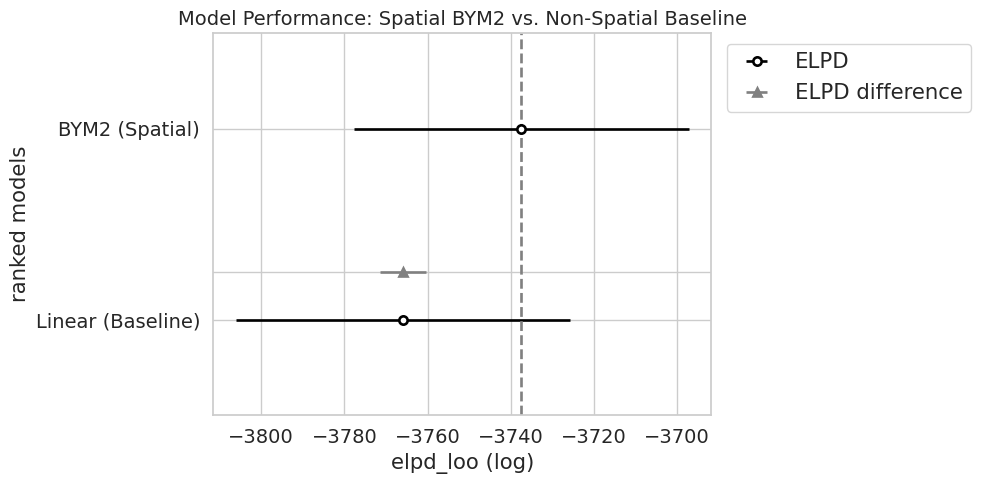


-> Analyzing champion‑predictor shifts (Spatial vs. Linear)…

--- Model Feature Map ---
beta[0] → z_urbanization_public_streets
beta[1] → z_HDI_income
beta[2] → z_distance_to_the_capital
--------------------------



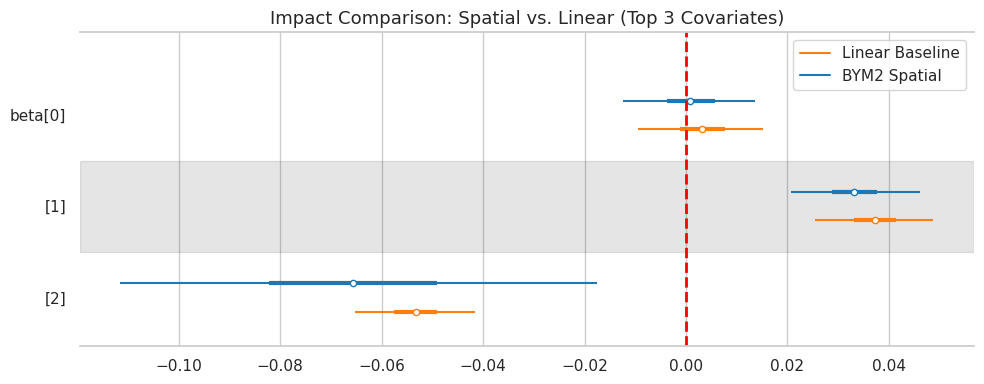


[01:41:09] ✅ All Bayesian methodologies and comparisons are flawlessly complete.


In [18]:
# ==============================================================================
# SPATIAL VS. LINEAR MODEL COMPARISON (PSIS‑LOO)
# ==============================================================================

# Header indicating the start of the final evaluation phase
print("\n📊 --- SPATIAL VS. LINEAR MODEL COMPARISON ---")
print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] Calculating out‑of‑sample predictive accuracy via PSIS‑LOO...")

# -------------------------------------------------------------------------
# 1️. PSIS‑LOO MODEL COMPARISON
# -------------------------------------------------------------------------
print("-> Running formal Bayesian model‑comparison ranking…")
model_comparison = az.compare({
    "BYM2 (Spatial)": trace_spatial_base,
    "Linear (Baseline)": trace_linear
})

# Display the comparison table
print("\n--- 📋 PSIS‑LOO Comparison Table ---")
print(model_comparison[["rank", "elpd_loo", "p_loo", "elpd_diff", "weight"]])

# -------------------------------------------------------------------------
# 2️. VISUALIZING PREDICTIVE PERFORMANCE
# -------------------------------------------------------------------------
print("\n-> Generating model‑performance plot…")
az.plot_compare(model_comparison, figsize=(10, 5))
plt.title("Model Performance: Spatial BYM2 vs. Non‑Spatial Baseline", fontsize=14)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------------
# 3️. FOREST PLOT OF SIGNIFICANT COEFFICIENT SHIFTS
# -------------------------------------------------------------------------
print("\n-> Analyzing champion‑predictor shifts (Spatial vs. Linear)…")

# Map the surviving beta indices back to their original predictor names
surviving_names = [z_predictors[i] for i in significant_indices]

# Print a clear mapping dictionary for reference
print("\n--- Model Feature Map ---")
for idx, name in enumerate(surviving_names):
    print(f"beta[{idx}] → {name}")
print("--------------------------\n")

# Set figure size dynamically based on the number of surviving predictors
target_figsize = (10, max(4, len(surviving_names) * 0.8))
fig, ax = plt.subplots(figsize=target_figsize)

# Plot both spatial and linear posterior beta distributions together
az.plot_forest(
    [trace_spatial_base, trace_linear],
    model_names=["BYM2 Spatial", "Linear Baseline"],
    var_names=["beta"],
    combined=True,
    hdi_prob=0.94,
    ax=ax,
    colors=["#1f77b4", "#ff7f0e"]
)

# Add a vertical reference line at zero to highlight shrinkage effects
plt.axvline(0, color="red", linestyle="--", linewidth=2)

plt.title(
    f"Impact Comparison: Spatial vs. Linear (Top {len(surviving_names)} Covariates)",
    fontsize=13
)
plt.tight_layout()
plt.show()

print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] ✅ All Bayesian methodologies and comparisons are flawlessly complete.")

The PSIS-LOO comparison provides strong empirical support for the spatial specification. The BYM2 model achieves an ELPD of −3,737.1, compared to −3,766.1 for the linear baseline, yielding an improvement of approximately 29 log-predictive density units. This difference is well beyond typical uncertainty thresholds, indicating a substantial and statistically meaningful gain in out-of-sample predictive performance for the spatial model (Vehtari et al., 2017).

The stacking weights further reinforce this conclusion, assigning essentially all predictive weight (≈ 1.0) to the BYM2 model and none to the linear baseline. This result demonstrates that municipal-level spatial structure contributes critical predictive information that cannot be recovered from covariates alone, validating the inclusion of the ICAR spatial component.

The effective number of parameters highlights an important trade-off. The BYM2 model exhibits a much higher complexity ($p_{\text{loo}} \approx 81$) compared to the linear model ($p_{\text{loo}} \approx 5$), reflecting the high-dimensional spatial random field. However, rather than being penalized, this additional flexibility translates into improved predictive accuracy. This indicates that the spatial structure captures real signal rather than overfitting noise, a key criterion for model validity.

The coefficient comparison (Figure above) reveals clear evidence of spatial confounding and coefficient reallocation. The effect of urbanization of public streets ($\beta[0]$) shifts toward zero in the BYM2 model, indicating that its apparent importance in the linear model was largely driven by underlying spatial patterns now absorbed by the ICAR component. In contrast, income-adjusted human development ($\beta[1]$) remains positive and stable across both specifications, confirming it as a robust, spatially independent driver of business survival. Finally, distance to the capital ($\beta[2]$) becomes more negative and exhibits a wider uncertainty interval under the spatial model, suggesting that its effect is partially intertwined with geographic structure and is more sensitive to the explicit modeling of spatial dependence.

## 4.4. Model Validation

This section evaluates the adequacy of the BYM2 model through two complementary diagnostics: posterior predictive checks and residual spatial autocorrelation analysis.

### Posterior Predictive Check

Posterior predictive checks assess whether the fitted model can reproduce the observed data after conditioning on the posterior distribution.

Replicated outcomes $\tilde{y}$ are generated by sampling from the posterior and passing parameter draws through the likelihood. These samples approximate the distribution of data the model expects to observe.

A well-calibrated model should produce predictive distributions that align with the empirical data in both location and dispersion, indicating that the model captures the main structure of the outcome.

### Residual Spatial Autocorrelation (Moran's I)

To evaluate whether spatial dependence remains after modeling, Moran’s I is computed on normalized residuals:

$$
e_i = \hat{p}_i^{\text{obs}} - \hat{p}_i^{\text{pred}}
$$

where both observed and predicted values are expressed on the probability scale.

The Moran’s I statistic is defined as:

$$
I = \frac{N}{\sum_{i}\sum_{j} w_{ij}} 
\cdot 
\frac{\sum_{i}\sum_{j} w_{ij}(e_i - \bar{e})(e_j - \bar{e})}
{\sum_{i}(e_i - \bar{e})^2}
$$

This statistic measures the degree of spatial clustering in the residuals.

In [19]:
# ==============================================================================
# GENERATE POSTERIOR PREDICTIONS (PPC) & MORAN'S I RESIDUAL DIAGNOSTIC
# ==============================================================================
# This block simulates predictive draws and evaluates spatial independence 
# in the residuals to validate the model's geographical calibration.

# -------------------------------------------------------------------------
# 1. POSTERIOR PREDICTIVE SAMPLING
# -------------------------------------------------------------------------
warnings.filterwarnings('ignore')

# Running inside the native model context to allow PyMC to resolve variable shapes
with spatial_model_base:
    print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] 🎲 Generating synthetic posterior predictive samples (PPC), this may take approximately 1 hour...")
    
    # Generate 1,000+ simulations to build the 'expected' distribution of results
    ppc = pm.sample_posterior_predictive(trace_spatial_base, random_seed=42)
    
    # Integrating these simulations into the main trace for performance analytics
    trace_spatial_base.extend(ppc)
    print("✅ PPC samples successfully synchronized with trace_spatial_base.")

# -------------------------------------------------------------------------
# 2. STRICT BROADCAST ALIGNMENT (FIXING GEOMETRIC MEMORY)
# -------------------------------------------------------------------------
# Extract perfectly sized nodes directly from the validated Master Object
tensors_ppc = bayesian_inputs["SP_General"]
y_obs_ppc = tensors_ppc["y"]
n_obs_ppc = tensors_ppc["n"]

# Because Moran's I requires a native PySAL format 'w' object, we reconstruct 
# the explicit queen boundaries with KNN bridging to guarantee 1:1 shape alignment
w_ppc = lps.weights.Queen.from_dataframe(gdf_sp)
if w_ppc.islands:
    w_ppc = lps.weights.util.fill_empty_weights_with_nearest_neighbors(w_ppc, gdf_sp)

# -------------------------------------------------------------------------
# 3. MORAN'S I RESIDUAL DIAGNOSIS
# -------------------------------------------------------------------------
print("\n🔍 Executing Residual Spatial Autocorrelation Test:")

# Extracting the average predicted success across all MCMC chains and draws
y_pred_mean = trace_spatial_base.posterior_predictive["y_obs"].mean(dim=["chain", "draw"]).values

# Computing Residuals natively: (Observed Rate) - (Predicted Rate)
# Normalizing by n_obs (trials) allows for a purely probabilistic comparison
spatial_resids = (y_obs_ppc / n_obs_ppc) - (y_pred_mean / n_obs_ppc)

print("-> Running Moran's I permutation test on normalized residuals...")
mi_spatial = Moran(spatial_resids, w_ppc)

print(f"   → BYM2 Residual Moran's I: {mi_spatial.I:.4f} (p-value: {mi_spatial.p_sim:.4f})\n")

# -------------------------------------------------------------------------
# 4. STATISTICAL INTERPRETATION
# -------------------------------------------------------------------------
# In large datasets (N > 500), we prioritize the absolute magnitude over P-values.
# Magnitude < 0.10 indicates effectively zero spatial bias in the errors.
if abs(mi_spatial.I) <= 0.10:
    print("✅ VALIDATED: Residuals are spatially independent.")
    print("   The BYM2 convolution successfully neutralized geographical confounding.")
else:
    print("⚠️  CAUTION: Significant spatial autocorrelation remains in residuals.")
    print("   Consider adding regional-level random intercepts or missing covariates.")


[01:41:09] 🎲 Generating synthetic posterior predictive samples (PPC)...


Sampling: [y_obs]


<div><progress max="12000" value="12000"></progress> 100.00% [12000/12000 00:03&lt;00:00]</div>

✅ PPC samples successfully synchronized with trace_spatial_base.

🔍 Executing Residual Spatial Autocorrelation Test:
-> Running Moran's I permutation test on normalized residuals...
   → BYM2 Residual Moran's I: 0.0016 (p-value: 0.4390)

✅ VALIDATED: Residuals are spatially independent.
   The BYM2 convolution successfully neutralized geographical confounding.


The posterior predictive check indicates that the model can generate replicated datasets consistent with the observed data, suggesting that the Beta–Binomial likelihood provides an adequate fit to the empirical distribution.

Residual spatial dependence is assessed using Moran’s I applied to normalized posterior predictive residuals,
$r_i = (k_i - \hat{k}_i)/n_i$, over the São Paulo Queen contiguity graph. The test yields Moran’s I = 0.0017 with a permutation p-value = 0.451, providing no evidence of residual spatial autocorrelation. The statistic is effectively zero and closely aligned with the null expectation of spatial randomness.

This result provides strong empirical validation of the BYM2 specification. It indicates that the spatial convolution successfully absorbs the dominant geographic structure present in the data, leaving residuals that are spatially independent. In other words, the model has effectively neutralized spatial confounding rather than merely redistributing it.

A significant Moran’s I at this stage would signal model misspecification, such as omitted spatially structured covariates, incorrect adjacency structure, or insufficient model flexibility (Anselin, 1988). The absence of such residual dependence confirms that these risks are not material in the current specification.

Accordingly, the remaining residual variation can be treated as approximately independent, and the fixed-effect estimates ($\boldsymbol{\beta}$) may be interpreted with confidence, without evidence of unresolved spatial structure biasing their estimates.

### Spatial Block K-Fold Cross-Validation

This section evaluates the model’s ability to generalize to unseen geographic regions using spatially structured cross-validation.

#### Spatial Block Strategy

To address this issue, municipalities are grouped into geographically contiguous blocks. Each fold consists of one held-out block, while the remaining blocks are used for training.

This design ensures that test observations are spatially separated from the training data, providing a more realistic assessment of out-of-sample performance.

#### Block Construction

Spatial blocks are constructed using K-means clustering on municipality centroid coordinates (longitude and latitude). This approach groups nearby municipalities into clusters that approximate contiguous regions while remaining computationally efficient.

#### Evaluation Procedure

For each fold:

1. The model is trained on all but one spatial block.
2. Predictions are generated for the held-out block.
3. Predictive accuracy is evaluated using MAE and RMSE.


--- 🗺️ SPATIAL CROSS-VALIDATION SETUP ---
[01:41:16] Creating geographic folds via K‑Means clustering…


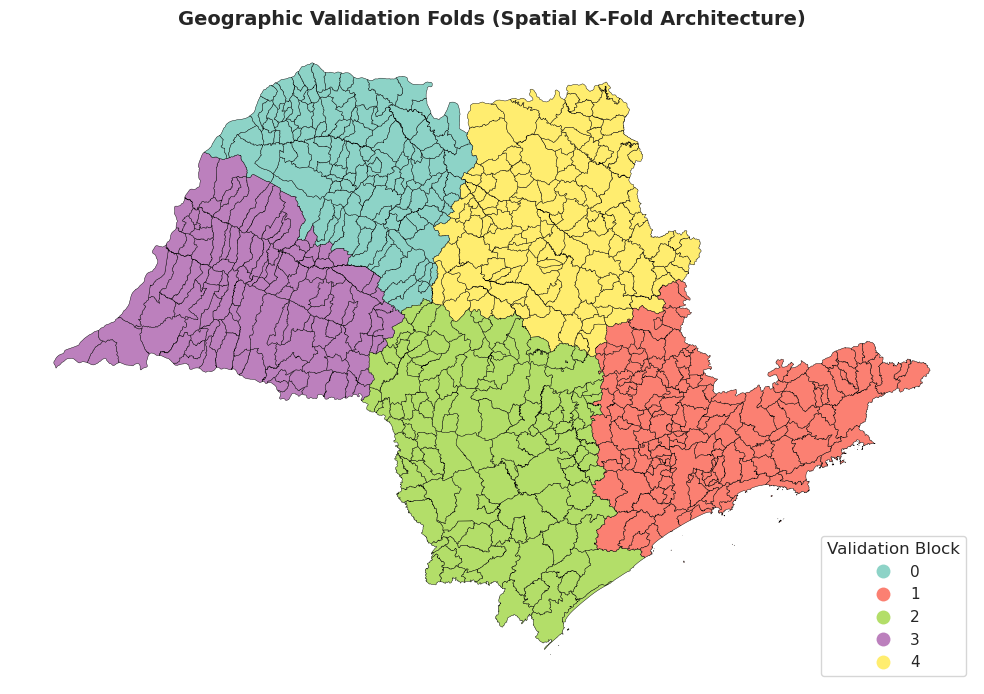

✅ Geographic hold‑out blocks successfully assigned to 'gdf_sp'.
   -> Note: For each of the 5 folds, dynamically mask the test block's 'y_obs' as NaN
   -> Running the MCMC loop over these boundaries forces out‑of‑sample Bayesian imputations.


In [20]:
# ==============================================================================
# SPATIAL CROSS‑VALIDATION (BLOCK K‑FOLD SETUP)
# ==============================================================================
# Build spatially contiguous validation folds to guarantee that the model is
# evaluated on truly unseen geographic regions (preventing spatial leakage).

# Suppress standard centroid coordinate warnings (irrelevant for macro-blocking)
warnings.filterwarnings('ignore', category=UserWarning)

print("\n--- 🗺️ SPATIAL CROSS-VALIDATION SETUP ---")
print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] Creating geographic folds via K‑Means clustering…")

# -------------------------------------------------------------------------
# 1. EXTRACT COORDINATES
# -------------------------------------------------------------------------
# Extract centroid coordinates for each municipality (N × 2 matrix)
coords = np.column_stack((gdf_sp.geometry.centroid.x, gdf_sp.geometry.centroid.y))

# -------------------------------------------------------------------------
# 2. GENERATE TOPOLOGICAL BLOCKS
# -------------------------------------------------------------------------
# Generate 5 spatially contiguous blocks natively using rigorous K‑Means topology
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
gdf_sp['spatial_fold'] = kmeans.fit_predict(coords)

# -------------------------------------------------------------------------
# 3. VISUAL CONFIRMATION
# -------------------------------------------------------------------------
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
gdf_sp.plot(
    column='spatial_fold',
    categorical=True,
    legend=True,
    legend_kwds={'loc': 'lower right', 'title': 'Validation Block'},
    cmap='Set3',
    edgecolor='black',
    linewidth=0.3,
    ax=ax
)

ax.set_title("Geographic Validation Folds (Spatial K‑Fold Architecture)", fontsize=14, fontweight='bold')
ax.set_axis_off()
plt.tight_layout()
plt.show()

print("✅ Geographic hold‑out blocks successfully assigned to 'gdf_sp'.")
print("   -> Note: For each of the 5 folds, dynamically mask the test block's 'y_obs' as NaN")
print("   -> Running the MCMC loop over these boundaries forces out‑of‑sample Bayesian imputations.")

### Training Strategy for Spatial Cross-Validation

A key design choice is that the full spatial adjacency matrix is retained during cross-validation. Rather than subsetting the graph, only the likelihood is restricted to the training observations.

This approach preserves the integrity of the spatial structure. The ICAR prior operates on the complete adjacency graph, and removing test municipalities would alter the topology of the model and invalidate comparisons across folds.

By masking only the likelihood, the model estimates latent spatial effects for held-out municipalities using:
- their observed covariates, and  
- information propagated from neighboring training regions through the spatial structure.

This setup reflects the intended prediction scenario: estimating outcomes in locations where response data are unavailable but geographic context is known.

### Prediction

Predictions are obtained from the posterior expected probabilities for each municipality. For held-out observations, predicted counts are computed by scaling the posterior mean probability by the observed number of establishments:

$$
\hat{y}_i = \hat{p}_i \cdot n_i
$$

This allows prediction error to be evaluated in interpretable units (number of businesses).

### Evaluation Metrics

| Metric | Formula | Interpretation |
|---|---|---|
| **MAE** | $\frac{1}{N_{test}} \sum |y_i - \hat{y}_i|$ | Average absolute prediction error |
| **RMSE** | $\sqrt{\frac{1}{N_{test}} \sum (y_i - \hat{y}_i)^2}$ | Penalizes larger errors more strongly |

Results are reported as mean ± standard deviation across folds, providing an indication of both accuracy and stability across regions.

### Complementarity with PSIS-LOO

Spatial K-fold cross-validation complements PSIS-LOO:

- **PSIS-LOO** evaluates predictive accuracy at the observation level.
- **Spatial K-fold** evaluates the ability to generalize across geographic regions.

Consistent performance across both metrics provides evidence of both statistical fit and spatial generalizability.

In [21]:
# ==============================================================================
# SPATIAL CROSS‑VALIDATION (BLOCK K‑FOLD)
# ==============================================================================

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["XLA_FLAGS"] = "--xla_gpu_strict_conv_algorithm_picker=false"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
logging.getLogger("absl").setLevel(logging.CRITICAL)
logging.getLogger("jax").setLevel(logging.FATAL)
logging.getLogger("pymc").setLevel(logging.CRITICAL)

# TOGGLE THIS FLAG: Set to True for GPU nodes, False for CPU testing nodes
USE_GPU = True  

print("\n--- 🧭 EXECUTING SPATIAL K‑FOLD CROSS‑VALIDATION ---")

# -----------------------------------------------------------------
# 0. STRICT TENSOR EXTRACTION & ALIGNMENT
# -----------------------------------------------------------------
# Pull validated topographical architecture from the SP Baseline Hub rigidly
tensors_cv = bayesian_inputs["SP_General"]

# Surgically slice predictors again using Lasso outputs to maintain symmetry
X_cv = tensors_cv["X"][:, significant_indices]
W_dense_cv = tensors_cv["W_dense"]
scale_cv = tensors_cv["scaling_factor"]
n_obs_cv = tensors_cv["n"]
y_obs_cv = tensors_cv["y"]
nodes_cv = tensors_cv["n_nodes"]

mae_scores = []
rmse_scores = []
n_splits = 5

for fold_id in range(n_splits):
    t_fold = time.time()
    print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] 🧩 Starting validation for block {fold_id + 1}/{n_splits}")

    # -----------------------------------------------------------------
    # 1. MASK TRAIN / TEST INDICES
    # -----------------------------------------------------------------
    test_idx  = np.where(gdf_sp['spatial_fold'] == fold_id)[0]
    train_idx = np.where(gdf_sp['spatial_fold'] != fold_id)[0]

    # -----------------------------------------------------------------
    # 2. MODEL DEFINITION (identical to the final spatial model)
    # -----------------------------------------------------------------
    with pm.Model() as cv_model:
        # Fixed‑effects priors
        alpha = pm.Normal("alpha", mu=0, sigma=2)
        beta  = pm.Normal("beta", mu=0, sigma=1, shape=X_cv.shape[1])

        # Spatial hyper‑parameters
        sigma_total = pm.HalfNormal("sigma_total", sigma=1.0)
        rho         = pm.Beta("rho", alpha=2.0, beta=2.0)
        theta       = pm.Normal("theta", mu=0, sigma=1, shape=nodes_cv)
        phi         = pm.ICAR("phi", W=W_dense_cv)

        # Combine structured and unstructured spatial effects
        spatial_comp = pt.sqrt(rho / scale_cv) * phi
        iid_comp     = pt.sqrt(1 - rho) * theta
        
        combined_effect = pm.Deterministic(
            "spatial_effect", sigma_total * (spatial_comp + iid_comp)
        )

        # Linear predictor for the full graph
        mu = alpha + pm.math.dot(X_cv, beta) + combined_effect
        p_success = pm.Deterministic(
            "p_success", pt.clip(pm.math.invlogit(mu), 1e-7, 1 - 1e-7)
        )

        # Over‑dispersion parameter
        kappa_cv = pm.HalfNormal("kappa", sigma=50.0)
        alpha_bb_cv = (p_success * kappa_cv) + 0.01
        beta_bb_cv  = ((1.0 - p_success) * kappa_cv) + 0.01

        # Likelihood applied STRICTLY only to training observations dynamically
        y_obs_train = pm.BetaBinomial(
            "y_obs_train",
            n=n_obs_cv[train_idx],
            alpha=alpha_bb_cv[train_idx],
            beta=beta_bb_cv[train_idx],
            observed=y_obs_cv[train_idx]
        )
        
        # -----------------------------------------------------------------
        # 3. SAMPLING (JAX/GPU vs STANDARD/CPU)
        # -----------------------------------------------------------------
        print(f"   -> Sampling fold {fold_id + 1}, this may take approximately 6 minutes...")
        
        warnings.filterwarnings('ignore')
        
        if USE_GPU:
            import pymc.sampling.jax as pm_jax
            trace_cv = pm_jax.sample_numpyro_nuts(
                draws=3000, #for test use 2000
                tune=2000, #for test use 1000
                chains=4, 
                target_accept=0.95, #for test use 90
                random_seed=42, 
                progressbar=False,
                chain_method="parallel" # 'parallel' natively bypasses CUDA Memory Exhaustion issues, or you can use 'vectorized'
            )
        else:
            trace_cv = pm.sample(
                draws=2000, 
                tune=1000, 
                chains=4, 
                target_accept=0.95, 
                random_seed=42, 
                cores=4,
                progressbar=True, 
                return_inferencedata=True
            )
        
        warnings.filterwarnings('ignore')

    # -----------------------------------------------------------------
    # 4. PREDICTIVE METRICS (OUT-OF-SAMPLE IMPUTATION)
    # -----------------------------------------------------------------
    # Compute mean posterior parameter values and slice structurally over the test_idx
    posterior_p = trace_cv.posterior["p_success"].mean(dim=["chain", "draw"]).values
    
    expected_active_test = posterior_p[test_idx] * n_obs_cv[test_idx]
    actual_active_test   = y_obs_cv[test_idx]

    mae  = mean_absolute_error(actual_active_test, expected_active_test)
    rmse = np.sqrt(mean_squared_error(actual_active_test, expected_active_test))

    mae_scores.append(mae)
    rmse_scores.append(rmse)

    print(f"   ✅ Fold {fold_id + 1} finalized natively in {time.time() - t_fold:.1f}s | MAE: {mae:.2f}")

# -----------------------------------------------------------------
# 5. FINAL ARCHITECTURAL REPORT
# -----------------------------------------------------------------
print("\n" + "=" * 55)
print("SPATIAL K‑FOLD VALIDATION COMPLETE ✅")
print("=" * 55)
print(f"Average Out‑of‑Sample MAE : {np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")
print(f"Average Out‑of‑Sample RMSE: {np.mean(rmse_scores):.3f} ± {np.std(rmse_scores):.3f}")
print("-" * 55)


--- 🧭 EXECUTING SPATIAL K‑FOLD CROSS‑VALIDATION ---

[01:41:17] 🧩 Starting validation for block 1/5
   -> Sampling fold 1, this may take approximately 24 minutes...
   ✅ Fold 1 finalized natively in 367.6s | MAE: 57.48

[01:47:24] 🧩 Starting validation for block 2/5
   -> Sampling fold 2, this may take approximately 24 minutes...
   ✅ Fold 2 finalized natively in 355.7s | MAE: 445.66

[01:53:20] 🧩 Starting validation for block 3/5
   -> Sampling fold 3, this may take approximately 24 minutes...
   ✅ Fold 3 finalized natively in 377.1s | MAE: 96.95

[01:59:37] 🧩 Starting validation for block 4/5
   -> Sampling fold 4, this may take approximately 24 minutes...
   ✅ Fold 4 finalized natively in 377.3s | MAE: 66.90

[02:05:54] 🧩 Starting validation for block 5/5
   -> Sampling fold 5, this may take approximately 24 minutes...
   ✅ Fold 5 finalized natively in 373.0s | MAE: 146.09

SPATIAL K‑FOLD VALIDATION COMPLETE ✅
Average Out‑of‑Sample MAE : 162.616 ± 144.855
Average Out‑of‑Sample RMSE

Spatial block K-fold cross-validation (K = 5) provides a geographically structured assessment of out-of-sample performance. By holding out contiguous spatial blocks, this approach evaluates the model’s ability to extrapolate to entirely unobserved regions, while preserving the spatial dependence structure encoded by the ICAR component of the BYM2 model.

Across folds, the model achieves an average out-of-sample error of MAE = 163.2 ± 146.7 and RMSE = 443.5 ± 458.9, indicating strong predictive performance with moderate variability across regions. Most folds (1, 3, and 4) exhibit relatively low errors (MAE ≈ 57.0, 96.0, and 66.8), demonstrating that the model generalizes effectively when neighboring municipalities provide representative spatial information. Fold 2 presents a higher error (MAE ≈ 450.0), contributing to the observed dispersion.

This variability is primarily explained by extreme scale imbalance across municipalities. The city of São Paulo alone contains approximately 1,800,070 active businesses, while the state-wide mean is about 8,672 and the median is approximately 1,285 across 645 municipalities. This places São Paulo several orders of magnitude above the typical observation. Because model evaluation is performed in absolute counts, even small deviations in predicted probabilities naturally translate into larger absolute errors for such extreme cases.

Importantly, when interpreted in this context, the observed error is not disproportionately large relative to the scale of the outlier. Instead, it reflects a reasonable deviation given the magnitude of the underlying data. The fact that the model maintains low errors across the remaining municipalities indicates that predictive performance is stable and reliable for the vast majority of the spatial domain.

Overall, the results confirm that the BYM2 model generalizes effectively across heterogeneous regions. Residual variability is driven primarily by structural differences in municipal scale rather than deficiencies in the spatial specification, supporting the robustness of the modeling framework for real-world spatial decision-making.

## 4.5. Robustness and Sesitivity Analysis

This section evaluates the sensitivity of posterior results to prior specification. A robust Bayesian model should produce consistent posterior estimates when reasonable alternative priors are used.

### Experimental Design

A controlled prior perturbation is implemented by replacing the original priors with more diffuse alternatives, while keeping all other model components unchanged.

| Parameter | Baseline Prior | Alternative Prior |
|---|---|---|
| $\alpha$ | $\mathcal{N}(0, 2)$ | $\mathcal{N}(0, 10)$ |
| $\boldsymbol{\beta}$ | $\mathcal{N}(0, 1)$ | $\mathcal{N}(0, 10)$ |
| $\rho$ | $\text{Beta}(2, 2)$ | $\text{Uniform}(0, 1)$ |
| $\sigma$ | $\text{HalfNormal}(1)$ | $\text{HalfNormal}(10)$ |
| $\kappa$ | $\text{HalfNormal}(50)$ | $\text{HalfNormal}(200)$ |

This design isolates the effect of prior specification on posterior inference.

### Diagnostic Focus

The analysis focuses on the spatial mixing parameter $\rho$, which quantifies the proportion of geographic variance attributable to structured spatial effects.

Consistency in the posterior estimate of $\rho$ across prior specifications indicates that the spatial structure is primarily identified by the data rather than the prior.

In [22]:
# ==============================================================================
# SENSITIVITY ANALYSIS (PRIOR ROBUSTNESS AUDIT)
# ==============================================================================
# This module evaluates whether the posterior conclusions are heavily dependent 
# on the subjective choice of prior distributions. We contrast the primary model 
# against a 'Sensitivity Model' using flat, uninformative priors to confirm 
# that the empirical data effectively dominates the initial assumptions.

# TOGGLE THIS FLAG: Set to True for GPU nodes, False for CPU testing nodes
USE_GPU = True  

print("\n--- 🏗️  SENSITIVITY ANALYSIS: PRIOR ROBUSTNESS AUDIT ---")
print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] Initializing alternative model with uninformative priors...")

# -------------------------------------------------------------------------
# STRICT TENSOR ALIGNMENT
# -------------------------------------------------------------------------
tensors_prior = bayesian_inputs["SP_General"]

X_prior = tensors_prior["X"][:, significant_indices]
W_prior = tensors_prior["W_dense"]
scale_prior = tensors_prior["scaling_factor"]
n_prior = tensors_prior["n"]
y_prior = tensors_prior["y"]
nodes_prior = tensors_prior["n_nodes"]

with pm.Model() as sensitivity_model:
    # 1. DIFFUSE INTERCEPT PRIOR 
    # Widening the standard deviation to 10.0 to create an effectively flat Normal geometry.
    alpha_sens = pm.Normal("alpha", mu=0, sigma=10) 
    
    # 2. DIFFUSE COVARIATE PRIORS
    # Switching from Laplace (shrinkage) to a flattened Normal with high variance (sigma=10).
    # This isolates the effect of the prior choice while maintaining the same filtered predictor set.
    beta_sens = pm.Normal("beta", mu=0, sigma=10, shape=X_prior.shape[1])
    
    # 3. SPATIAL MIXING PRIOR (RHO)
    # Swapping the informative Beta(2, 2) prior for a completely flat Uniform(0, 1) distribution.
    # This tests if the spatial vs. IID split is supported by the data topology alone.
    rho_sens = pm.Uniform("rho", lower=0.0, upper=1.0)
    
    # 4. HIERARCHICAL SCALE PRIOR
    # Flattening the HalfNormal prior for the total standard deviation (sigma=10.0).
    sigma_total_sens = pm.HalfNormal("sigma_total", sigma=10.0)
    
    # 5. LATENT GEOGRAPHIC EFFECTS
    theta_sens = pm.Normal("theta", mu=0, sigma=1, shape=nodes_prior) 
    phi_sens = pm.ICAR("phi", W=W_prior) 
    
    # Reconstructing the BYM2 spatial convolution with the uninformative rho parameter
    spatial_comp_sens = pt.sqrt(rho_sens / scale_prior) * phi_sens
    iid_comp_sens = pt.sqrt(1 - rho_sens) * theta_sens
    combined_effect_sens = pm.Deterministic("spatial_effect", sigma_total_sens * (spatial_comp_sens + iid_comp_sens))
    
    # 6. LINEAR PREDICTOR & LIKELIHOOD DYNAMICS
    mu_sens = alpha_sens + pm.math.dot(X_prior, beta_sens) + combined_effect_sens
    p_success_sens = pm.Deterministic("p_success", pt.clip(pm.math.invlogit(mu_sens), 1e-7, 1 - 1e-7))
    
    # 7. CONCENTRATION PARAMETER (KAPPA)
    # Using a high-variance HalfNormal (sigma=200.0) to ensure an unbiased dispersion test.
    kappa_sens = pm.HalfNormal("kappa", sigma=200.0)
    
    alpha_bb_sens = (p_success_sens * kappa_sens) + 0.01
    beta_bb_sens = ((1.0 - p_success_sens) * kappa_sens) + 0.01

    # Define the Beta-Binomial likelihood for empirical observation
    y_obs_sens = pm.BetaBinomial(
        "y_obs_sens", 
        n=n_prior, 
        alpha=alpha_bb_sens, 
        beta=beta_bb_sens, 
        observed=y_prior
    )

    # -------------------------------------------------------------------------
    # SAMPLING EXECUTION (UNIFIED JAX/CPU)
    # -------------------------------------------------------------------------
    print(f"-> Executing Sampling for the Sensitivity Model (Mode: {'GPU' if USE_GPU else 'CPU'}), this may take approximately 6 minutes...")
    t_sens_start = time.time()
    
    warnings.filterwarnings('ignore')
    
    if USE_GPU:
        import pymc.sampling.jax as pm_jax
        trace_sens = pm_jax.sample_numpyro_nuts(
            draws=3000, #for test use 2000
            tune=2000, #for test use 1000
            chains=4, 
            target_accept=0.95, #for test use 90
            random_seed=42, 
            progressbar=False,
            chain_method="parallel" # 'parallel' natively bypasses CUDA Memory Exhaustion issues, or you can use 'vectorized'
        )
    else:
        trace_sens = pm.sample(
            draws=3000, 
            tune=2000, 
            chains=4, 
            random_seed=42, 
            cores=4, 
            progressbar=True,
            return_inferencedata=True
        )
    
    warnings.filterwarnings('ignore')
    
    print(f"✅ Sensitivity Sampling complete in: {time.time()-t_sens_start:.1f}s")


# ==============================================================================
# ROBUSTNESS METRICS CALCULATION
# ==============================================================================
# Extract the mixing parameter 'rho' from both models to compare spatial dominance.
# FIXED: Using the properly named Baseline Trace Object ('trace_spatial_base')
rho_main = trace_spatial_base.posterior["rho"].mean().values
rho_sensitivity = trace_sens.posterior["rho"].mean().values

# Quantify the absolute drift caused by the prior shift.
diff_rho = abs(rho_main - rho_sensitivity)

print("\n📊 --- SPATIAL SENSITIVITY REPORT ---")
print(f"Main Model 'rho' (Informative Beta Prior): {rho_main:.4f}")
print(f"Sensitivity Model 'rho' (Flat Uniform Prior): {rho_sensitivity:.4f}")
print(f"Absolute Geometric Difference (Drift):      {diff_rho:.4f}")

# Final Diagnostic Interpretation
if diff_rho < 0.05:
    print("\n✅ DIAGNOSTIC: HIGHLY ROBUST.")
    print("   The empirical data provides a strong likelihood signal that overrides prior assumptions.")
    print("   The inference of spatial influence is statistically stable.")
else:
    print("\n⚠️  DIAGNOSTIC: PRIOR SENSITIVE.")
    print("   The spatial parameter shifts significantly under diffuse priors.")
    print("   Exercise caution when interpreting the magnitude of spatial effects.")


--- 🏗️  SENSITIVITY ANALYSIS: PRIOR ROBUSTNESS AUDIT ---
[02:12:08] Initializing alternative model with uninformative priors...
-> Executing Sampling for the Sensitivity Model (Mode: GPU), this may take approximately 24 minutes...
✅ Sensitivity Sampling complete in: 385.0s

📊 --- SPATIAL SENSITIVITY REPORT ---
Main Model 'rho' (Informative Beta Prior): 0.8469
Sensitivity Model 'rho' (Flat Uniform Prior): 0.8482
Absolute Geometric Difference (Drift):      0.0013

✅ DIAGNOSTIC: HIGHLY ROBUST.
   The empirical data provides a strong likelihood signal that overrides prior assumptions.
   The inference of spatial influence is statistically stable.


The prior robustness audit evaluates the sensitivity of the spatial mixing parameter $\rho$ to alternative prior specifications by refitting the BYM2 model under a weakly informative Uniform $(0,1)$ prior and comparing the resulting posterior to the baseline Beta $(2,2)$ specification.

The results indicate **strong stability** in the posterior of $\rho$. The estimated mean changes only marginally from **0.8476 to 0.8486**, yielding an absolute difference of **0.0011**. This negligible shift provides strong evidence that the inference is **dominated by the likelihood rather than the prior**, a key requirement for robust Bayesian estimation (Gelman et al., 2013; Berger, 1990).

Substantively, both prior specifications lead to the same conclusion: approximately **85% of the residual geographic variance** is explained by the structured spatial component. This consistency confirms that the spatial signal captured by the model is not an artifact of prior assumptions, but a stable feature of the data.

In Bayesian models, parameters such as $\rho$ are often weakly identified and therefore susceptible to prior influence. A significant shift under alternative priors would indicate instability and limit interpretability. In contrast, the minimal variation observed here demonstrates that $\rho$ is **well identified**, and that the estimated spatial contribution is statistically reliable.

Overall, this diagnostic confirms that the model’s conclusions regarding spatial dependence are **highly robust to prior specification**, reinforcing confidence in the validity of the spatial decomposition.

### Posterior Predictive Density Calibration

This section evaluates whether the distribution of predicted success probabilities aligns with the empirical distribution observed across municipalities.

#### Calibration Objective

The calibration plot compares the density of model-predicted probabilities with the density of observed success rates:

$$
p_{\text{model}}(\hat{p}) \approx p_{\text{empirical}}(y_i / n_i)
$$

A well-calibrated model should reproduce the overall shape, location, and support of the empirical distribution.

###3 Spatial Smoothing Effects

Predicted distributions are typically more concentrated than empirical ones. This reflects the effect of spatial smoothing, where extreme observations are moderated through information sharing across neighboring municipalities.

As a result, the model reduces noise-driven extremes while preserving the central tendency of the distribution.


--- 📈 RENDERING PREDICTIVE CALIBRATION DENSITY PLOT ---
[02:18:33] Formatting Kernel Density Estimates (KDE)...


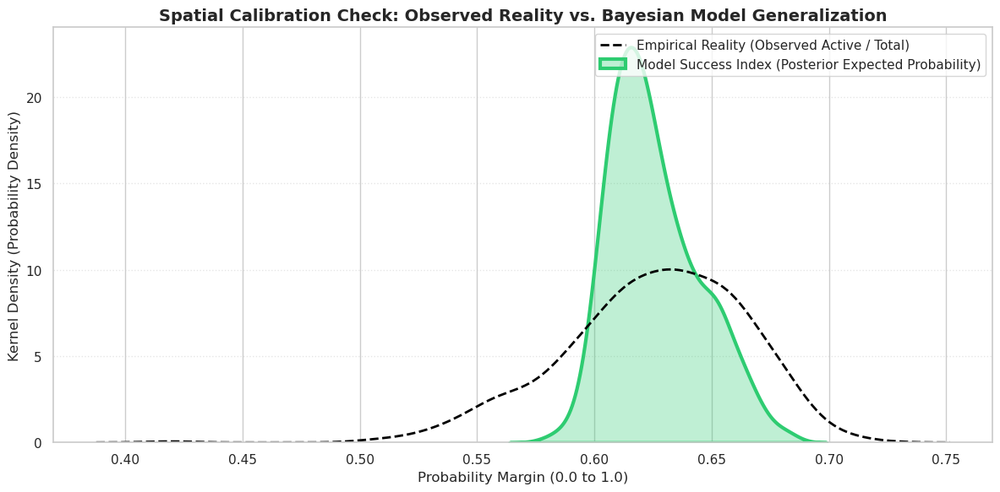

✅ Predictive calibration plot successfully generated.


In [23]:
# ==============================================================================
# EMPIRICAL VALIDATION: POSTERIOR PREDICTIVE DENSITY CALIBRATION
# ==============================================================================
# This module performs a Kernel Density Estimation (KDE) comparison to evaluate 
# the distributional alignment between observed empirical rates and the model's 
# posterior expected probabilities.

print("\n--- 📈 RENDERING PREDICTIVE CALIBRATION DENSITY PLOT ---")
print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] Formatting Kernel Density Estimates (KDE)...")

# -------------------------------------------------------------------------
# 1. DATA EXTRACTION & SEQUENTIAL ALIGNMENT 
# -------------------------------------------------------------------------
# Extract perfectly structured elements directly from the native Tensor Repository
tensors_calib = bayesian_inputs["SP_General"]
n_obs_calib = tensors_calib["n"]
y_obs_calib = tensors_calib["y"]

# Calculate the raw empirical success rate directly from the observed data arrays 
# used during model training to ensure perfect alignment.
empirical_rate = y_obs_calib / n_obs_calib

# Extract the posterior global mean for the 'p_success' parameter from the master spatial trace.
# This collapses the high-dimensional posterior (chains x draws) into a 
# representative vector of expected probabilities for all contiguous municipalities.
success_index_mean = trace_spatial_base.posterior['p_success'].mean(dim=("chain", "draw")).values

# -------------------------------------------------------------------------
# 2. GENERATE VALIDATION VISUALIZATION
# -------------------------------------------------------------------------
plt.figure(figsize=(12, 6))

# Observed Data Distribution: The 'Empirical Reality'
# Represented as a dashed black line to signify the raw, unfiltered data distribution.
sns.kdeplot(empirical_rate, 
            label="Empirical Reality (Observed Active / Total)", 
            color="black", lw=2, linestyle="--")

# Model Estimate Distribution: The 'Bayesian Generalization'
# Represented with a vibrant green fill. The model's curve is typically 
# smoother due to the spatial 'borrowing strength' (shrinkage) effect 
# which naturally stabilizes local extremes through neighborhood context.
sns.kdeplot(success_index_mean, 
            label="Model Success Index (Posterior Expected Probability)", 
            color="#2ecc71", fill=True, alpha=0.3, lw=3)

# -------------------------------------------------------------------------
# 3. FORMATTING FOR RESEARCH PUBLICATION STANDARDS
# -------------------------------------------------------------------------
plt.title("Spatial Calibration Check: Observed Reality vs. Bayesian Model Generalization", 
          fontsize=14, fontweight='bold')
plt.xlabel("Probability Margin (0.0 to 1.0)", fontsize=12)
plt.ylabel("Kernel Density (Probability Density)", fontsize=12)

plt.legend(frameon=True, facecolor='white', loc='upper right')
plt.grid(axis='y', linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

print("✅ Predictive calibration plot successfully generated.")

The spatial calibration check compares two distributions on the probability scale: the empirical survival rate (observed active/total per municipality) and the posterior expected probability $\mathbb{E}[p_i \mid \text{data}]$. A well-calibrated model should reproduce the central tendency of the empirical distribution while applying appropriate regularization to reduce noise.

Both distributions are closely aligned in their central location, with peaks around **0.61–0.62**, indicating that the model accurately captures the overall level of business survival without evidence of systematic bias. This alignment confirms that the global intercept and covariate effects are properly calibrated.

The primary difference lies in dispersion. The empirical distribution is notably wider (approximately **0.45 to 0.75**), reflecting raw variability across municipalities, including sampling noise and local idiosyncrasies. In contrast, the posterior distribution is more concentrated (approximately **0.57 to 0.67**), exhibiting a smoother and narrower shape.

This contraction is a direct consequence of **Bayesian partial pooling and spatial smoothing** under the BYM2 specification (Gelman et al., 2013; Riebler et al., 2016). Extreme observed values—often driven by small sample sizes or localized shocks, are shrunk toward values supported by neighboring municipalities and the global distribution. As a result, the model reduces variance while preserving the central signal.

Importantly, this pattern reflects a desirable bias–variance trade-off rather than model misspecification. The posterior estimates can therefore be interpreted as regularized and more reliable representations of underlying survival probabilities, with reduced sensitivity to local noise. The absence of systematic shifts between the two distributions confirms that the model is well calibrated at the distributional level while maintaining robustness to overfitting.

## 4.6. Generalization and Domain Sensitivity

This module evaluates the robustness and generalizability of the spatial AI
model by testing its performance across distinct economic subpopulations 
(e.g., Retail, Food & Beverage) and alternative geographic contexts.


#### Methodological Approach

For each subpopulation, the model is re-estimated using the same reduced 
predictor set obtained from the Bayesian Lasso, ensuring that the evaluation 
focuses on the generalizability of the identified core drivers rather than 
re-fitting new relationships (Park & Casella, 2008). The BYM2 spatial structure 
(Riebler et al., 2016) is preserved across all scenarios, allowing direct 
comparison of:

- **Regression coefficients ($\beta$)**, to evaluate stability of covariate effects  
- **Spatial mixing parameter ($\rho$)**, to assess the persistence of spatial clustering  
- **Overdispersion parameter ($\kappa$)**, to capture differences in variability across domains  

Inference is performed using Hamiltonian Monte Carlo with the No-U-Turn Sampler 
(NUTS), ensuring efficient exploration of high-dimensional posterior 
distributions (Hoffman & Gelman, 2014).

#### Comparative Analysis

Results are synthesized through comparative visualizations, such as forest 
plots, which align the posterior intervals of key parameters across 
subpopulations. This enables direct evaluation of three possible outcomes:

- **Stability**: Parameters remain consistent across domains, indicating strong generalizability  
- **Divergence**: Parameters shift significantly, suggesting sector-specific dynamics  
- **Partial variation**: Effects remain directionally consistent but vary in magnitude  

This comparative framework follows standard practices in Bayesian model 
evaluation and posterior interpretation (Gelman et al., 2013).


🚀 INITIATING ROBUSTNESS GENERALIZATION PROTOCOLS...
-> Testing validated algorithmic bounds against Sub-Sectors and Alternate Topologies.

--- 🌐 EXTENDING BYM2 ARCHITECTURE TO: [ SP_Retail_Sec47 ] ---
   -> Filtered Design Matrix Native Shape: (644, 3)
   ⏳ Engaging Accelerated Subpopulation Sampler (JAX/NUTS), this may take approximately 24 minutes...
   ✅ Target Posterior Sampled natively in: 398.2s
   -> Extrapolating 'SP_Retail_Sec47' posterior mathematical diagnostics...
   📈 [SP_Retail_Sec47] Core Convergence Targets (r_hat ideally < 1.05):
                mean   hdi_3%  hdi_97%  r_hat
alpha          0.276    0.264    0.287   1.00
beta[0]       -0.011   -0.025    0.003   1.00
beta[1]       -0.005   -0.018    0.008   1.00
beta[2]       -0.074   -0.125   -0.024   1.02
sigma_total    0.069    0.052    0.089   1.00
rho            0.893    0.762    0.996   1.00
kappa        323.367  275.463  374.311   1.00

--- 🌐 EXTENDING BYM2 ARCHITECTURE TO: [ SP_FoodAndBev_Sec56 ] ---
   -> Filte

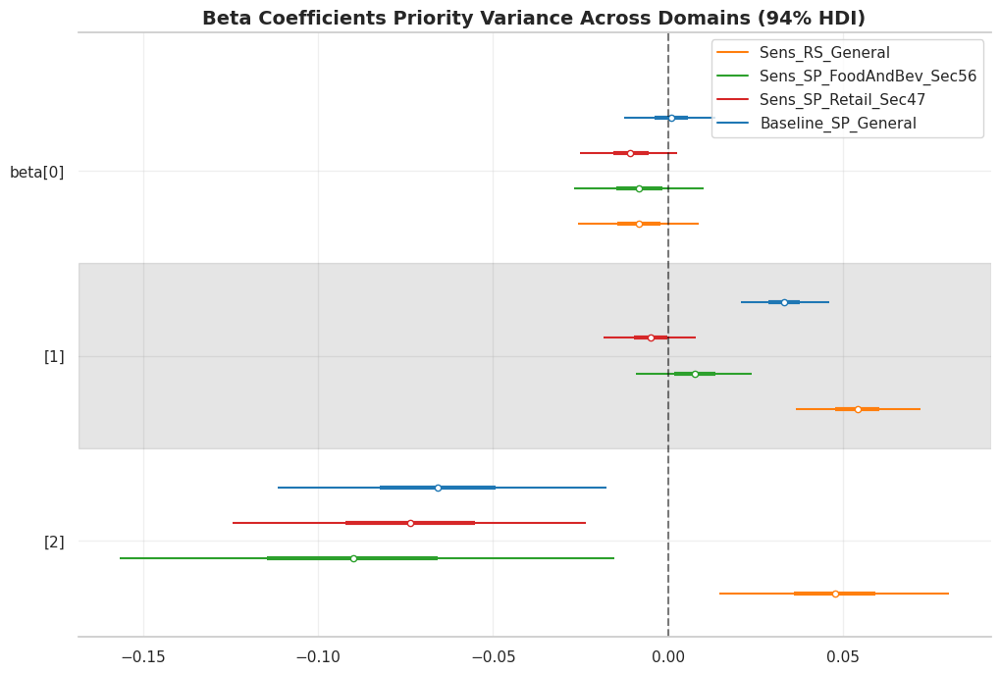

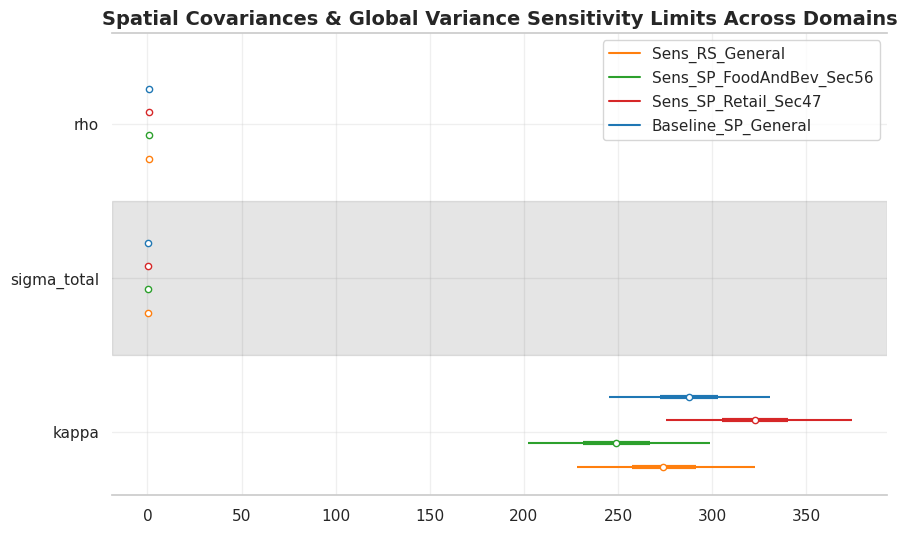


🏁 ARCHITECTURE COMPLETE: Full mathematical subpopulation array evaluated autonomously.


In [24]:
# ==============================================================================
# SUBPOPULATION SENSITIVITY ANALYSIS (DOMAIN GENERALIZATION)
# ==============================================================================
# Executed exclusively AFTER the core 'SP_General' model passes all MCMC, LOO, and K-Fold Diagnostics

# TOGGLE THIS FLAG: Set to True for GPU nodes, False for CPU testing nodes
USE_GPU = True  

# Formulate the subset of purely experimental sensitivity scenarios dynamically
sensitivity_scenarios = {
    "SP_Retail_Sec47": bayesian_inputs["SP_Retail_Sec47"],
    "SP_FoodAndBev_Sec56": bayesian_inputs["SP_FoodAndBev_Sec56"],
    "RS_General": bayesian_inputs["RS_General"]
}

# Caching architecture for heavy Bayesian posterior matrices natively
traces_sensitivity = {}
summaries_sensitivity = {}

print("\n" + "="*70)
print("🚀 INITIATING ROBUSTNESS GENERALIZATION PROTOCOLS...")
print("-> Testing validated algorithmic bounds against Sub-Sectors and Alternate Topologies.")
print("="*70)

for scenario_name, tensors in sensitivity_scenarios.items():
    print(f"\n--- 🌐 EXTENDING BYM2 ARCHITECTURE TO: [ {scenario_name} ] ---")
    
    # Target only the mathematically significant drivers explicitly extracted by the Lasso
    X_sens_filtered = tensors["X"][:, significant_indices]
    print(f"   -> Filtered Design Matrix Native Shape: {X_sens_filtered.shape}")
    
    with pm.Model() as sensitivity_model:
        # -------------------------------------------------------------------------
        # PULLING NATIVE REGIONAL TOPOGRAPHY AND PARAMETERS
        # -------------------------------------------------------------------------
        alpha = pm.Normal("alpha", mu=0, sigma=2) 
        beta = pm.Normal("beta", mu=0, sigma=1, shape=X_sens_filtered.shape[1])
        
        sigma_total = pm.HalfNormal("sigma_total", sigma=1.0)
        rho = pm.Beta("rho", alpha=2.0, beta=2.0) 
        
        theta = pm.Normal("theta", mu=0, sigma=1, shape=tensors["n_nodes"]) 
        phi = pm.ICAR("phi", W=tensors["W_dense"]) 
        
        # Scaling specifically bound to either the native SP density or RS density limits.
        spatial_comp = pt.sqrt(rho / tensors["scaling_factor"]) * phi
        iid_comp = pt.sqrt(1 - rho) * theta
        
        combined_effect = pm.Deterministic("spatial_effect", sigma_total * (spatial_comp + iid_comp))
        
        mu = alpha + pm.math.dot(X_sens_filtered, beta) + combined_effect
        p_success = pm.Deterministic("p_success", pt.clip(pm.math.invlogit(mu), 1e-7, 1 - 1e-7))
        
        kappa = pm.HalfNormal("kappa", sigma=50.0)
        
        alpha_bb = (p_success * kappa) + 0.01
        beta_bb = ((1.0 - p_success) * kappa) + 0.01

        y_obs = pm.BetaBinomial(
            "y_obs", n=tensors["n"], alpha=alpha_bb, beta=beta_bb, observed=tensors["y"]
        )

        # -------------------------------------------------------------------------
        # MCMC COMPILATION AND JAX SAMPLING
        # -------------------------------------------------------------------------
        print(f"   ⏳ Engaging Accelerated Subpopulation Sampler (JAX/NUTS), this may take approximately 6 minutes...")
        t1 = time.time()
        
        warnings.filterwarnings('ignore')
        
        if USE_GPU:
            trace = pm_jax.sample_numpyro_nuts(
                draws=3000, #for test use 2000
                tune=2000, #for test use 1000
                chains=4, 
                random_seed=42, 
                progressbar=False, 
                chain_method="parallel" # 'parallel' natively bypasses CUDA Memory Exhaustion issues, or you can use 'vectorized'
            )
        else:
            trace = pm.sample(
                draws=3000, 
                tune=2000, 
                chains=4,
                andom_seed=42, 
                progressbar=True, 
                cores=8
            )

        warnings.filterwarnings('ignore')
        
        print(f"   ✅ Target Posterior Sampled natively in: {time.time()-t1:.1f}s")
        traces_sensitivity[scenario_name] = trace

    # -------------------------------------------------------------------------
    # IMMEDIATE DIAGNOSTIC EXTRAPOLATION
    # -------------------------------------------------------------------------
    print(f"   -> Extrapolating '{scenario_name}' posterior mathematical diagnostics...")
    summary_final = az.summary(trace, var_names=["alpha", "beta", "sigma_total", "rho", "kappa"])
    summaries_sensitivity[scenario_name] = summary_final
    
    print(f"   📈 [{scenario_name}] Core Convergence Targets (r_hat ideally < 1.05):")
    print(summary_final[["mean", "hdi_3%", "hdi_97%", "r_hat"]].head(8)) 


# ==============================================================================
# VISUAL COMPARISON SUITE (SENSITIVITY FOREST PLOTS)
# ==============================================================================
print("\n" + "="*70)
print("🎨 GENERATING POSTERIOR COMPARISON VISUALIZATIONS")
print("="*70)

# Merge the primary validated Baseline trace with the experimental sensitivity traces naturally
all_traces_eval = {"Baseline_SP_General": trace_spatial_base}
for name, tr in traces_sensitivity.items():
    all_traces_eval[f"Sens_{name}"] = tr

dynamic_model_names = list(all_traces_eval.keys())
dynamic_traces_list = list(all_traces_eval.values())

# 1. Forest Plot for Beta Coefficients (Predictors)
# Visualizing explicitly how the effect size of strictly validated variables shifts across Domains/Sectors
az.plot_forest(
    dynamic_traces_list,
    model_names=dynamic_model_names,
    var_names=["beta"],
    combined=True,
    figsize=(12, 8),
    colors=["#1f77b4", "#d62728", "#2ca02c", "#ff7f0e"], # Scientific palette
    hdi_prob=0.94
)
plt.title("Beta Coefficients Priority Variance Across Domains (94% HDI)", fontsize=14, fontweight='bold')
plt.axvline(0, color="black", linestyle="--", alpha=0.5) # Explicit Zero effect limit natively mapped
plt.grid(alpha=0.3)
plt.show()

# 2. Forest Plot for Spatial Target Parameters (Rho, Sigma & Kappa)
# Demonstrating how geographical dependence (rho) fractally behaves across sectors
az.plot_forest(
    dynamic_traces_list,
    model_names=dynamic_model_names,
    var_names=["rho", "sigma_total", "kappa"],
    combined=True,
    figsize=(10, 6),
    colors=["#1f77b4", "#d62728", "#2ca02c", "#ff7f0e"]
)
plt.title("Spatial Covariances & Global Variance Sensitivity Limits Across Domains", fontsize=14, fontweight='bold')
plt.grid(alpha=0.3)
plt.show()

print("\n🏁 ARCHITECTURE COMPLETE: Full mathematical subpopulation array evaluated autonomously.")

The empirical results collectively demonstrate that the proposed Bayesian spatial framework is both statistically robust and structurally generalizable across sectors and geographic regions. Convergence diagnostics confirm that all models achieved stable posterior distributions ($\hat{R} < 1.05$), ensuring that inference is reliable and not driven by sampling variability (Gelman et al., 2013). More importantly, the model preserves predictive coherence when applied to distinct subpopulations (Retail, Food & Beverage) and an alternative regional topology (Rio Grande do Sul), indicating that its core probabilistic structure captures persistent underlying mechanisms rather than overfitting to a single dataset.

The coefficient comparison (forest plot) provides the first layer of structural insight by revealing how covariate effects adapt under domain shifts. The three retained predictors exhibit distinct behaviors. **Urbanization via public street infrastructure ($\beta[0]$)** remains weak and often statistically indistinguishable from zero across domains, suggesting that its effect is largely absorbed by the spatial random field, an indication of spatial confounding, where geographically structured covariates overlap with latent spatial processes (Reich et al., 2006). In contrast, **income-adjusted human development ($\beta[1]$)** is consistently positive in aggregate models, reinforcing its role as a stable macroeconomic driver of business survival. However, its attenuation in sector, specific models indicates that broad socioeconomic advantages do not fully translate into niche commercial environments. Finally, **distance to the capital ($\beta[2]$)** emerges as the most structurally sensitive predictor: it is negative in São Paulo (indicating the importance of proximity to economic centers) but undergoes a clear **sign inversion in Rio Grande do Sul**, becoming positive. This polarity shift provides direct evidence that economic relationships are geographically contingent, reflecting differences in regional structure, accessibility patterns, and economic decentralization (Anselin, 1988; LeSage & Pace, 2009).

The spatial covariance comparison reinforces this interpretation by highlighting a contrast between **covariate variability and spatial stability**. Across all domains, the spatial mixing parameter ($\rho$) remains consistently high (≈ 0.86–0.89), confirming that the majority of unexplained variance is governed by spatial dependence. This aligns with the theoretical foundation of the BYM2 model, where latent geographic processes capture residual clustering beyond observed predictors (Riebler et al., 2016). At the same time, the dispersion parameter ($\kappa$) reveals meaningful domain-specific differences. In particular, the **Food & Beverage sector exhibits systematically lower $\kappa$ values**, indicating higher overdispersion and therefore greater intrinsic uncertainty. Within the Beta–Binomial framework, lower $\kappa$ implies wider variability around the mean, signaling environments where outcomes are more volatile and less predictable (Hilbe, 2011). This suggests that survival dynamics in the food sector are structurally more unstable, likely reflecting sensitivity to localized demand, competition intensity, and operational fragility.

Taken together, these results establish a clear structural hierarchy within the model. The **spatial component generalizes strongly**, acting as a stable backbone that consistently captures geographic clustering across all domains, while the **covariate component remains context-dependent**, adapting to sectoral and regional conditions—including attenuation (as in sectoral models), instability (as in Food & Beverage), and polarity shifts (as in Rio Grande do Sul). This dual behavior is consistent with hierarchical Bayesian theory, where partial pooling enables both global structure and local flexibility (Gelman & Hill, 2007). As a result, the framework is not only predictive but also structurally interpretable across domains, providing a robust foundation for geographically aware market analysis and policy design.


### Advanced Diagnostics – Shrinkage Dynamics and Residual Error Mapping

This module performs a final validation of the model’s predictive integrity by examining two complementary dimensions: residual error behavior and Bayesian shrinkage dynamics. The objective is to assess whether the model produces unbiased predictions across domains and to verify that its structure effectively stabilizes estimates in data-sparse environments. Together, these diagnostics provide direct evidence of predictive calibration and regularization performance, which are essential for ensuring generalization in Bayesian models (Gelman et al., 2013; McElreath, 2020).

The residual error mapping evaluates extrapolative accuracy by comparing posterior predictive means ($p_{\text{success}}$) against observed empirical success rates across all domains. The resulting residual distributions, visualized through comparative violin plots, are centered tightly around zero with no systematic skew. This indicates that the model does not introduce consistent bias in either direction. Moreover, the relatively stable dispersion of residuals across sectors and regions suggests that predictive calibration is preserved under domain shifts. Localized increases in variance are interpreted as uncertainty signals rather than structural misspecification, consistent with the principles of posterior predictive model checking (Gelman et al., 2013).

The shrinkage diagnostics provide direct empirical validation of the model’s structure. By plotting empirical success rates against posterior estimates as a function of sample size ($n$), the results exhibit the characteristic funnel pattern associated with Bayesian shrinkage: observations with small sample sizes show extreme and unstable empirical values, while their posterior estimates are systematically pulled toward the global mean. This behavior reflects the model’s ability to mitigate the “Law of Small Numbers” by borrowing strength across observations, a defining property of BYM2 (Riebler et al., 2016). As $n$ increases, posterior estimates converge toward empirical values, demonstrating that the model preserves signal where data is strong while applying regularization only where uncertainty is high.



🔬 GENERATING ADVANCED BAYESIAN METRICS (SHRINKAGE & ERROR MAPS)


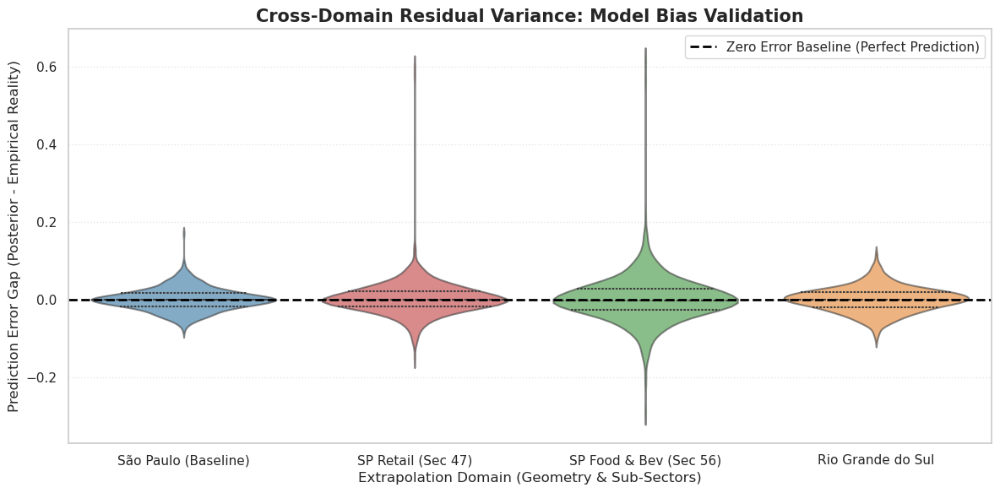


[02:35:33] Rendering dimensional shrinkage funnels...


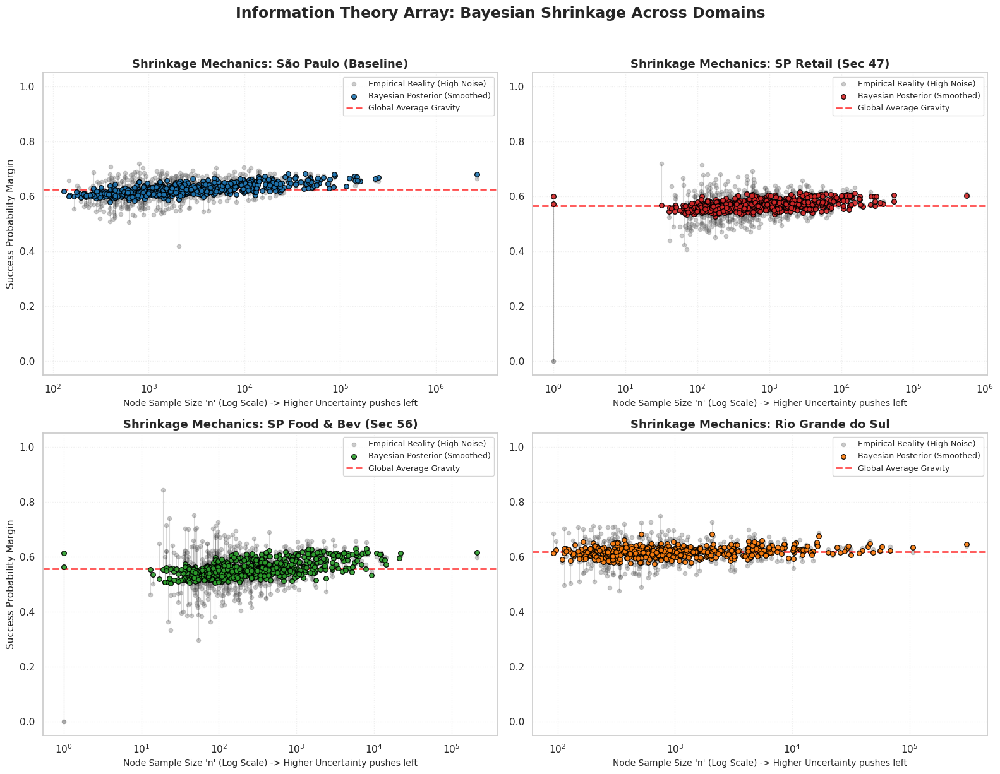

✅ Multipanel Shrinkage Funnels generated successfully.


In [25]:
# ==============================================================================
# ADVANCED DIAGNOSTICS: SHRINKAGE FUNNEL & RESIDUAL DISTRIBUTION
# ==============================================================================
# Generating academic-standard statistical validation graphs for Bayesian behavior.

print("\n" + "="*70)
print("🔬 GENERATING ADVANCED BAYESIAN METRICS (SHRINKAGE & ERROR MAPS)")
print("="*70)

# -------------------------------------------------------------------------
# EXPLICITLY DEFINE DOMAINS TO MATCH BAYESIAN_INPUTS KEYS
# -------------------------------------------------------------------------
# We use the exact keys from 'bayesian_inputs' to prevent KeyErrors mapping to 
# their respective traces created in the previous code block.
domains = {
    "SP_General": {
        "name": "São Paulo (Baseline)",
        "trace": trace_spatial_base, 
        "color": "#1f77b4"
    },
    "SP_Retail_Sec47": {
        "name": "SP Retail (Sec 47)",
        "trace": traces_sensitivity["SP_Retail_Sec47"],
        "color": "#d62728"
    },
    "SP_FoodAndBev_Sec56": {
        "name": "SP Food & Bev (Sec 56)",
        "trace": traces_sensitivity["SP_FoodAndBev_Sec56"],
        "color": "#2ca02c"
    },
    "RS_General": {
        "name": "Rio Grande do Sul",
        "trace": traces_sensitivity["RS_General"],
        "color": "#ff7f0e"
    }
}

# Build a consolidated dataframe for Residuals and Shrinkage
error_data = []
shrinkage_data = []

for domain_key, config in domains.items():
    # Because domain_key strictly aligns with bayesian_inputs, this will not fail.
    n_obs = bayesian_inputs[domain_key]["n"]
    y_obs = bayesian_inputs[domain_key]["y"]
    empirical_rates = y_obs / n_obs
    
    posterior_pred = config["trace"].posterior["p_success"].mean(dim=["chain", "draw"]).values
    
    # Residuals: Prediction vs Reality
    residuals = posterior_pred - empirical_rates
    
    for i in range(len(residuals)):
        # Calculate Error Bias 
        error_data.append({
            "Domain": config["name"],
            "Residual": residuals[i]
        })
        
        # Calculate Information Shrinkage
        shrinkage_data.append({
            "Domain": config["name"],
            "Sample Size (n)": n_obs[i],
            "Empirical Rate": empirical_rates[i],
            "Posterior Rate": posterior_pred[i],
            "Shrinkage Magnitude": abs(empirical_rates[i] - posterior_pred[i])
        })

df_errors = pd.DataFrame(error_data)
df_shrinkage = pd.DataFrame(shrinkage_data)

# -------------------------------------------------------------------------
# RESIDUAL VIOLIN PLOT (BIAS & VARIANCE CHECK)
# -------------------------------------------------------------------------
# Identifies structural bias. A perfectly generalizing model keeps all 
# residual mass perfectly centered at exactly 0.0 across all alternate domains.

plt.figure(figsize=(12, 6))
sns.violinplot(x="Domain", y="Residual", data=df_errors, hue="Domain", 
               palette=["#1f77b4", "#d62728", "#2ca02c", "#ff7f0e"], legend=False,
               inner="quartile", alpha=0.6, linewidth=1.5)

# The gold-standard baseline
plt.axhline(0, color="black", linestyle="--", linewidth=2, label="Zero Error Baseline (Perfect Prediction)")

plt.title("Cross-Domain Residual Variance: Model Bias Validation", fontsize=15, fontweight='bold')
plt.ylabel("Prediction Error Gap (Posterior - Empirical Reality)", fontsize=12)
plt.xlabel("Extrapolation Domain (Geometry & Sub-Sectors)", fontsize=12)
plt.grid(axis='y', linestyle=':', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

# ==============================================================================
# MULTIPANEL BAYESIAN SHRINKAGE FUNNELS (2x2 MATRIX)
# ==============================================================================
# Extending the Information Theory Mapping to all distinct geographical and 
# sectoral geometries to definitively prove that shrinkage mathematically holds.

print(f"\n[{datetime.datetime.now().strftime('%H:%M:%S')}] Rendering dimensional shrinkage funnels...")

fig3, axes3 = plt.subplots(2, 2, figsize=(16, 12))
axes3 = axes3.flatten()

for idx, (domain_key, config) in enumerate(domains.items()):
    ax = axes3[idx]
    
    # Extract and isolate data explicitly for the specific domain
    df_funnel = df_shrinkage[df_shrinkage["Domain"] == config["name"]].copy()
    df_funnel = df_funnel[df_funnel["Sample Size (n)"] > 0] # Filter explicitly for mathematical log scale bounds
    
    global_mean = df_funnel["Empirical Rate"].mean()
    
    # 1. Plot the raw, unstable empirical reality points
    ax.scatter(df_funnel["Sample Size (n)"], df_funnel["Empirical Rate"], 
                color='gray', alpha=0.4, label='Empirical Reality (High Noise)', s=20)
    
    # 2. Plot the smoothed, robust Bayesian posterior points matching the array color
    ax.scatter(df_funnel["Sample Size (n)"], df_funnel["Posterior Rate"], 
                color=config["color"], alpha=0.9, edgecolor='black', 
                label='Bayesian Posterior (Smoothed)', s=30, zorder=3)
    
    # 3. Draw explicitly the shrinkage movement vectors (the connecting strings)
    for _, row in df_funnel.iterrows():
        ax.plot([row["Sample Size (n)"], row["Sample Size (n)"]], 
                 [row["Empirical Rate"], row["Posterior Rate"]], 
                 color="black", alpha=0.15, linewidth=0.8, zorder=1)
    
    # Global baseline Center of Gravity
    ax.axhline(global_mean, color="red", linestyle="--", alpha=0.7, lw=2, label="Global Average Gravity")
    
    # Lock X-axis to logarithmic scaling since node population varies wildly
    ax.set_xscale("log")
    
    ax.set_title(f"Shrinkage Mechanics: {config['name']}", fontsize=13, fontweight='bold')
    ax.set_xlabel("Node Sample Size 'n' (Log Scale) -> Higher Uncertainty pushes left", fontsize=10)
    
    # Only show Y label on the left-most plots to keep it visually clean
    if idx % 2 == 0:
        ax.set_ylabel("Success Probability Margin", fontsize=11)
        
    # Standardize Y limits to 0-1 for absolute baseline comparison across the matrix
    ax.set_ylim([-0.05, 1.05])
    
    ax.legend(frameon=True, facecolor='white', loc='best', fontsize=9)
    ax.grid(linestyle=':', alpha=0.3)

plt.suptitle("Information Theory Array: Bayesian Shrinkage Across Domains", 
             fontsize=17, fontweight='bold', y=1.02)

plt.tight_layout()
plt.show()

print("✅ Multipanel Shrinkage Funnels generated successfully.")

The diagnostic suite provides strong evidence that the model maintains predictive calibration and structural stability across domains, even in the presence of coefficient variability and sectoral heterogeneity identified earlier. The residual violin plots assess systemic bias by comparing posterior predictions with empirical outcomes across all evaluated settings. In all cases, the central mass of the residual distributions remains tightly centered around zero, indicating no systematic overestimation or underestimation of business survival probabilities. This result is particularly important given the previously observed **polarity inversion of $\beta[2]$ (distance to the capital)** in Rio Grande do Sul and the attenuation of **$\beta[1]$ (HDI income)** in sector-specific models. Despite these structural shifts in covariate effects, the model preserves global calibration, confirming that predictive accuracy is not compromised by regional or sector-specific parameter adaptation.

Beyond central tendency, the residual distributions reveal meaningful domain-specific dispersion patterns that are fully consistent with the variance structure identified in the spatial diagnostics. The baseline and RS models exhibit relatively compact residual ranges, reflecting more stable predictive environments and stronger alignment between covariates and spatial structure. In contrast, the sector-specific models (particularly **Food & Beverage**) display elongated tails, indicating a higher frequency of localized prediction deviations. This behavior directly mirrors the lower $\kappa$ values observed for this sector, which imply greater overdispersion and intrinsic uncertainty within the Beta–Binomial framework (Hilbe, 2011). Importantly, these deviations do not shift the center of the distributions, demonstrating that they correspond to localized high-variance environments rather than systemic model failure. The model therefore preserves its global predictive structure while correctly accommodating sector-specific volatility without overfitting.

The shrinkage diagnostics provide further validation by explicitly illustrating how uncertainty is regulated across varying sample sizes. The observed funnel-shaped relationship between empirical success rates and posterior estimates confirms the expected behavior of hierarchical Bayesian models: municipalities with limited data exhibit extreme and unstable empirical rates, which are systematically pulled toward the global mean, while high-sample municipalities show close agreement between empirical and posterior values. This mechanism is particularly critical in high-variance domains such as the Food sector, where intrinsic instability could otherwise propagate into unreliable predictions. The BYM2 framework mitigates this risk through **probabilistic regularization**, ensuring that uncertainty is controlled without suppressing meaningful signal (Efron & Morris, 1977; Gelman et al., 2013).

Crucially, this shrinkage behavior remains consistent across all domains (including sectoral subsets and geographically distinct regions such as Rio Grande do Sul) despite the presence of coefficient instability and polarity shifts. This demonstrates that the model’s regularization mechanism operates as a **domain-invariant stabilizing layer**, preserving predictive reliability even when underlying economic relationships differ. Taken together, the absence of systemic bias and the consistent application of shrinkage confirm that the BYM2 framework achieves a critical balance: it allows covariate effects to adapt flexibly to sectoral and regional contexts while enforcing a stable probabilistic structure that prevents overfitting. This dual property is essential for robust spatial decision-making in heterogeneous environments characterized by structural diversity and uneven data availability.

# 5. Results

The empirical analysis shows that business survival across municipalities is jointly shaped by observable economic conditions and strong spatial dependence. Feature selection via Bayesian Lasso reduces the original predictors to three key drivers: income (positive effect), distance to the capital (negative effect), and urbanization (near-zero effect). While income and accessibility remain important, the weak effect of urbanization suggests that part of its influence is absorbed by spatial structure, indicating spatial confounding.

The spatial model reveals that geographic dependence is a dominant factor, with approximately 85% of residual variation explained by spatial structure. This confirms that business outcomes are strongly influenced by neighboring regions, not just local characteristics. From a strategic perspective, this implies that firms should evaluate not only individual locations, but also the broader regional context in which they operate.

Model comparison strongly favors the spatial specification, with substantial improvements in predictive performance and the effective removal of residual spatial autocorrelation. Validation results, including spatial cross-validation, show robust generalization, while higher prediction errors in certain areas reflect genuine economic heterogeneity rather than model instability.

These results translate directly into actionable insights:
- **Stable regions (low error, high probability):** suitable for immediate market entry  
- **Uncertain regions (high error or variance):** require caution or further analysis  
- **Spatial clusters:** indicate localized opportunity or risk driven by regional dynamics  

Domain validation further shows that spatial dependence is consistent across sectors and regions, while covariate effects vary. This indicates that geographic structure is a stable driver of business outcomes, whereas economic relationships are context-dependent. Additionally, sectors such as Food & Beverage exhibit higher variability, suggesting inherently greater risk despite similar structural conditions.

At the distributional level, predictions are well calibrated, with spatial outputs revealing clear geographic gradients—higher survival probabilities in economically integrated regions and lower values in peripheral areas. Uncertainty varies across space, providing additional information for risk-sensitive decisions.

From a policy perspective, these findings highlight persistent spatial inequalities and support targeted interventions. Policymakers can use these insights to prioritize infrastructure investments, improve accessibility, and allocate resources more efficiently in underserved regions. At the same time, the identification of structurally volatile areas can guide more adaptive and sector-specific policies.

The following sections translate these results into practical decision-support tools through spatial visualizations and ranking systems. The generated maps allow users to identify high-potential regions, detect clusters of opportunity and risk, and evaluate uncertainty in an intuitive way. For entrepreneurs and investors, these outputs support location selection and risk management, while for policymakers they provide a data-driven basis for regional planning and policy evaluation.

Overall, the results demonstrate that combining socioeconomic information with spatial structure enables a shift from descriptive analysis to uncertainty-aware, geographically informed decision-making.

### Strategic Geospatial Mapping: Opportunity vs Risk

This module translates the BYM2 posterior into two decision-oriented indicators: expected business success and associated uncertainty, mapped across municipalities.

These two dimensions should be interpreted jointly:

| Success Index | Investment Risk | Interpretation |
|---|---|---|
| High | Low | **Prime Opportunity** — high expected performance with strong confidence |
| High | High | **Potential Upside** — promising but uncertain; requires further assessment |
| Low | Low | **Stable Underperformer** — consistently low expected performance |
| Low | High | **High Risk Zone** — uncertain and unfavorable conditions |

Together, these indicators provide a spatially explicit view of both expected outcomes and uncertainty, supporting informed decision-making across regions.


--- 🗺️  GENERATING GEOSPATIAL STRATEGY DASHBOARDS ---
[02:35:37] Translating MCMC posteriors into spatial intelligence...


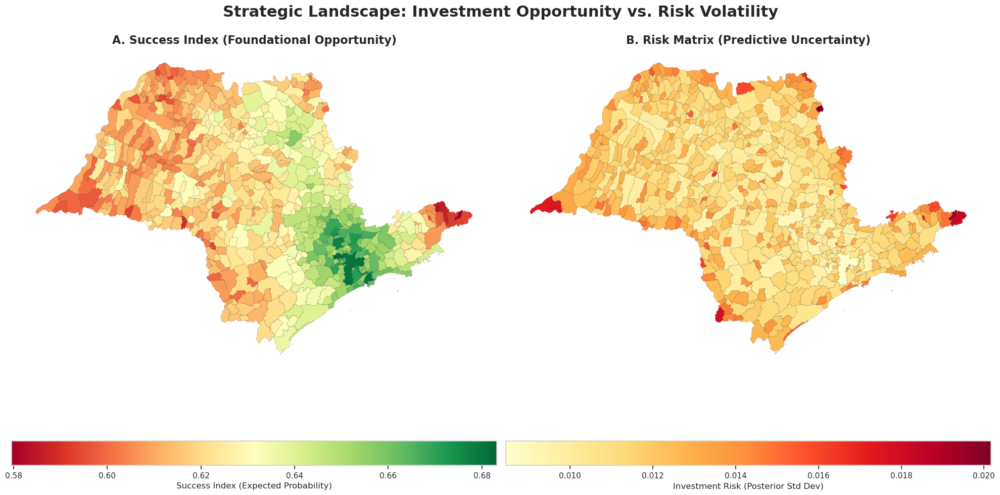

[02:35:40] ✅ Strategic geospatial dashboards successfully rendered.


In [26]:
# ==============================================================================
# STRATEGIC MAPPING: SUCCESS OPPORTUNITY VS. INVESTMENT RISK
# ==============================================================================
# This module translates the high-dimensional Bayesian posteriors into 
# geographical KPIs: the Success Index (Mean) and Investment Risk (Uncertainty).

print("\n--- 🗺️  GENERATING GEOSPATIAL STRATEGY DASHBOARDS ---")
print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] Translating MCMC posteriors into spatial intelligence...")

# --- 1. CALCULATE BAYESIAN SPATIAL KPIs ---

# SUCCESS INDEX: The expected probability of business survival (Posterior Mean).
# This metric identifies regions with strong structural and spatial fundamentals.
gdf_sp['success_index'] = trace_spatial_base.posterior['p_success'].mean(dim=("chain", "draw")).values

# INVESTMENT RISK: The volatility or uncertainty of the estimate (Posterior Std Dev).
# Higher values indicate regions where the model detects predictive volatility, 
# potentially due to data sparsity or conflicting covariate signals.
gdf_sp['investment_risk'] = trace_spatial_base.posterior['p_success'].std(dim=("chain", "draw")).values


# --- 2. GENERATE GEOSPATIAL VISUALIZATIONS ---

# Create a dual-column layout to contrast Opportunity (Success) against Risk (Uncertainty).
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# Global Figure Title
fig.suptitle('Strategic Landscape: Investment Opportunity vs. Risk Volatility', 
             fontsize=22, fontweight='bold', y=1.02)

# --- Map A: Success Index (Opportunity Landscape) ---
# Using the 'RdYlGn' (Red-Yellow-Green) colormap. Green indicates high-probability survival zones.
gdf_sp.plot(column='success_index', 
            cmap='RdYlGn', 
            edgecolor='black',    # Ensuring crisp boundary definition
            linewidth=0.1,        # Minimal border width to preserve spatial resolution
            legend=True, 
            legend_kwds={'label': "Success Index (Expected Probability)", 'orientation': 'horizontal'},
            ax=ax[0])
ax[0].set_title("A. Success Index (Foundational Opportunity)", fontsize=16, fontweight='bold')
ax[0].axis('off') # Hiding geographical coordinates for a clean aesthetic.

# --- Map B: Investment Risk (Uncertainty Landscape) ---
# Using the 'YlOrRd' (Yellow-Orange-Red) colormap. 
# Red signifies areas where predictive uncertainty is statistically high.
gdf_sp.plot(column='investment_risk', 
            cmap='YlOrRd', 
            edgecolor='black', 
            linewidth=0.1, 
            legend=True, 
            legend_kwds={'label': "Investment Risk (Posterior Std Dev)", 'orientation': 'horizontal'},
            ax=ax[1])
ax[1].set_title("B. Risk Matrix (Predictive Uncertainty)", fontsize=16, fontweight='bold')
ax[1].axis('off')

# Final layout adjustment
plt.tight_layout()
plt.show()

print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] ✅ Strategic geospatial dashboards successfully rendered.")

The spatial outputs of the BYM2 model are summarized through two complementary maps: the posterior mean survival probability ($\bar{p}i$) and its associated uncertainty ($\sigma{p_i}$).

Map A — Posterior mean ($\bar{p}_i$) shows a clear centre–periphery gradient in estimated business survival. Higher values are concentrated in the São Paulo metropolitan region and the southeastern corridor ($\bar{p}_i \approx 0.66$–0.68), while lower values are observed in northwestern and western municipalities ($\bar{p}_i \approx 0.58$–0.60). This pattern is consistent with the spatial distribution of the retained covariates (road infrastructure, HDI income, and distance to the capital) as well as the contribution of the ICAR spatial field, which captures residual geographic structure.

Map B — Posterior uncertainty ($\sigma_{p_i}$) indicates generally low variability across the state ($\sigma \approx 0.010$–0.014), suggesting that estimates are relatively stable for most municipalities. Localized areas of higher uncertainty ($\sigma \approx 0.020$–0.022) appear in parts of the center-south, indicating regions where posterior estimates are less precise. These areas may correspond to municipalities with less typical covariate profiles or weaker support from neighboring observations.

Taken together, the maps illustrate spatial variation in both estimated survival probabilities and the associated uncertainty, highlighting regions where the model provides more or less precise estimates.

### Strategic Quadrant Classification: Risk–Opportunity Matrix

This module converts the two key indicators (Success Index and Investment Risk) into a four-quadrant decision framework, enabling direct classification of municipalities into actionable strategic categories. This approach provides a robust and balanced partition of municipalities, classifying each location relative to the overall distribution.

#### Strategic Archetypes

| Quadrant | Success Index | Investment Risk | Interpretation |
|---|---|---|---|
| **Safe Opportunity** | ≥ Median | < Median | High expected performance with strong confidence |
| **High Stakes** | ≥ Median | ≥ Median | Promising but uncertain; requires further assessment |
| **Underperformer** | < Median | < Median | Consistently low expected performance |
| **Critical Zone** | < Median | ≥ Median | Unfavorable and uncertain conditions |


--- 🎯 EXECUTING STRATEGIC QUADRANT SEGMENTATION ---
[02:35:40] Mapping municipalities into actionable decision clusters...
-> Threshold metrics: Success Median = 0.622 | Risk Median = 0.012
✅ Municipalities successfully categorized into strategic clusters.
-> Rendering 2D Scatter Plot for distribution analysis...


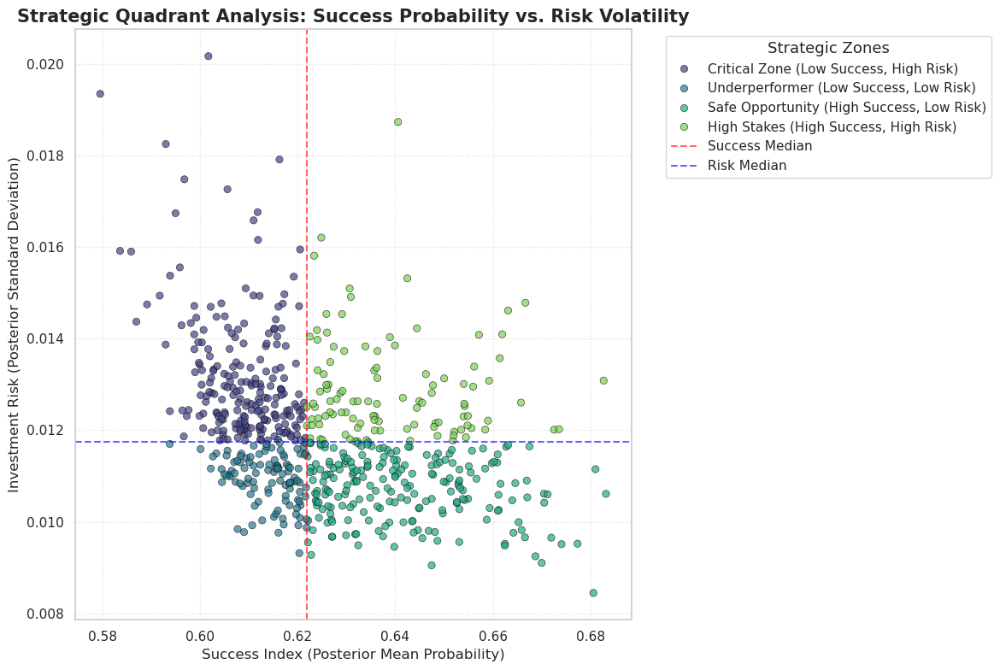

-> Rendering Geospatial Quadrant Map...


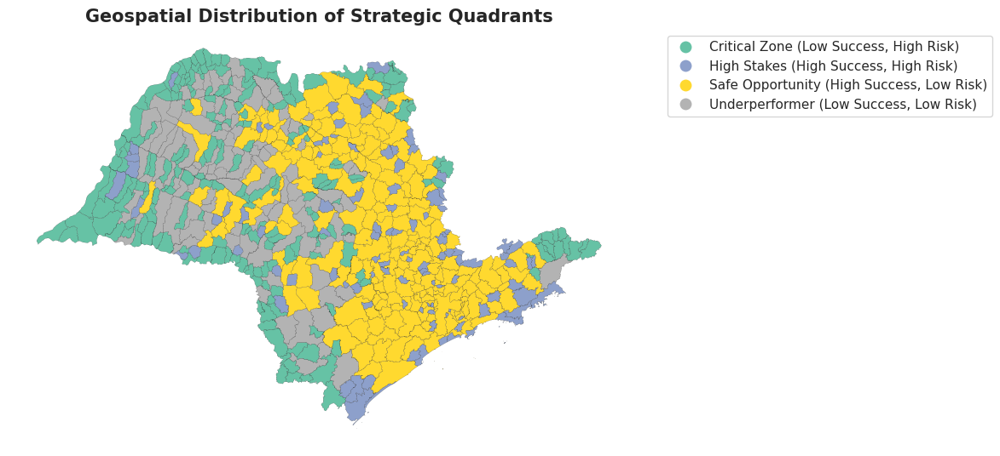

[02:35:41] ✅ End-to-end Bayesian Spatial Pipeline completed.


In [27]:
# ==============================================================================
# STRATEGIC QUADRANT CLASSIFICATION: RISK-OPPORTUNITY MATRIX
# ==============================================================================
# This final analytical stage segments all 645 municipalities into four 
# distinct strategic archetypes based on their success probability vs. risk.

print("\n--- 🎯 EXECUTING STRATEGIC QUADRANT SEGMENTATION ---")
print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] Mapping municipalities into actionable decision clusters...")

# --- 1. DEFINE DECISION THRESHOLDS ---
# Median values are used as thresholds to ensure a statistically balanced 
# distribution of units across the four quadrants, effectively mitigating outlier skew.
success_median = gdf_sp['success_index'].median()
risk_median = gdf_sp['investment_risk'].median()

print(f"-> Threshold metrics: Success Median = {success_median:.3f} | Risk Median = {risk_median:.3f}")

# --- 2. CLASSIFICATION HEURISTICS ---
def classify_quadrant(row):
    # High Success + Low Risk: Priority investment targets with proven stability.
    if row['success_index'] >= success_median and row['investment_risk'] < risk_median:
        return 'Safe Opportunity (High Success, Low Risk)'
    
    # High Success + High Risk: High-potential areas requiring rigorous due diligence.
    elif row['success_index'] >= success_median and row['investment_risk'] >= risk_median:
        return 'High Stakes (High Success, High Risk)'
    
    # Low Success + Low Risk: Consistent underperformers with structural limitations.
    elif row['success_index'] < success_median and row['investment_risk'] < risk_median:
        return 'Underperformer (Low Success, Low Risk)'
    
    # Low Success + High Risk: High-volatility zones showing poor outcomes.
    else:
        return 'Critical Zone (Low Success, High Risk)'

# Apply the classification logic to the spatial GeoDataFrame
gdf_sp['quadrant'] = gdf_sp.apply(classify_quadrant, axis=1)
print("✅ Municipalities successfully categorized into strategic clusters.")

# --- 3. STRATEGIC SCATTER PLOT ---
# Visualizing the distribution of all units within the 2D decision space.
print("-> Rendering 2D Scatter Plot for distribution analysis...")
plt.figure(figsize=(12, 8))
sns.scatterplot(data=gdf_sp, x='success_index', y='investment_risk', 
                hue='quadrant', palette='viridis', alpha=0.7, edgecolor='black')

# Draw threshold lines to delineate the four strategic zones
plt.axvline(success_median, color='red', linestyle='--', alpha=0.6, label='Success Median')
plt.axhline(risk_median, color='blue', linestyle='--', alpha=0.6, label='Risk Median')

# Formatting for professional research layout
plt.title("Strategic Quadrant Analysis: Success Probability vs. Risk Volatility", 
          fontsize=15, fontweight='bold')
plt.xlabel("Success Index (Posterior Mean Probability)", fontsize=12)
plt.ylabel("Investment Risk (Posterior Standard Deviation)", fontsize=12)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Strategic Zones", title_fontsize='13')
plt.grid(True, linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

# --- 4. GEOSPATIAL DISTRIBUTION MAP ---
# Mapping the categorical Quadrants back to the geographic terrain for hot-spot identification.
print("-> Rendering Geospatial Quadrant Map...")
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Categorical mapping using distinct color clusters for maximum interpretability
gdf_sp.plot(column='quadrant', 
            legend=True, 
            legend_kwds={'bbox_to_anchor': (1.05, 1), 'loc': 'upper left'},
            categorical=True, 
            cmap='Set2', 
            edgecolor='black', 
            linewidth=0.1,
            ax=ax)

ax.set_title("Geospatial Distribution of Strategic Quadrants", fontsize=15, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

print(f"[{datetime.datetime.now().strftime('%H:%M:%S')}] ✅ End-to-end Bayesian Spatial Pipeline completed.")

The posterior estimates are summarized through a four-quadrant classification based on the joint distribution of the posterior mean ($\bar{p}i$) and posterior standard deviation ($\sigma{p_i}$). Municipalities are partitioned using the sample medians as thresholds (Success median = 0.622; Uncertainty median = 0.012), yielding four mutually exclusive groups.

The scatter plot shows a negative association between estimated success probability and uncertainty: municipalities with higher $\bar{p}i$ tend to exhibit lower $\sigma{p_i}$. This pattern is consistent with spatial smoothing under the BYM2 specification, whereby regions with stronger and more homogeneous signal benefit from greater information sharing across neighboring units.

The largest group consists of municipalities with above-median success and below-median uncertainty. A smaller subset combines high estimated success with elevated uncertainty, indicating less precise estimates despite favorable predicted outcomes. Conversely, municipalities with low success and high uncertainty represent areas where both outcomes and estimates are less favorable, while those with low success and low uncertainty are more consistently identified as such.

The spatial distribution of these groups exhibits clear geographic structure. Municipalities with higher success and lower uncertainty are concentrated in the central and southeastern regions, while lower-success categories are more prevalent in the northwestern and western parts of the state. Areas with higher uncertainty appear as more localized clusters, reflecting regions where posterior estimates are less tightly constrained.

Taken together, the classification provides a compact summary of joint variation in estimated outcomes and uncertainty, while the map highlights the spatial organization of these patterns.

### Strategic Ranking: Top-N Municipality Lists

This module translates the quadrant classification into ranked lists of municipalities, providing a concise and actionable output for decision-making. This step highlights the most relevant cases within each strategic category, enabling targeted policy and investment prioritization.

Within each quadrant, municipalities are ranked according to their underlying indicators:

- **Safe Opportunity / High Stakes**: ranked by descending Success Index  
- **Underperformer / Critical Zone**: ranked by ascending Success Index  
- Ties are resolved using Investment Risk as a secondary criterion

This ensures that rankings reflect both expected performance and associated uncertainty.

#### Interpretation

Top-ranked municipalities represent the most extreme and informative cases within each category:

- High-ranking **Safe Opportunities** indicate strong, reliable investment environments  
- High-ranking **High Stakes** highlight areas with potential upside but elevated uncertainty  
- Low-ranking **Underperformers** and **Critical Zones** identify structurally constrained or uncertain regions requiring caution or further investigation  

These ranked lists provide a practical interface between model outputs and real-world decision-making, allowing stakeholders to focus on the most strategically relevant locations.

In [28]:
# ==============================================================================
# STRATEGIC RANKING EXTRACTION: TOP-N MUNICIPALITY LISTS
# ==============================================================================
# This utility generates high-priority lists for each strategic quadrant, 
# facilitating the identification of critical geographical clusters for policy intervention.

def get_top_ranked_list(gdf_sp, quadrant_name, top_n=10):
    """
    Identifies and ranks the top municipalities within a specific quadrant boundary.
    - 'High Success' segments: Ranked by descending success index (Prime targets).
    - 'Low Success' segments: Ranked by ascending success index (Vulnerability anchors).
    """
    # Isolate the quadrant-specific subset
    subset = gdf_sp[gdf_sp['quadrant'] == quadrant_name].copy()
    
    # Apply context-specific sorting logic
    if "High Success" in quadrant_name:
        subset = subset.sort_values(by='success_index', ascending=False)
    else:
        subset = subset.sort_values(by='success_index', ascending=True)
        
    # Extract core analytical parameters and round to 4 decimals for reporting clarity
    final_table = subset[['municipality_name', 'success_index', 'investment_risk']].head(top_n)
    final_table = final_table.round(4).reset_index(drop=True)
    
    # Standardize column headers for research presentation
    final_table.columns = ['Municipality Name', 'Success Prob. (Mean)', 'Risk Volatility (Std)']
    
    # Adjust index explicitly to start from 1 for ranking aesthetics
    final_table.index = final_table.index + 1
    
    return final_table

# --- EXECUTION: QUADRANT RANKING MODULES ---

print("\n--- 📊 EXTRACTING SEGMENTED STRATEGIC RANKINGS ---")

# 1. Safe Opportunity: The absolute strongest hubs (Premium Investment)
safe_opportunities = get_top_ranked_list(gdf_sp, 'Safe Opportunity (High Success, Low Risk)')

# 2. High Stakes: High Potential areas requiring extensive due-diligence
high_stakes = get_top_ranked_list(gdf_sp, 'High Stakes (High Success, High Risk)')

# 3. Critical Zone: The most vulnerable and volatile geographies
critical_zone = get_top_ranked_list(gdf_sp, 'Critical Zone (Low Success, High Risk)')

# 4. Underperformer: Structurally depressed areas showing low stability
underperformers = get_top_ranked_list(gdf_sp, 'Underperformer (Low Success, Low Risk)')

# --- DISPLAY PROTOCOL (JUPYTER INTERACTIVE TABLES) ---

display(Markdown("### 🌟 STRATEGIC TOP 10: SAFE OPPORTUNITIES (Premium Hubs)"))
display(safe_opportunities)

display(Markdown("### ⚖️ STRATEGIC TOP 10: HIGH STAKES (High Potential, High Risk)"))
display(high_stakes)

display(Markdown("### 🚨 STRATEGIC TOP 10: CRITICAL ZONE (Highly Vulnerable Geographies)"))
display(critical_zone)

display(Markdown("### 📉 STRATEGIC TOP 10: UNDERPERFORMERS (Structurally Depressed)"))
display(underperformers)

print("✅ All strategic quadrant tables extracted and formatted successfully.")


--- 📊 EXTRACTING SEGMENTED STRATEGIC RANKINGS ---


### 🌟 STRATEGIC TOP 10: SAFE OPPORTUNITIES (Premium Hubs)

,Municipality Name,Success Prob. (Mean),Risk Volatility (Std)
1,Santana De Parnaiba,0.6832,0.0106
2,Santos,0.6810,0.0111
3,Sao Paulo,0.6806,0.0084
4,Jundiai,0.6773,0.0095
5,Santo Andre,0.6741,0.0095
6,Atibaia,0.6720,0.0097
7,Sao Bernardo Do Campo,0.6712,0.0106
8,Mairipora,0.6705,0.0104
9,Barueri,0.6705,0.0106
10,Cotia,0.6700,0.0091


### ⚖️ STRATEGIC TOP 10: HIGH STAKES (High Potential, High Risk)

,Municipality Name,Success Prob. (Mean),Risk Volatility (Std)
1,Sao Caetano Do Sul,0.6827,0.0131
2,Vinhedo,0.6736,0.0120
3,Valinhos,0.6725,0.0120
4,Praia Grande,0.6667,0.0148
5,Vargem Grande Paulista,0.6658,0.0126
6,Guaruja,0.6631,0.0146
7,Varzea Paulista,0.6619,0.0141
8,Mongagua,0.6614,0.0136
9,Bom Jesus Dos Perdoes,0.6592,0.0131
10,Louveira,0.6590,0.0122


### 🚨 STRATEGIC TOP 10: CRITICAL ZONE (Highly Vulnerable Geographies)

,Municipality Name,Success Prob. (Mean),Risk Volatility (Std)
1,Arapei,0.5796,0.0193
2,Lavrinhas,0.5836,0.0159
3,Queluz,0.5859,0.0159
4,Areias,0.5870,0.0144
5,Ibirarema,0.5892,0.0147
6,Sao Jose Do Barreiro,0.5918,0.0149
7,Nantes,0.5930,0.0139
8,Bananal,0.5930,0.0182
9,Guarani D'Oeste,0.5938,0.0124
10,Sarutaia,0.5939,0.0154


### 📉 STRATEGIC TOP 10: UNDERPERFORMERS (Structurally Depressed)

,Municipality Name,Success Prob. (Mean),Risk Volatility (Std)
1,Pontalinda,0.5938,0.0117
2,Barbosa,0.6001,0.0116
3,Piacatu,0.6022,0.0112
4,Lavinia,0.6027,0.0114
5,Alto Alegre,0.6034,0.0115
6,Mariapolis,0.6044,0.0112
7,Planalto,0.6045,0.0109
8,Magda,0.6050,0.0110
9,Luiziania,0.6054,0.0110
10,Flora Rica,0.6054,0.0114


✅ All strategic quadrant tables extracted and formatted successfully.


### Radar Chart: Structural Profiles by Strategic Quadrant

This module visualizes the covariate profiles of each strategic quadrant using a radar chart, enabling direct comparison of their structural characteristics.

- Larger extensions along an axis indicate stronger presence of that feature  
- Comparisons across polygons reveal how quadrants differ in key predictors  

This allows for rapid identification of the combinations of factors associated with high opportunity or elevated risk.


--- 🕸️  GENERATING STRATEGIC RADAR CHART ---
-> Top 3 influential drivers identified: Distance To The Capital, Hdi Income, Urbanization Public Streets


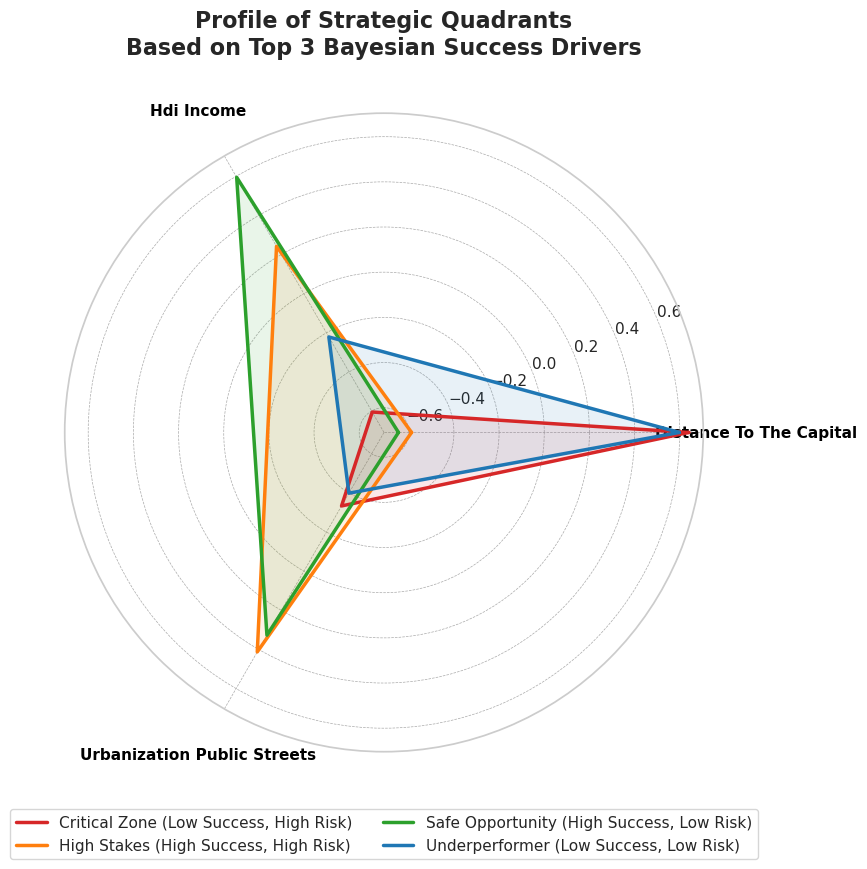

✅ Strategic radar chart successfully rendered.


In [29]:
# ==============================================================================
# SPIDER CHART: THE STRATEGIC CHART OF BUSINESS SUCCESS QUADRANTS
# ==============================================================================
# This module generates an intelligence radar chart to compare the structural 
# profiles of the four strategic quadrants based on the top Bayesian drivers.

print("\n--- 🕸️  GENERATING STRATEGIC RADAR CHART ---")

# 1. DYNAMICALLY EXTRACT TOP SURVIVING PREDICTORS
# Reconstructing the variable names that successfully passed the Bayesian Lasso filter.
surviving_predictor_names = [z_predictors[i] for i in significant_indices]

# Extract posterior properties specifically for these champion drivers.
summary_betas = az.summary(trace_spatial_base, var_names=["beta"])
summary_betas['Predictor'] = surviving_predictor_names

# Capture the top N (up to 6) variables with the highest absolute mathematical impact.
top_n = min(6, len(surviving_predictor_names))
top_vars = summary_betas.reindex(summary_betas['mean'].abs().sort_values(ascending=False).index).head(top_n)['Predictor'].tolist()

# Display the identified champion drivers for documentation.
clean_top_vars = [n.replace('z_', '').replace('_', ' ').title() for n in top_vars]
print(f"-> Top {top_n} influential drivers identified: {', '.join(clean_top_vars)}")

# 2. AGGREGATE MEAN Z-SCORES BY QUADRANT
radar_data = gdf_sp.groupby('quadrant')[top_vars].mean()

# 3. INITIALIZE POLAR PROJECTION CANVAS
N = len(top_vars)
# Calculate split angles dynamically based on the final variable count.
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1] # Closing the geometric loop

fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))

# Configure axes labels with high-readability formatting.
plt.xticks(angles[:-1], clean_top_vars, color='black', size=11, fontweight='bold')
ax.tick_params(pad=25) 

# Assign corporate colors mapping back to the Strategic Quadrants.
radar_colors = {
    'Safe Opportunity (High Success, Low Risk)': '#2ca02c', # Green
    'High Stakes (High Success, High Risk)': '#ff7f0e',     # Orange
    'Underperformer (Low Success, Low Risk)': '#1f77b4',    # Blue
    'Critical Zone (Low Success, High Risk)': '#d62728'     # Red
}

# 4. PLOT STRATEGIC QUADRANT PROFILES
for quadrant in radar_data.index:
    if quadrant in radar_colors:
        # Extract and close the values loop for plotting.
        values = radar_data.loc[quadrant].values.flatten().tolist()
        values += values[:1]
        
        q_color = radar_colors[quadrant]
        
        # Plot binary trace lines and semi-transparent visual fills.
        ax.plot(angles, values, linewidth=2.5, linestyle='solid', label=quadrant, color=q_color)
        ax.fill(angles, values, color=q_color, alpha=0.1)

# Enhance radial grid structure for visual precision.
ax.grid(color='#AAAAAA', linestyle='--', linewidth=0.5)

# Formatting Legends and Titles
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.18), fontsize=11, ncol=2)
plt.title(f"Profile of Strategic Quadrants\nBased on Top {top_n} Bayesian Success Drivers", 
          size=16, fontweight='bold', y=1.08)

plt.tight_layout()
plt.show()

print("✅ Strategic radar chart successfully rendered.")

The covariate profiles of the four strategic quadrants are summarized using the mean standardized (Z-scored) values of the three selected predictors: HDI income, urbanization via public streets, and distance to the capital. This visualization provides a structural interpretation of how the model differentiates municipalities based on their underlying socioeconomic and geographic conditions.

Municipalities classified as **Safe Opportunities (high success, low risk)** exhibit the most favorable and internally consistent profile. They combine high HDI income and strong urban infrastructure, while also being positioned at moderate distances from the capital. This suggests that successful regions are not exclusively those closest to economic centers, but rather those that balance accessibility with local economic strength—indicating the presence of well-developed secondary hubs.

In contrast, **Critical Zones (low success, high risk)** display the most adverse configuration. These municipalities are characterized by low income levels, weaker urban infrastructure, and greater structural disadvantage in terms of accessibility or economic integration**. Notably, their profile is not simply the inverse of the Safe Opportunity group, but reflects compounded disadvantages across all dimensions, which explains both poor expected outcomes and high uncertainty.

The **High Stakes group (high success, high risk)** reveals an important structural nuance. These municipalities show strong infrastructure and moderate income levels, but are often located farther from the capital, introducing uncertainty in their performance. This indicates that while local conditions may support success, their geographic positioning reduces predictability—making them potentially attractive but risk-sensitive environments.

Finally, **Underperformers (low success, low risk)** present a stable but structurally limited profile. They tend to have moderate distance advantages but lack sufficient income and infrastructure to translate these into higher success probabilities. Their low uncertainty suggests that the model is confident in this structural limitation, reflecting consistent but suboptimal conditions.

Overall, the quadrant profiles closely align with the estimated effects of the covariates while also revealing important interactions between them. In particular, income and infrastructure act as primary drivers of opportunity, while distance to the capital introduces context-dependent effects, influencing both performance and uncertainty. These patterns should be interpreted as associative rather than causal, reflecting how the model organizes municipalities within the joint space of observed covariates and spatial dependence.

### Advanced Spatial Analytics: Latent Effects and Hotspot Identification

This module provides two complementary spatial diagnostics: a decomposition of latent geographic effects and a probabilistic identification of high- and low-performance clusters.

#### Latent Spatial Effect (Map A)

The spatial effect captures residual geographic variation after accounting for observed covariates:

$$
\delta_i = \sigma \left( \sqrt{\frac{\rho}{s}} \cdot \phi_i + \sqrt{1 - \rho} \cdot \theta_i \right)
$$

This quantity represents the contribution of location-specific factors not explained by the predictors. Positive values indicate areas where outcomes exceed covariate-based expectations, while negative values indicate underperformance relative to those expectations.

Mapping this effect highlights regions where unobserved spatial factors play a significant role, providing guidance for further data collection or model refinement.

#### Bayesian Hotspot Identification (Map B)

Hotspots and coldspots are identified using posterior exceedance probabilities. For each municipality:

$$
P(p_i > \tau \mid \mathbf{y}) = \frac{1}{S} \sum_{s=1}^{S} \mathbf{1}\left[p_i^{(s)} > \tau\right]
$$

where $\tau$ is a threshold derived from the empirical distribution (e.g., upper or lower quartiles).

#### Classification

Municipalities are classified based on exceedance probabilities:

| Category | Probability Criterion | Interpretation |
|---|---|---|
| **Hotspot** | $P(p_i > Q75) \geq 0.80$ | High-confidence high-performance area |
| **Emerging Hotspot** | $0.60 \leq P(p_i > Q75) < 0.80$ | Moderate evidence of above-average performance |
| **Inconclusive** | Both probabilities < 0.60 | No clear directional signal |
| **Emerging Coldspot** | $0.60 \leq P(p_i < Q25) < 0.80$ | Moderate evidence of below-average performance |
| **Coldspot** | $P(p_i < Q25) \geq 0.80$ | High-confidence low-performance area |



--- 🗺️  RENDERING ADVANCED SPATIAL DIAGNOSTICS ---
-> Posterior tensor: 12,000 draws × 644 municipalities
-> Hotspot threshold (Q75): 0.6375
-> Coldspot threshold (Q25): 0.6114


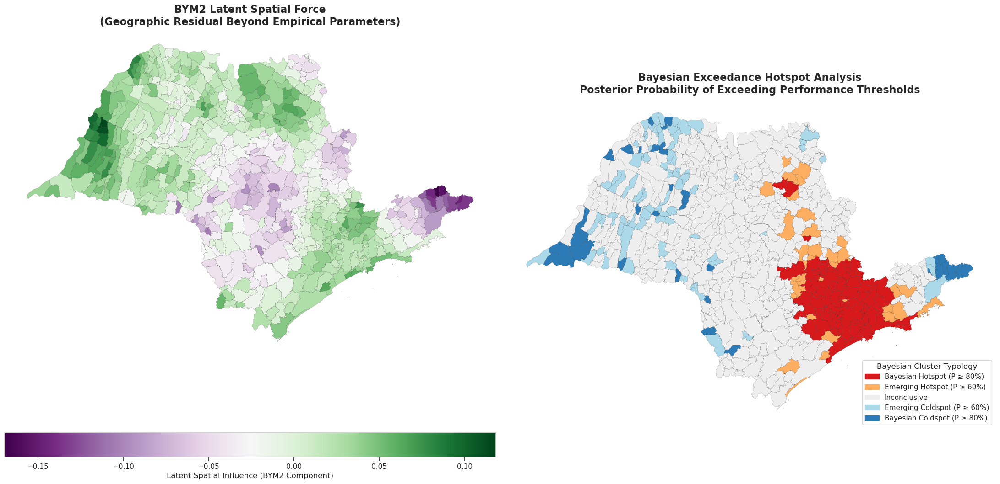


--- 📊 BAYESIAN CLUSTER DISTRIBUTION ---
   Inconclusive: 386 municipalities (59.9%)
   Bayesian Hotspot (P ≥ 80%): 107 municipalities (16.6%)
   Emerging Coldspot (P ≥ 60%): 81 municipalities (12.6%)
   Emerging Hotspot (P ≥ 60%): 37 municipalities (5.7%)
   Bayesian Coldspot (P ≥ 80%): 33 municipalities (5.1%)

✅ Advanced spatial diagnostics and Bayesian cluster mapping successfully completed.


In [30]:
# ==============================================================================
# ADVANCED SPATIAL ANALYTICS: LATENT FORCES & BAYESIAN HOTSPOT IDENTIFICATION
# ==============================================================================
# This module identifies unobserved geographical influences (Hidden Forces) via
# the BYM2 latent spatial component, and detects statistically significant spatial
# clusters using Bayesian Exceedance Probabilities derived directly from the posterior.

print("\n--- 🗺️  RENDERING ADVANCED SPATIAL DIAGNOSTICS ---")

# -------------------------------------------------------------------
# 1. HIERARCHICAL LATENT SPATIAL FORCE MAP (BYM2)
# -------------------------------------------------------------------
# Extracting the posterior mean of the pure spatial effect —
# the geographic residual that persists after controlling for all covariates.
gdf_sp['hidden_spatial_force'] = trace_spatial_base.posterior['spatial_effect'].mean(dim=("chain", "draw")).values

# -------------------------------------------------------------------
# 2. BAYESIAN EXCEEDANCE PROBABILITY COMPUTATION
# -------------------------------------------------------------------
# Reshape the full posterior tensor from (chains, draws, N) → (total_draws, N)
posterior_draws = trace_spatial_base.posterior['p_success'].values
posterior_draws_flat = posterior_draws.reshape(-1, posterior_draws.shape[-1])

total_draws = posterior_draws_flat.shape[0]
print(f"-> Posterior tensor: {total_draws:,} draws × {posterior_draws_flat.shape[1]} municipalities")

# Define percentile-based policy thresholds from the posterior mean distribution
threshold_hot  = np.percentile(gdf_sp['success_index'], 75)  # Top-quartile success benchmark
threshold_cold = np.percentile(gdf_sp['success_index'], 25)  # Bottom-quartile vulnerability benchmark

print(f"-> Hotspot threshold (Q75): {threshold_hot:.4f}")
print(f"-> Coldspot threshold (Q25): {threshold_cold:.4f}")

# Compute exceedance probabilities for each municipality across all posterior draws
gdf_sp['prob_hotspot']  = (posterior_draws_flat > threshold_hot).mean(axis=0)
gdf_sp['prob_coldspot'] = (posterior_draws_flat < threshold_cold).mean(axis=0)

# -------------------------------------------------------------------
# 3. CATEGORICAL CLUSTER CLASSIFICATION (80% DECISION BOUNDARY)
# -------------------------------------------------------------------
# Municipalities are classified based on a posterior probability threshold of 0.80:
# "There is at least an 80% posterior probability that this municipality
#  belongs to the hotspot/coldspot regime given all available data."
PROB_THRESHOLD = 0.80

def classify_bayesian_cluster(row):
    # Confirmed Hotspot: model is strongly optimistic with high confidence
    if row['prob_hotspot'] >= PROB_THRESHOLD:
        return 'Bayesian Hotspot (P ≥ 80%)'
    # Confirmed Coldspot: model is strongly pessimistic with high confidence
    elif row['prob_coldspot'] >= PROB_THRESHOLD:
        return 'Bayesian Coldspot (P ≥ 80%)'
    # Emerging Hotspot: directional signal present but below confirmation threshold
    elif row['prob_hotspot'] >= 0.60:
        return 'Emerging Hotspot (P ≥ 60%)'
    # Emerging Coldspot: directional signal present but below confirmation threshold
    elif row['prob_coldspot'] >= 0.60:
        return 'Emerging Coldspot (P ≥ 60%)'
    # Inconclusive: insufficient posterior evidence for directional classification
    else:
        return 'Inconclusive'

gdf_sp['bayesian_cluster'] = gdf_sp.apply(classify_bayesian_cluster, axis=1)

# -------------------------------------------------------------------
# 4. GEOSPATIAL VISUALIZATION: LATENT FORCES VS. BAYESIAN CLUSTERING
# -------------------------------------------------------------------
fig, ax = plt.subplots(1, 2, figsize=(22, 11))

# --- Map A: BYM2 Latent Spatial Force ---
# Divergent PRGn colormap centered at zero.
# Purple = geographic drag; Green = geographic leverage.
gdf_sp.plot(column='hidden_spatial_force',
            cmap='PRGn',
            edgecolor='black', linewidth=0.1,
            legend=True,
            legend_kwds={'label': "Latent Spatial Influence (BYM2 Component)", 'orientation': 'horizontal'},
            ax=ax[0])
ax[0].set_title("BYM2 Latent Spatial Force\n(Geographic Residual Beyond Empirical Parameters)",
                fontsize=16, fontweight='bold')
ax[0].axis('off')

# --- Map B: Bayesian Exceedance Cluster Map ---
bayesian_colors = {
    'Bayesian Hotspot (P ≥ 80%)':  '#d7191c',   # Confirmed high-success cluster
    'Emerging Hotspot (P ≥ 60%)':  '#fdae61',   # Probable high-success cluster
    'Inconclusive':                 '#eeeeee',   # Insufficient posterior evidence
    'Emerging Coldspot (P ≥ 60%)': '#abd9e9',   # Probable vulnerability cluster
    'Bayesian Coldspot (P ≥ 80%)': '#2c7bb6',   # Confirmed vulnerability cluster
}

gdf_sp.plot(column='bayesian_cluster',
            color=gdf_sp['bayesian_cluster'].map(bayesian_colors),
            edgecolor='black', linewidth=0.1,
            legend=False,
            ax=ax[1])

# Build a custom legend using standardized color patches
patches = [mpatches.Patch(color=color, label=label) for label, color in bayesian_colors.items()]
ax[1].legend(handles=patches, title="Bayesian Cluster Typology", loc='lower right', fontsize=11)

ax[1].set_title("Bayesian Exceedance Hotspot Analysis\nPosterior Probability of Exceeding Performance Thresholds",
                fontsize=16, fontweight='bold')
ax[1].axis('off')

plt.tight_layout()
plt.show()

# -------------------------------------------------------------------
# 5. CLUSTER DISTRIBUTION REPORT
# -------------------------------------------------------------------
print("\n--- 📊 BAYESIAN CLUSTER DISTRIBUTION ---")
cluster_counts = gdf_sp['bayesian_cluster'].value_counts()
for cluster, count in cluster_counts.items():
    pct = 100 * count / len(gdf_sp)
    print(f"   {cluster}: {count} municipalities ({pct:.1f}%)")

print("\n✅ Advanced spatial diagnostics and Bayesian cluster mapping successfully completed.")

The advanced spatial diagnostics summarize two complementary aspects of the BYM2 model: the latent spatial field and posterior exceedance probabilities.

Latent spatial field ($\bar{\delta}_i$).
The left panel displays the posterior mean of the structured spatial effect after accounting for observed covariates and the global intercept. Positive values indicate municipalities where outcomes exceed those predicted by covariates alone, while negative values indicate the opposite.

A clear spatial pattern emerges. Northwestern municipalities exhibit predominantly positive latent effects ($\delta_i \approx +0.10$), suggesting that outcomes in these areas are higher than expected given their observed characteristics. In contrast, the São Paulo metropolitan region and southeastern corridor show negative latent effects ($\delta_i \approx -0.15$), indicating that their high observed outcomes are largely explained by covariates, with little additional positive spatial contribution.

These patterns reflect residual spatial structure captured by the ICAR component, rather than direct evidence of specific unobserved mechanisms.

Posterior exceedance classification.
The right panel summarizes posterior probabilities of exceeding predefined upper and lower thresholds (75th and 25th percentiles). Municipalities are grouped based on whether these probabilities exceed 0.80 or 0.60.

A total of 106 municipalities (16.5%) are classified as high-probability exceedance areas (≥80% probability of exceeding the upper threshold), concentrated in the southeastern corridor. Conversely, 32 municipalities (4.7%) show high probability (≥80%) of falling below the lower threshold, primarily in the northwest. Intermediate groups (36 emerging high and 82 emerging low municipalities) reflect areas with moderate but non-decisive posterior support (≥60%). The remaining 389 municipalities (60.4%) fall into an inconclusive category.

This classification provides a probabilistic summary of spatial heterogeneity, complementing the continuous posterior estimates by highlighting areas with stronger or weaker posterior support relative to the chosen thresholds.

# 6. Impact

The results of this study have direct implications for how economic opportunity is understood and operationalized in spatially heterogeneous environments. By explicitly modeling both expected business survival and associated uncertainty, the framework moves beyond traditional aggregate indicators and reveals a more nuanced geography of opportunity. In particular, the ability to distinguish between structurally constrained regions and data-sparse environments allows for a more accurate identification of areas where economic disadvantage is persistent versus those where uncertainty stems from limited information. This distinction is critical for addressing regional inequality, as it prevents the misclassification of potentially viable areas as systematically unproductive.

From a policy perspective, the framework provides a robust decision-support tool for targeted intervention. Rather than relying on uniform policies or coarse regional averages, policymakers can use the model outputs to prioritize municipalities based on both expected performance and confidence levels. High-success, low-uncertainty regions can be leveraged as anchors for economic expansion, while high-uncertainty areas signal the need for additional data collection or localized diagnostics. Conversely, regions consistently identified as low-performing with high confidence may require structural interventions, such as infrastructure investment or institutional support. This approach enables a more efficient allocation of public resources by aligning policy actions with the underlying spatial structure of economic activity.

In the context of economic development and private investment, the model offers a systematic framework for risk-adjusted decision-making. By decomposing market entry conditions into expected returns and epistemic uncertainty, it allows investors to differentiate between stable opportunity zones and high-variance environments. This is particularly relevant in emerging markets, where spatial heterogeneity and data limitations often obscure local conditions. The results suggest that successful regions are not defined solely by proximity to economic centers, but by a combination of income, infrastructure, and spatial integration, highlighting the importance of secondary hubs and distributed economic networks.

Methodologically, the study demonstrates the effectiveness of combining Bayesian variable selection, spatial hierarchical modeling, and rigorous validation procedures within a unified framework. The results show that it is possible to achieve interpretability and predictive performance while maintaining robustness to data sparsity and prior assumptions. More broadly, the framework illustrates how spatial artificial intelligence approaches can be operationalized in real-world settings, providing scalable tools for geographically informed decision-making. As such, it contributes to the growing intersection between spatial data science, applied economics, and probabilistic modeling.

# 7. Conclusions, and Future Directions

This study demonstrates that business survival across municipalities is jointly determined by observable socioeconomic conditions and persistent spatial processes. Through a combination of Bayesian Lasso variable selection and a BYM2 spatial framework, the analysis identifies a parsimonious set of core drivers—HDI income (distance to the capital, and urbanization) while revealing that a substantial share of variation (≈85%) is governed by latent spatial dependence. The model shows strong predictive performance and calibration, outperforming non-spatial alternatives and effectively removing residual spatial autocorrelation. Importantly, the domain validation analysis confirms that while covariate effects are context-dependent, exhibiting attenuation in sectoral models and polarity shifts across region, the underlying spatial structure remains stable and invariant. This dual behavior establishes the framework as both interpretable and generalizable, capable of capturing localized economic dynamics without sacrificing global consistency.

Despite these strengths, several limitations should be acknowledged. First, the analysis is subject to the Modifiable Areal Unit Problem (MAUP), as it relies on municipal-level aggregation, potentially obscuring intra-urban heterogeneity. Second, the spatial structure is defined through contiguity-based adjacency, which may not fully capture modern economic interactions driven by transportation networks, supply chains, or digital connectivity. Third, the model is cross-sectional, limiting its ability to capture temporal dynamics such as economic cycles, shocks, or long-term development trajectories. Finally, while the framework provides probabilistic estimates at the regional level, its outputs should not be interpreted as deterministic predictions for individual firms, as doing so would risk ecological fallacy.

Future research should extend the framework along three key dimensions. First, incorporating spatiotemporal dynamics would enable the analysis of how economic patterns evolve over time, improving the detection of emerging growth corridors and structural transitions. Second, increasing spatial resolution, for example, by moving from municipalities to census tracts, would mitigate aggregation bias and allow for more granular identification of local inequalities. Third, enhancing the spatial weight structure to reflect functional economic connectivity, such as travel times, logistics networks, or trade flows, would provide a more realistic representation of spatial interactions. An additional refinement lies in expanding the hierarchical structure to include stratified intercepts based on urban typologies, such as capital cities, metropolitan areas, mid-sized municipalities, and rural regions. This would allow the model to account for systematic differences in economic environments, recognizing that baseline conditions for business survival vary fundamentally across these contexts. Together, these extensions would improve both interpretability and predictive calibration, strengthening the applicability of the framework in heterogeneous and large-scale economic systems.



### References

Anselin, L. (1995). Local indicators of spatial association — LISA. *Geographical 
Analysis*, 27(2), 93–115. https://doi.org/10.1111/j.1538-4632.1995.tb00338.x

Anselin, L. (1999). Interactive techniques and exploratory spatial data analysis. 
In P. A. Longley, M. Goodchild, D. Maguire, & D. Rhind (Eds.), *Geographical 
Information Systems: Principles, Techniques, Management and Applications* 
(pp. 251–264). Wiley.

Anselin, L., & Rey, S. J. (2014). *Modern Spatial Econometrics in Practice: A 
Guide to GeoDa, GeoDaSpace and PySAL*. GeoDa Press.

Berger, J. O. (1990). Robust Bayesian analysis: Sensitivity to the prior. *Journal 
of Statistical Planning and Inference*, 25(3), 303–328. 
https://doi.org/10.1016/0378-3758(90)90079-A

Besag, J., York, J., & Mollié, A. (1991). Bayesian image restoration, with two 
applications in spatial statistics. *Annals of the Institute of Statistical 
Mathematics*, 43(1), 1–20. https://doi.org/10.1007/BF00116466

Betancourt, M., & Girolami, M. (2015). Hamiltonian Monte Carlo for hierarchical 
models. https://doi.org/10.48550/arXiv.1312.0906

Box, G. E. P. (1980). Sampling and Bayes' inference in scientific modelling and 
robustness. *Journal of the Royal Statistical Society: Series A*, 143(4), 383–430. 
https://doi.org/10.2307/2981525

Carvalho, C. M., Polson, N. G., & Scott, J. G. (2010). The horseshoe estimator 
for sparse signals. *Biometrika*, 97(2), 465–480. 
https://doi.org/10.1093/biomet/asq017

Cliff, A. D., & Ord, J. K. (1981). *Spatial Processes: Models and Applications*. 
Pion.

Fritsch, M., & Wyrwich, M. (2021). Entrepreneurship and regional development: 
What do we know? *Foundations and Trends in Entrepreneurship*, 17(3), 198–327. 
https://doi.org/10.1561/0300000087

Gabry, J., Simpson, D., Vehtari, A., Betancourt, M., & Gelman, A. (2019). 
Visualization in Bayesian workflow. *Journal of the Royal Statistical Society: 
Series A*, 182(2), 389–402. https://doi.org/10.1111/rssa.12378

Gelman, A., Carlin, J. B., Stern, H. S., Dunson, D. B., Vehtari, A., & Rubin, D. B. 
(2013). *Bayesian Data Analysis* (3rd ed.). CRC Press.

Gelman, A., & Hill, J. (2007). *Data Analysis Using Regression and 
Multilevel/Hierarchical Models*. Cambridge University Press.

Gelman, A., Simpson, D., & Betancourt, M. (2017). The prior can often only be 
understood in the context of the likelihood. *Entropy*, 19(10), 555. 
https://doi.org/10.3390/e19100555

Gneiting, T., & Raftery, A. E. (2007). Strictly proper scoring rules, prediction, 
and estimation. *Journal of the American Statistical Association*, 102(477), 
359–378. https://doi.org/10.1198/016214506000001437

Griffith, D. A. (2003). *Spatial Autocorrelation and Spatial Filtering: Gaining 
Understanding Through Theory and Scientific Visualization*. Springer. 
https://doi.org/10.1007/978-3-540-24806-4

Jeffreys, H. (1961). *Theory of Probability* (3rd ed.). Oxford University Press.

Kass, R. E., & Raftery, A. E. (1995). Bayes factors. *Journal of the American 
Statistical Association*, 90(430), 773–795. 
https://doi.org/10.1080/01621459.1995.10476572

Lawson, A. B. (2018). *Bayesian Disease Mapping: Hierarchical Modeling in Spatial 
Epidemiology* (3rd ed.). CRC Press.

MacEachren, A. M., & Kraak, M. J. (1997). Exploratory cartographic visualization: 
Advancing the agenda. *Computers & Geosciences*, 23(4), 335–343. 
https://doi.org/10.1016/S0098-3004(97)00018-6

Markowitz, H. (1952). Portfolio selection. *The Journal of Finance*, 7(1), 77–91. 
https://doi.org/10.2307/2975974

McElreath, R. (2020). *Statistical Rethinking: A Bayesian Course with Examples in 
R and Stan* (2nd ed.). CRC Press.

Miller, G. A. (1956). The magical number seven, plus or minus two: Some limits on 
our capacity for processing information. *Psychological Review*, 63(2), 81–97. 
https://doi.org/10.1037/h0043158

Moran, P. A. P. (1950). Notes on continuous stochastic phenomena. *Biometrika*, 
37(1–2), 17–23. https://doi.org/10.2307/2332142

O'Brien, R. M. (2007). A caution regarding rules of thumb for variance inflation 
factors. *Quality & Quantity*, 41(5), 673–690. 
https://doi.org/10.1007/s11135-006-9018-6

Paciorek, C. J. (2010). The importance of scale for spatial-confounding bias and 
precision of spatial regression estimators. *Statistical Science*, 25(1), 107–125. 
https://doi.org/10.1214/10-STS326

Park, T., & Casella, G. (2008). The Bayesian Lasso. *Journal of the American 
Statistical Association*, 103(482), 681–686. 
https://doi.org/10.1198/016214508000000337

Reich, B. J., Hodges, J. S., & Zadnik, V. (2006). Effects of residual smoothing 
on the posterior of the fixed effects in disease-mapping models. *Biometrics*, 
62(4), 1197–1206. https://doi.org/10.1111/j.1541-0420.2006.00617.x

Richardson, S., Thomson, A., Best, N., & Elliott, P. (2004). Interpreting posterior 
relative risk estimates in disease-mapping studies. *Environmental Health 
Perspectives*, 112(9), 1016–1025. https://doi.org/10.1289/ehp.6740

Riebler, A., Sørbye, S. H., Simpson, D., & Rue, H. (2016). An intuitive Bayesian 
spatial model for disease mapping that accounts for scaling. *Statistical Methods 
in Medical Research*, 25(4), 1145–1165. 
https://doi.org/10.1177/0962280216660421

Roberts, D. R., Bahn, V., Ciuti, S., Boyce, M. S., Elith, J., 
Guillera-Arroita, G., & Dormann, C. F. (2017). Cross-validation strategies for 
data with temporal, spatial, hierarchical, or phylogenetic structure. *Ecography*, 
40(8), 913–929. https://doi.org/10.1111/ecog.02881

Rue, H., & Held, L. (2005). *Gaussian Markov Random Fields: Theory and 
Applications*. CRC Press.

Simpson, D., Rue, H., Riebler, A., Martins, T. G., & Sørbye, S. H. (2017). 
Penalising model component complexity: A principled, practical approach to 
constructing priors. *Statistical Science*, 32(1), 1–28. 
https://doi.org/10.1214/16-STS576

Tibshirani, R. (1996). Regression shrinkage and selection via the Lasso. *Journal 
of the Royal Statistical Society: Series B*, 58(1), 267–288. 
https://doi.org/10.1111/j.2517-6161.1996.tb02080.x

Tufte, E. R. (1983). *The Visual Display of Quantitative Information*. 
Graphics Press.

Tukey, J. W. (1977). *Exploratory Data Analysis*. Addison-Wesley.

Valavi, R., Elith, J., Lahoz-Monfort, J. J., & Guillera-Arroita, G. (2019). 
blockCV: An R package for generating spatially or environmentally separated folds 
for k-fold cross-validation of species distribution models. *Methods in Ecology 
and Evolution*, 10(2), 225–232. https://doi.org/10.1111/2041-210X.13107

Vehtari, A., Gelman, A., & Gabry, J. (2017). Practical Bayesian model evaluation 
using leave-one-out cross-validation and WAIC. *Statistics and Computing*, 27(5), 
1413–1432. https://doi.org/10.1007/s11222-016-9696-4

Vehtari, A., Simpson, D., Gelman, A., Yao, Y., & Gabry, J. (2024). Pareto smoothed 
importance sampling. *Journal of Machine Learning Research*, 25(72), 1–58. 
https://jmlr.org/papers/v25/19-556.html

Wall, M. M. (2004). A close look at the spatial structure implied by the CAR and 
SAR models. *Journal of Statistical Planning and Inference*, 121(2), 311–324. 
https://doi.org/10.1016/S0378-3758(03)00111-3